![image](images/65800566_m.jpg)



<center><b><font size="6">Modeling Engineering Student Performance</font></b></center>

<span style="color:red; font-size:1.5em">**Phase 3 Final Project**</span><br>
* Student name: <b>Elena Kazakova</b>
* Student pace: <b>full time</b>
* Cohort: <b>DS02222021</b>
* Scheduled project review date/time: <span style="color:red"><b>TBD</b></span>
* Instructor name: <b>James Irving</b>
* Blog post URL: <span style="color:red"><b>TBD</b></span>

# Table of Contents 

*Click to jump to matching Markdown Header.*<br>

- **[Introduction](#INTRODUCTION)<br>**
- **[Obtain](#Obtain)**<br>
- **[Scrub](#Scrub)**<br>
- **[Explore](#Explore)**<br>
- **[Model](#Model)**<br>
- **[iNterpret](#iNterpret)**<br>
- **[Conclusions/Recommendations](#Conclusions-and-Recommendation)<br>**
___

# Introduction

## Business Problem
This project aims to build a predictive classification model of graduating Colombian Engineering students' performance evolution based on their students' socio-economic characteristics and engineering programs they attended.

This information can be helpful for university officials to identify students not fulfilling their potential and providing additional support (financial, etc.) to help them progress in their professional careers. The results of the model also can assist future engineering students in choosing professional programs and universities.

# Obtain

## Importing Python tools and utilities

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math
import scipy.stats as stats
import graphviz
import pylab
import joblib
import shap
import lime
import random
from PIL import Image
import os
from IPython.display import HTML

from lime import lime_tabular
from lime import submodular_pick
from yellowbrick.features import Rank2D
from yellowbrick.classifier import ClassificationReport
from matplotlib import style
from graphviz import Source

from sklearn import metrics
from sklearn import set_config
from sklearn import tree

from sklearn.feature_selection import VarianceThreshold
from sklearn.impute import SimpleImputer
from sklearn.dummy import DummyClassifier
from sklearn.linear_model import LogisticRegression, LogisticRegressionCV
from sklearn.tree import DecisionTreeClassifier 
from sklearn.preprocessing import OneHotEncoder, StandardScaler, MinMaxScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier, StackingClassifier

from sklearn.inspection import permutation_importance
from xgboost import XGBRFClassifier,XGBClassifier
from xgboost import plot_importance
from sklearn.model_selection import permutation_test_score
from sklearn.model_selection import StratifiedKFold
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.compose import ColumnTransformer, make_column_transformer


from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV

from sklearn.metrics import confusion_matrix, plot_confusion_matrix,\
    precision_score, recall_score, accuracy_score, f1_score, log_loss,\
    roc_curve, roc_auc_score, classification_report,plot_roc_curve

from dtreeviz.trees import dtreeviz
from IPython.display import display, Math, Latex
from plotly.subplots import make_subplots


from warnings import filterwarnings
filterwarnings('ignore')

from cf_matrix import make_confusion_matrix

%matplotlib inline

## Functions used

In [2]:

def distribution(column):
    """This is a snippet from https://atmamani.github.io/cheatsheets/seaborn/seaborn_cheat_sheet_1/
    
    Takes in a column of a dataframe and generates a distribution plot of the values in this column
    along with a title that shows mean, standard deviation, skewness and kurtosis.
    No returned values."""
    col_mean = column.mean()
    col_sd = column.std()
    skew_val = stats.skew(column, bias=False)
    kurt_val = stats.kurtosis(column,bias=False)
    
    ax = sns.distplot(column, kde_kws={"color": "r", "lw": 2, "label": "KDE", "bw_adjust": 3})
        
    ax.axvline(x=col_mean, color='black', linestyle='dashed')

    ax.axvline(x=col_mean + col_sd, color='red', linestyle='dotted')
    ax.axvline(x=col_mean - col_sd, color='red', linestyle='dotted')

    ax.set_title('$\mu = {}$ | $\sigma = {}$ | Skew = {} | Kurtosis = {}'.
                 format(round(col_mean, 2), round(col_sd, 2), round(skew_val,2), round(kurt_val,2)))
    
    plt.subplots_adjust(top=0.5)
    plt.tight_layout()
    
    
def creating_failing(df, column):
    """A function that creates a new 'FAILING' column in both the training dataframe with target values and 
    a df (test target values) dataframe. The function also assigns binary values to this colum in both dataframes
    based on mean value in the training dataframe. 0.0 is assigned to the records that have original values equal
    or more than the mean and 1.0 that are below the mean
    **************************
    Arguments:
    df: test target values dataframe
    column: a source column """
    
# Identifying a mean of G_SC values for the training set
    mean_=y_train[column].mean()
    
# Creating a new binary column
    y_train['FAILING'] = [0 if x >= mean_ else 1 for x in (y_train[column])]
    df['FAILING'] = [0 if x >= mean_ else 1 for x in (df[column])]
    
    y_train_final=y_train.drop([column], axis=1)
    df_final=df.drop([column], axis=1)

    return y_train_final, df_final

    
def  conf_matrix_pretty(model, X, y, title):
    """This is a function taken from https://github.com/DTrimarchi10/confusion_matrix.
    the code is in cf_matrix.py.
    **************************
    Arguments:
    model: a model to evaluate
    X: a features dataframe
    y: a target dataframe
    the title over a confusion matrix"""
        
    sns.set_context('talk')
    cm=confusion_matrix(y, model.predict(X))
    
    labels = ['TN','FP','FN','TP']
    categories = ['Adequate (0)', 'Failing (1)']
    make_confusion_matrix(cm, group_names=labels, categories=categories, cmap='Reds', title=title, figsize=(8,6))
    
    
def simple_model_validation(model, set_list, title1, title2):
    """A function generating confusion matrices (train/test) with model metrics and roc curves
    *******************
    Arguments:
    model: a model to evaluate
    set_list: a list of dataframe names [X_train, X_test, y_train, y_test]
    titel1: a title for the training set confusion matrix
    title2: a title for the test set confusion matrix"""
    
    X_train=set_list[0]
    X_test=set_list[1]
    y_train=set_list[2]
    y_test=set_list[3]
    
    y_pred1 = model.predict(X_train)
    y_pred2 = model.predict(X_test)
    
    print('***************************************')
    print(model)
    print('***************************************\n')
    
    
    print('Classification Report for training set')
    print('***************************************')
    print(metrics.classification_report(y_train, y_pred1)+'\n')
    print('Classification Report for test set')
    print('***************************************')
    print(metrics.classification_report(y_test, y_pred2)+'\n')
    
    print('***************************************')
    diff_acc=round(metrics.accuracy_score(y_pred1, y_train)-metrics.accuracy_score(y_pred2, y_test), 3)
    diff_recall=round(metrics.recall_score(y_pred1, y_train)-metrics.recall_score(y_pred2, y_test), 3)
    
    print('Differences in Accuracy scores between training and test sets: {}'.
          format(diff_acc))
    print('Differences in Recall scores between training and test sets: {}\n'.
          format(diff_recall))
    
    conf_matrix_pretty(model, X_train, y_train, title1)
    conf_matrix_pretty(model, X_test, y_test, title2)
    
    fig,ax = plt.subplots(ncols=2,figsize=(15,7))
    
    roc_curve1=plot_roc_curve(model, X_train, y_train, ax=ax[0])
    
    roc_curve1.ax_.plot([0,1],[0,1],ls=':')
    
    roc_curve2=plot_roc_curve(model, X_test, y_test, ax=ax[1])
    ax[0].set_title('Training set ROC')
    ax[1].set_title('Test set ROC')
    
    roc_curve2.ax_.plot([0,1],[0,1],ls=':')
    
    return
    

def get_importance_logreg_no_plot(model, X):
    """This function is to display feature importances in a regression model, the importance 
    is calculated manually for each coefficient. The returned variable is a dataframe with Feature names, 
    an importance of the features and a coefficient associated with that feature
    *******************
    Arguments:
    model: a model to evaluate
    X: a dataframe
    """
    
    feature_names = X.columns
    w0 = model.intercept_[0]
    w = model.coef_[0]
    
    pd.set_option('display.width', 1000)
    feature_importance = pd.DataFrame(feature_names, columns = ['Feature'])
    feature_importance['Importance'] = pow(math.e, abs(w))
    feature_importance['Coefficient'] = w
    feature_importance = feature_importance.sort_values(by = ["Importance"], ascending=True)
 
    return feature_importance

def get_importance_logreg(model, X, top_n=30, figsize=(15,15)):
    """Function returns a dataframe with feature importance values and the corresponding coefficient
    in the regression based lodel.It also plots a bar plot of feature importance.
    **************************
    Arguments:
    model: model
    X: a dataframe with the names of the features
    top_n: a number of features to display on a plot (default is 20)
    figure: a tuple with a figure size (default is (15,15))"""
    
    feature_names = X.columns
    w0 = model.intercept_[0]
    w = model.coef_[0]
    
    pd.set_option('display.width', 1000)
    feature_importance = pd.DataFrame(feature_names, columns = ['Feature'])
    feature_importance['Importance'] = pow(math.e, abs(w))
    feature_importance['Coefficient'] = w
    feature_importance = feature_importance.sort_values(by = ["Importance"], ascending=True).tail(top_n)
 

    ax = feature_importance.plot.barh(x='Feature', y='Importance', figsize=figsize, title='Feature Importance',
                                     ylabel='Feature')
    plt.show()
    return feature_importance

def get_importance_tree(model, X, top_n=30, figsize=(10,10), plot=True):
    """Function returns a dataframe with feature importance values and the corresponding coefficient
    in the decisiontree based model. It also plots a bar plot of feature importance.
    **************************
    Arguments:
    model: model
    X: a dataframe with the names of the features
    top_n: a number of features to display on a plot (default is 20)
    figure: a tuple with a figure size (default is (15,15))"""
    
    df_importance = pd.Series(model.feature_importances_, index=X.columns)
    
    if plot:
        df_importance.sort_values(ascending=True).tail(top_n).plot(kind='barh',
                                                               figsize=figsize, title='Feature Importances',
                                                               ylabel='Feature')
    else:
        df_importance.sort_values(ascending=True).tail(top_n)
        
    return df_importance


def adding_to_models_dict(dict_, descr, classifier_name, set_list, model, joblib_file):
    """A function to build a dictionary with all built and evaluated models metrics and information for easy comparison.
    ***************
    Arguments
    dict_: dictionary name
    descr: description of the model ('str')
    classifier_name: the name of the classifier ('str')
    set_list: a list of dataframe names [X_train, X_test, y_train, y_test]
    model: model to add (classifier)
    joblib_file: the name of the file with the saved model ('str')
    """
    X_train=set_list[0]
    X_test=set_list[1]
    y_train=set_list[2]
    y_test=set_list[3]
    
    y_pred1 = model.predict(X_train)
    y_pred2 = model.predict(X_test)
    
    acc_score_train=round(metrics.accuracy_score(y_pred1, y_train),3)
    acc_score_test=round(metrics.accuracy_score(y_pred2, y_test),3)
    
    cm_train=confusion_matrix(y_train, model.predict(X_train))
    cm_test=confusion_matrix(y_test, model.predict(X_test))
    
    recall_score_train=round(cm_train[1][1]/(cm_train[1,1]+cm_train[1][0]),3)
    recall_score_test=round(cm_test[1][1]/(cm_test[1,1]+cm_test[1][0]),3)
    FN_train=cm_train[1][0]
    FN_test=cm_test[1][0]
    
    total_records_train=X_train.shape[0]
    total_records_test=X_test.shape[0]
    
    dict_['Classifier Name'].append(classifier_name)
    dict_['Description'].append(descr)
    dict_['Training or Test'].append('training')
    dict_['Accuracy'].append(acc_score_train)
    dict_['Recall'].append(recall_score_train)
    dict_['FN'].append(FN_train)
    dict_['Total number of records'].append(total_records_train)
    dict_['Saved model'].append(joblib_file)
    
    dict_['Classifier Name'].append(classifier_name)
    dict_['Description'].append(descr)
    dict_['Training or Test'].append('test')
    dict_['Accuracy'].append(acc_score_test)
    dict_['Recall'].append(recall_score_test)
    dict_['FN'].append(FN_test)
    dict_['Total number of records'].append(total_records_test)
    dict_['Saved model'].append(joblib_file)
    
    return dict_


def permutation_of_features_logreg(model, X_train, X_test, y_test):
    """Function returns a dataframe with permutations importance per feature
    along the feature name and the feature importance for a regression model
    **************
    Arguments
    model: logistic regression model
    X_train: training dataset (df)
    X_test: test dataset (df)
    y_test: target values for the test dataset (df)"""
    
    r_model = permutation_importance(model, X_test, y_test,
                           n_repeats=50, scoring='recall', random_state=123)

    model_perm_importances = pd.Series(r_model['importances_mean'],index=X_train.columns,
                           name = 'Permutation Importance')

    df_perm_model=pd.DataFrame(model_perm_importances)


    df_imp_model=pd.DataFrame(get_importance_logreg_no_plot(model, X_test))
    df_imp_model=df_imp_model.set_index('Feature')
    df_imp_model=df_imp_model.rename(columns={'Importance': 'Feature Importance'})


    model_perm_vs_imp=pd.concat([df_imp_model, df_perm_model], axis=1)

    return model_perm_vs_imp.sort_values('Feature Importance', ascending=False).head(15)


def permutation_of_features_tree(model, X_train, X_test, y_test):
    """Function returns a dataframe with permutations importance per feature
    along the feature name and the feature importance for a decisiontree model
    **************
    Arguments
    model: logistic regression model
    X_train: training dataset (df)
    X_test: test dataset (df)
    y_test: target values for the test dataset (df)"""
    
    r_model = permutation_importance(model, X_test, y_test,
                           n_repeats=50, scoring='recall', random_state=123)

    model_perm_importances = pd.Series(r_model['importances_mean'],index=X_train.columns,
                           name = 'Permutation Importance')

    df_perm_model=pd.DataFrame(model_perm_importances)


    df_imp_model=pd.DataFrame(get_importance_tree(model, X_test, top_n=50, plot=False))
    df_imp_model=df_imp_model.rename(columns={0: 'Feature_Importance'})


    model_perm_vs_imp=pd.concat([df_imp_model, df_perm_model], axis=1)
    print('Feature Importanve vs Permutation importance for {} model'.format(model))
    return model_perm_vs_imp.sort_values('Feature_Importance', ascending=False).head(15)


def ABS_SHAP(df_shap, df, n=20, figure=(20,20)):
    """The code is taken from https://towardsdatascience.com/explain-your-model-with-the-shap-values-bc36aac4de3d
    
    Some minor modifications: adjusting figure size and limiting the number of bars to an argument
    output to 10 feature with the highest shapley values. Also added a figuresize as an argument.
    **********************
    Arguments:
    df_shap: shapley values
    df: dataframe to analize (test, train)
    n: number of features to include in the diagram (default=20)
    figure: figure size, default is (20,20)"""
    
    # Make a copy of the input data
    shap_v = pd.DataFrame(df_shap)
    feature_list = df.columns
    shap_v.columns = feature_list
    df_v = df.copy().reset_index().drop('index',axis=1)
    
    # Determine the correlation in order to plot with different colors
    corr_list = list()
    for i in feature_list:
        b = np.corrcoef(shap_v[i],df_v[i])[1][0]
        corr_list.append(b)
    corr_df = pd.concat([pd.Series(feature_list),pd.Series(corr_list)],axis=1).fillna(0)
    
    # Make a data frame. Column 1 is the feature, and Column 2 is the correlation coefficient
    corr_df.columns  = ['Variable','Corr']
    corr_df['Sign'] = np.where(corr_df['Corr']>0,'red','blue')
    
    # Plot it
    shap_abs = np.abs(shap_v)
    k=pd.DataFrame(shap_abs.mean()).reset_index()
    k.columns = ['Variable','SHAP_abs']
    k2 = k.merge(corr_df,left_on = 'Variable',right_on='Variable',how='inner')
    k2 = k2.sort_values(by='SHAP_abs',ascending = True).tail(n)
    colorlist = k2['Sign']
    ax = k2.plot.barh(x='Variable',y='SHAP_abs',color = colorlist, figsize=figure,legend=False)
    ax.set_xlabel("SHAP Value (Red = Positive Impact)")
    
def show_random_observation(model1, model2, X, y, exlainer):
    """This functions displays Lime model explanation for a random observation
    and predicted values from two models.
    **********************
    Arguments
    model1: predictive model #1
    model2: predictive model #2
    X: test set data (dataframe)
    y: test set target (dataframe)
    explainer: lime_tabular.LimeTabularExplainer"""
    
    idx = random.randint(1, len(X))

    if model1.predict(X)[idx]==0:
        prediction1='Adequate'
    else:
        prediction1='Failing'
    
    if model2.predict(X)[idx]==0:
        prediction2='Adequate'
    else:
        prediction2='Failing'

    if y.iloc[idx, 0]==0:
        actual='Adequate'
    else:
        actual='Failing'

    print('Prediction from the first model : {}'.format(prediction1))
    print('Prediction from the second model : {}'.format(prediction2))
    print('Actual :   {} '.format(actual))

    exp1 = explainer.explain_instance(X.values[idx], model1.predict_proba, num_features=6)
    exp2 = explainer.explain_instance(X.values[idx], model2.predict_proba, num_features=6)
    
    exp1.save_to_file('exp1.html')
    exp2.save_to_file('exp2.html')
    exp1.show_in_notebook()
    exp1.as_pyplot_figure();
    exp2.show_in_notebook()
    exp2.as_pyplot_figure();

    

## Data Understanding

The dataset used in this project has been downloaded from the [Mendeley Data Repository]( https://data.mendeley.com/datasets/83tcx8psxv). The dataset has been published in ScienceDirect Elsevier publication ["Data in Brief," Volume 30, June 2020, 105537.](https://www.sciencedirect.com/science/article/pii/S2352340920304315) <br>
>**Quote from the paper summary:**<br>
<i>"This data article presents data on the results in national assessments for secondary and university education in engineering students. The data contains academic, social, economic information for 12,411 students. The data were obtained by orderly crossing the databases of the Colombian Institute for the Evaluation of Education (ICFES). The structure of the data allows us to observe the influence of social variables and the evolution of students’ learning skills."</i><br>

The dataset has 44 dependent and independent variables; each row represents a student. The variables correspond to the student's personal information (categorical) and the result obtained in the assessments (numerical). The academic evaluation is recorded at two moments of the student's life. First, the national standardized test scores at the final year of the high school (Saber 11), 2012-2014 years.
The second moment of academic assessment is in the final year of their professional training in Engineering, recorded on the national standardized test for higher education (SABER PRO), 2018 year.

## Importing data

In [3]:
# Importing raw data
df=pd.read_csv('data/data_academic_performance.csv', encoding='latin1')
pd.set_option('display.width', 1000)
df.head()

,COD_S11,GENDER,EDU_FATHER,EDU_MOTHER,OCC_FATHER,OCC_MOTHER,STRATUM,SISBEN,PEOPLE_HOUSE,Unnamed: 9,...,CC_PRO,ENG_PRO,WC_PRO,FEP_PRO,G_SC,PERCENTILE,2ND_DECILE,QUARTILE,SEL,SEL_IHE
0,SB11201210000129,F,Incomplete Professional Education,Complete technique or technology,Technical or professional level employee,Home,Stratum 4,It is not classified by the SISBEN,Three,NaN,...,71,93,79,181,180,91,5,4,2,2
1,SB11201210000137,F,Complete Secundary,Complete professional education,Entrepreneur,Independent professional,Stratum 5,It is not classified by the SISBEN,Three,NaN,...,86,98,78,201,182,92,5,4,4,4
2,SB11201210005154,M,Not sure,Not sure,Independent,Home,Stratum 2,Level 2,Five,NaN,...,18,43,22,113,113,7,1,1,1,1
3,SB11201210007504,F,Not sure,Not sure,Other occupation,Independent,Stratum 2,It is not classified by the SISBEN,Three,NaN,...,76,80,48,137,157,67,4,3,2,2
4,SB11201210007548,M,Complete professional education,Complete professional education,Executive,Home,Stratum 4,It is not classified by the SISBEN,One,NaN,...,98,100,71,189,198,98,5,4,4,2


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12411 entries, 0 to 12410
Data columns (total 45 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   COD_S11           12411 non-null  object 
 1   GENDER            12411 non-null  object 
 2   EDU_FATHER        12411 non-null  object 
 3   EDU_MOTHER        12411 non-null  object 
 4   OCC_FATHER        12411 non-null  object 
 5   OCC_MOTHER        12411 non-null  object 
 6   STRATUM           12411 non-null  object 
 7   SISBEN            12411 non-null  object 
 8   PEOPLE_HOUSE      12411 non-null  object 
 9   Unnamed: 9        0 non-null      float64
 10  INTERNET          12411 non-null  object 
 11  TV                12411 non-null  object 
 12  COMPUTER          12411 non-null  object 
 13  WASHING_MCH       12411 non-null  object 
 14  MIC_OVEN          12411 non-null  object 
 15  CAR               12411 non-null  object 
 16  DVD               12411 non-null  object

In [5]:
#Show numbers of unique values for each column
df.nunique()

COD_S11             12411
GENDER                  2
EDU_FATHER             12
EDU_MOTHER             12
OCC_FATHER             12
OCC_MOTHER             12
STRATUM                 7
SISBEN                  6
PEOPLE_HOUSE           13
Unnamed: 9              0
INTERNET                2
TV                      2
COMPUTER                2
WASHING_MCH             2
MIC_OVEN                2
CAR                     2
DVD                     2
FRESH                   2
PHONE                   2
MOBILE                  2
REVENUE                 8
JOB                     4
SCHOOL_NAME          3735
SCHOOL_NAT              2
SCHOOL_TYPE             4
MAT_S11                69
CR_S11                 71
CC_S11                 68
BIO_S11                72
ENG_S11                63
Cod_SPro            12395
UNIVERSITY            134
ACADEMIC_PROGRAM       21
QR_PRO                100
CR_PRO                100
CC_PRO                100
ENG_PRO               100
WC_PRO                101
FEP_PRO     

## Description of the variables

* The dataset has 12411 unique records with 44 columns. 
There are no NULL values in any of the columns.

<b><font size="3">The annotation to the fields and associated data</font></b>

(link to the partial definition [here](https://www.sciencedirect.com/science/article/pii/S2352340920304315#tbl0001))

**COD_S11**:    S11 test student identifier; 12411 unique values, no duplicates<br>
**Cod_SPro**:   SABER_PRO test student identifier; 12395 unique values, 16 duplicates<br><br><br>
<u><b>Categorical variables</b></u><br>
**GENDER**:     Student's gender; 2 unique values (F/M)<br>
**EDU_FATHER**: Level of education of a student's father; 12 unique values<br>
**EDU_MOTHER**: Level of education of a student's mother; 12 unique values<br>
**OCC_FATHER**: Occupation of a student's father; 12 unique values<br>
**OCC_MOTHER**: Occupation of a student's mother; 12 unique values<br>
**STRATUM**:    Colombian socio-economic class indicator; 7 unique values<br>
**SISBEN**:     Levels of Colombian welfare system; 6 unique values<br>
**PEOPLE_HOUSE**: Number of people in the household; 13 unique values<br>
**INTERNET**: Does a household have an internet connection; 2 unique values (Yes/No)<br>
**TV**:   Does a household have a TV; 2 unique values (Yes/No)<br>
**COMPUTER**:   Does a household have a computer; 2 unique values (Yes/No)<br>
**WASHING_MCH**:  Does a household have a washing machine; 2 unique values (Yes/No)<br>
**MIC_OVEN**:   Does a household have a microwave oven; 2 unique values (Yes/No)<br>
**CAR**:  Does a household have a car; 2 unique values (Yes/No)<br>
**DVD**: Does a household have a DVD player; 2 unique values (Yes/No)<br>
**FRESH**: Does a household have access to freshwater; 2 unique values (Yes/No)<br>
**PHONE**: Does a household have a landline phone; 2 unique values (Yes/No)<br>
**MOBILE**: Does a student have a mobile phone; 2 unique values (Yes/No)<br>
**REVENUE**: Household income category; 8 unique values<br>
**JOB**: An indicator if a student had a job; 4 unique values<br>
**SCHOOL_NAME**: High School name, 3735 unique values    <br>
**SCHOOL_NAT**:  High school Private or Public, 2 unique values<br>
**SCHOOL_TYPE**:  School Type, 4 unique values<br>
**UNIVERSITY**: University Name, 134 unique values       <br>
**ACADEMIC_PROGRAM**: Engineering Program; 21 unique values  <br>

<u><b>Numerical variables</b></u><br>
**SEL**: Student's Socio-Economic level; 4 unique values<br>
**SEL_IHE**: Average Socio-Economic level of the university/program a student attended; 4 unique level<br><br>
*High School academic assessment results*<br>
**MAT_S11**: Mathematics<br> 
**CR_S11**:  Critical Reading          <br> 
**CC_S11**:  Citizen Competencies          <br> 
**BIO_S11**:  Biology         <br>
**ENG_S11**:  English         <br><br>
*Engineering School academic assessment results*<br>
**QR_PRO**:  Quantitative Reasoning         <br>
**CR_PRO**:  Critical Reading         <br>
**CC_PRO**:  Citizen Competencies         <br>
**ENG_PRO**: English         <br>
**WC_PRO**:  Written Communication          <br>
**FEP_PRO**: Formulation of Engineering Projects         <br>
**G_SC**:   Global Score           <br>
**PERCENTILE**: PErcentile      <br>
**Quartile**: Quartile
**2ND_DECILE**: Second Decile      <br> 


# Scrub and Explore

## Cleaning the dataset

In [6]:
# Dropping empty column #9

df=df.drop(df.columns[9], axis=1)

* Dropping all other subject test results in Saber_Pro (post-university assessment). Leaving only the G_SC test results (Global score in post-university examination) as the most relevant to student's performance.
* Dropping PERCENTILE, 2ND_DECILE, and QUARTILE variables because there is no clear definition in the original paper.
* Dropping SCHOOL_NAME variable. School names as a factor in student's performance evolution are outside of this project's scope due to the sheer number of the schools.

In [7]:
# Dropping the columns outlined above

cols_to_drop=['CR_PRO','CC_PRO','ENG_PRO','WC_PRO','FEP_PRO','QR_PRO',
              'PERCENTILE','2ND_DECILE','QUARTILE','SCHOOL_NAME']
df=df.drop(cols_to_drop, axis=1)

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12411 entries, 0 to 12410
Data columns (total 34 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   COD_S11           12411 non-null  object
 1   GENDER            12411 non-null  object
 2   EDU_FATHER        12411 non-null  object
 3   EDU_MOTHER        12411 non-null  object
 4   OCC_FATHER        12411 non-null  object
 5   OCC_MOTHER        12411 non-null  object
 6   STRATUM           12411 non-null  object
 7   SISBEN            12411 non-null  object
 8   PEOPLE_HOUSE      12411 non-null  object
 9   INTERNET          12411 non-null  object
 10  TV                12411 non-null  object
 11  COMPUTER          12411 non-null  object
 12  WASHING_MCH       12411 non-null  object
 13  MIC_OVEN          12411 non-null  object
 14  CAR               12411 non-null  object
 15  DVD               12411 non-null  object
 16  FRESH             12411 non-null  object
 17  PHONE       

> Exploring duplicate values in **Cod_SPro** column

In [9]:
# How many duplicated in Cod_SPro column
df.duplicated(subset=['Cod_SPro']).sum()

16

In [10]:
# List them
list_pro=list(df.loc[df.duplicated(subset=['Cod_SPro']), :]['Cod_SPro'])
list_pro

['EK201830017763',
 'EK201830167945',
 'EK201830204628',
 'EK201830022057',
 'EK201830072676',
 'EK201830052508',
 'EK201830158353',
 'EK201830060977',
 'EK201830012603',
 'EK201830221937',
 'EK201830013197',
 'EK201830030238',
 'EK201830054744',
 'EK201830036216',
 'EK201830191607',
 'EK201830210897']

In [11]:
# Listing all duplicate Cod_SPro rows, sorted by Cod_SPro
df[df['Cod_SPro'].isin(list_pro)].sort_values('Cod_SPro')

,COD_S11,GENDER,EDU_FATHER,EDU_MOTHER,OCC_FATHER,OCC_MOTHER,STRATUM,SISBEN,PEOPLE_HOUSE,INTERNET,...,CR_S11,CC_S11,BIO_S11,ENG_S11,Cod_SPro,UNIVERSITY,ACADEMIC_PROGRAM,G_SC,SEL,SEL_IHE
6524,SB11201320110284,M,Incomplete technical or technological,Complete Secundary,Entrepreneur,Small entrepreneur,Stratum 4,It is not classified by the SISBEN,Two,Yes,...,58,53,61,72,EK201830012603,"ESCUELA COLOMBIANA DE INGENIERIA""JULIO GARAVIT...",CIVIL ENGINEERING,168,4,4
2259,SB11201220313289,M,0,0,Entrepreneur,0,Stratum 4,It is not classified by the SISBEN,Two,Yes,...,54,56,62,75,EK201830012603,"ESCUELA COLOMBIANA DE INGENIERIA""JULIO GARAVIT...",CIVIL ENGINEERING,168,4,4
8035,SB11201320225581,F,Incomplete Professional Education,Incomplete Secundary,Independent,Home,Stratum 2,Level 2,Four,Yes,...,46,47,54,58,EK201830013197,CORPORACION UNIVERSIDAD PILOTO DE COLOMBIA-GIR...,CIVIL ENGINEERING,118,4,2
604,SB11201220043502,F,Postgraduate education,0,0,Home,Stratum 2,Level 2,Four,Yes,...,51,55,56,49,EK201830013197,CORPORACION UNIVERSIDAD PILOTO DE COLOMBIA-GIR...,CIVIL ENGINEERING,118,4,2
2023,SB11201220288842,M,0,0,0,0,Stratum 3,It is not classified by the SISBEN,Three,No,...,59,62,53,49,EK201830017763,CORPORACION UNIVERSIDAD PILOTO DE COLOMBIA-BOG...,CIVIL ENGINEERING,150,2,3
4289,SB11201310002204,M,Complete primary,Complete Secundary,0,Independent,Stratum 3,It is not classified by the SISBEN,Three,No,...,56,47,51,52,EK201830017763,CORPORACION UNIVERSIDAD PILOTO DE COLOMBIA-BOG...,CIVIL ENGINEERING,150,2,3
4648,SB11201310072215,M,Complete professional education,Complete professional education,0,Home,Stratum 5,It is not classified by the SISBEN,Four,Yes,...,64,64,56,68,EK201830022057,"ESCUELA COLOMBIANA DE INGENIERIA""JULIO GARAVIT...",CIVIL ENGINEERING,172,2,4
2659,SB11201220340907,M,Incomplete primary,Incomplete primary,0,Home,Stratum 5,It is not classified by the SISBEN,Four,Yes,...,62,62,55,67,EK201830022057,"ESCUELA COLOMBIANA DE INGENIERIA""JULIO GARAVIT...",CIVIL ENGINEERING,172,2,4
2463,SB11201220326795,M,Complete primary,Complete primary,0,0,Stratum 2,It is not classified by the SISBEN,Three,Yes,...,57,52,64,80,EK201830030238,"UNIVERSIDAD DISTRITAL""FRANCISCO JOSE DE CALDAS...",ELECTRONIC ENGINEERING,162,4,2
8250,SB11201320242054,M,Postgraduate education,Postgraduate education,Technical or professional level employee,Technical or professional level employee,Stratum 2,It is not classified by the SISBEN,Three,Yes,...,66,55,75,85,EK201830030238,"UNIVERSIDAD DISTRITAL""FRANCISCO JOSE DE CALDAS...",ELECTRONIC ENGINEERING,162,4,2


> The records with duplicate **Cod_SPro** test identifiers seem like errors and will be dropped (32 rows).

In [12]:
# Deleting all of the rows with duplicate 'Cod_SPro' identifier
df = df[~df['Cod_SPro'].isin(list_pro)]

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12379 entries, 0 to 12410
Data columns (total 34 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   COD_S11           12379 non-null  object
 1   GENDER            12379 non-null  object
 2   EDU_FATHER        12379 non-null  object
 3   EDU_MOTHER        12379 non-null  object
 4   OCC_FATHER        12379 non-null  object
 5   OCC_MOTHER        12379 non-null  object
 6   STRATUM           12379 non-null  object
 7   SISBEN            12379 non-null  object
 8   PEOPLE_HOUSE      12379 non-null  object
 9   INTERNET          12379 non-null  object
 10  TV                12379 non-null  object
 11  COMPUTER          12379 non-null  object
 12  WASHING_MCH       12379 non-null  object
 13  MIC_OVEN          12379 non-null  object
 14  CAR               12379 non-null  object
 15  DVD               12379 non-null  object
 16  FRESH             12379 non-null  object
 17  PHONE       

> A combination of an Engineering Program and a University seems like a more logical feature to correlate with a student's progress

In [14]:
# Combining a University name and an academic program name; It can be useful
# for identifying what program is the most successful helping the students achieve their potential

df['PROG_UNIV'] = df['ACADEMIC_PROGRAM'] + '_' + df['UNIVERSITY']

In [15]:
df.nunique()

COD_S11             12379
GENDER                  2
EDU_FATHER             12
EDU_MOTHER             12
OCC_FATHER             12
OCC_MOTHER             12
STRATUM                 7
SISBEN                  6
PEOPLE_HOUSE           13
INTERNET                2
TV                      2
COMPUTER                2
WASHING_MCH             2
MIC_OVEN                2
CAR                     2
DVD                     2
FRESH                   2
PHONE                   2
MOBILE                  2
REVENUE                 8
JOB                     4
SCHOOL_NAT              2
SCHOOL_TYPE             4
MAT_S11                69
CR_S11                 71
CC_S11                 68
BIO_S11                72
ENG_S11                63
Cod_SPro            12379
UNIVERSITY            134
ACADEMIC_PROGRAM       21
G_SC                  166
SEL                     4
SEL_IHE                 4
PROG_UNIV             283
dtype: int64

> Exploring inconsistencies in **PEOPLE_HOUSE** unique values and replacing them with numeric values

In [16]:
pd.value_counts(df.PEOPLE_HOUSE)

Four              4759
Five              2864
Three             2337
Six               1086
Two                588
Seven              372
Eight              162
Nueve               74
Ten                 52
Twelve or more      32
0                   21
Once                19
One                 13
Name: PEOPLE_HOUSE, dtype: int64

In [17]:
# Updating PEOPLE_HOUSE values to numeric

dict = {'Four': 4, 'Five': 5,'Three': 3,'Six': 6, 'Two':2,'Seven': 7,
       'Eight': 8, 'Nueve':9,'Ten': 10,'Twelve or more':12,'0':0,'Once':1,'One':1}
        
df.PEOPLE_HOUSE=df.PEOPLE_HOUSE.map(dict)
pd.value_counts(df.PEOPLE_HOUSE)

4     4759
5     2864
3     2337
6     1086
2      588
7      372
8      162
9       74
10      52
12      32
1       32
0       21
Name: PEOPLE_HOUSE, dtype: int64

> Exploring inconsistencies in **EDU_FATHER** unique values and fixing them

In [18]:
pd.value_counts(df.EDU_FATHER)

Complete professional education          3010
Complete Secundary                       2840
Complete technique or technology         1192
Incomplete Secundary                     1089
Postgraduate education                   1083
Complete primary                          820
Incomplete primary                        731
Incomplete Professional Education         424
Not sure                                  407
0                                         384
Incomplete technical or technological     276
Ninguno                                   123
Name: EDU_FATHER, dtype: int64

In [19]:
dict_edu = {'Complete professional education':'Complete professional education',
        'Complete Secundary': 'Complete Secondary',
        'Complete technique or technology':'Complete technique or technology',
        'Incomplete Secundary':'Incomplete Secondary',
        'Postgraduate education':'Postgraduate education',
        'Complete primary ':'Complete primary',
        'Incomplete primary ':'Incomplete primary',
        'Incomplete Professional Education':'Incomplete Professional Education',
        'Not sure':'Not sure',
        '0': 'Unknown',
        'Incomplete technical or technological':'Incomplete technical or technological',
        'Ninguno': 'None'}
        

In [20]:
# Updating EDU_FATHER values

df.EDU_FATHER=df.EDU_FATHER.map(dict_edu)
pd.value_counts(df.EDU_FATHER)

Complete professional education          3010
Complete Secondary                       2840
Complete technique or technology         1192
Incomplete Secondary                     1089
Postgraduate education                   1083
Complete primary                          820
Incomplete primary                        731
Incomplete Professional Education         424
Not sure                                  407
Unknown                                   384
Incomplete technical or technological     276
None                                      123
Name: EDU_FATHER, dtype: int64

> Exploring inconsistencies in **EDU_MOTHER** unique values and fixing them

In [21]:
pd.value_counts(df.EDU_MOTHER)

Complete Secundary                       3102
Complete professional education          3056
Complete technique or technology         1490
Incomplete Secundary                     1053
Postgraduate education                    993
Complete primary                          712
Incomplete primary                        538
Incomplete Professional Education         501
0                                         380
Incomplete technical or technological     341
Not sure                                  179
Ninguno                                    34
Name: EDU_MOTHER, dtype: int64

In [22]:
# Updating EDU_MOTHER values

df.EDU_MOTHER=df.EDU_MOTHER.map(dict_edu)
pd.value_counts(df.EDU_MOTHER)

Complete Secondary                       3102
Complete professional education          3056
Complete technique or technology         1490
Incomplete Secondary                     1053
Postgraduate education                    993
Complete primary                          712
Incomplete primary                        538
Incomplete Professional Education         501
Unknown                                   380
Incomplete technical or technological     341
Not sure                                  179
None                                       34
Name: EDU_MOTHER, dtype: int64

> Exploring inconsistencies in **OCC_FATHER** unique values and fixing them

In [23]:
pd.value_counts(df.OCC_FATHER)

Independent                                 2903
Technical or professional level employee    1801
Operator                                    1537
Other occupation                            1086
Executive                                   1076
0                                            922
Independent professional                     913
Small entrepreneur                           691
Retired                                      531
Entrepreneur                                 470
Auxiliary or Administrative                  372
Home                                          77
Name: OCC_FATHER, dtype: int64

In [24]:
dict_occ = {'Independent':'Independent',
        'Technical or professional level employee': 'Technical or professional level employee',
        'Operator':'Operator',
        'Other occupation':'Other occupation',
        'Executive':'Executive',
        '0':'Unknown',
        'Independent professional':'Independent professional',
        'Small entrepreneur ':'Small entrepreneur',
        'Retired':'Retired',
        'Entrepreneur ':'Entrepreneur',
        'Auxiliary or Administrative': 'Auxiliary or Administrative',
        'Home':'Home'}
        

In [25]:
# Updating OCC_FATHER values

df.OCC_FATHER=df.OCC_FATHER.map(dict_occ)
pd.value_counts(df.OCC_FATHER)

Independent                                 2903
Technical or professional level employee    1801
Operator                                    1537
Other occupation                            1086
Executive                                   1076
Unknown                                      922
Independent professional                     913
Small entrepreneur                           691
Retired                                      531
Entrepreneur                                 470
Auxiliary or Administrative                  372
Home                                          77
Name: OCC_FATHER, dtype: int64

> Exploring inconsistencies in **OCC_MOTHER** unique values and fixing them

In [26]:
pd.value_counts(df.OCC_MOTHER)

Home                                        4643
Technical or professional level employee    1794
Independent                                 1106
Auxiliary or Administrative                  846
Executive                                    792
Independent professional                     714
Operator                                     684
Other occupation                             605
Small entrepreneur                           490
0                                            306
Entrepreneur                                 242
Retired                                      157
Name: OCC_MOTHER, dtype: int64

In [27]:
# Updating OCC_MOTHER values

df.OCC_MOTHER=df.OCC_MOTHER.map(dict_occ)
pd.value_counts(df.OCC_MOTHER)

Home                                        4643
Technical or professional level employee    1794
Independent                                 1106
Auxiliary or Administrative                  846
Executive                                    792
Independent professional                     714
Operator                                     684
Other occupation                             605
Small entrepreneur                           490
Unknown                                      306
Entrepreneur                                 242
Retired                                      157
Name: OCC_MOTHER, dtype: int64

> Exploring inconsistencies in **STRATUM** unique values and fixing them

In [28]:
pd.value_counts(df.STRATUM)

Stratum 3    4032
Stratum 2    4023
Stratum 1    1705
Stratum 4    1572
Stratum 5     630
Stratum 6     403
0              14
Name: STRATUM, dtype: int64

In [29]:
# Updating STRATUM values

df.replace({'STRATUM': {'0': 'Unknown'}}, inplace=True)
pd.value_counts(df.STRATUM)

Stratum 3    4032
Stratum 2    4023
Stratum 1    1705
Stratum 4    1572
Stratum 5     630
Stratum 6     403
Unknown        14
Name: STRATUM, dtype: int64

> Exploring inconsistencies in **SISBEN** unique values and fixing them

In [30]:
pd.value_counts(df.SISBEN)

It is not classified by the SISBEN           7510
Level 2                                      2115
Level 1                                      2055
Level 3                                       582
Esta clasificada en otro Level del SISBEN      96
0                                              21
Name: SISBEN, dtype: int64

In [31]:
# Updating SISBEN values

df.replace({'SISBEN': {'0': 'Unknown',
                       'Esta clasificada en otro Level del SISBEN':'It is classified in another Level of the SISBEN'}},
           inplace=True)
pd.value_counts(df.SISBEN)

It is not classified by the SISBEN                 7510
Level 2                                            2115
Level 1                                            2055
Level 3                                             582
It is classified in another Level of the SISBEN      96
Unknown                                              21
Name: SISBEN, dtype: int64

> Exploring inconsistencies in **REVENUE** unique values and fixing them

In [32]:
pd.value_counts(df.REVENUE)

Between 1 and less than 2 LMMW     3861
Between 2 and less than 3 LMMW     2781
Between 3 and less than 5 LMMW     2231
less than 1 LMMW                   1036
Between 5 and less than 7 LMMW      969
10 or more LMMW                     717
Between 7 and less than 10 LMMW     508
0                                   276
Name: REVENUE, dtype: int64

In [33]:
# Updating REVENUE values

df.replace({'REVENUE': {'0': 'Unknown'}}, inplace=True)
pd.value_counts(df.REVENUE)

Between 1 and less than 2 LMMW     3861
Between 2 and less than 3 LMMW     2781
Between 3 and less than 5 LMMW     2231
less than 1 LMMW                   1036
Between 5 and less than 7 LMMW      969
10 or more LMMW                     717
Between 7 and less than 10 LMMW     508
Unknown                             276
Name: REVENUE, dtype: int64

> Exploring inconsistencies in **JOB** unique values and fixing them

In [34]:
pd.value_counts(df.JOB)

No                                  11886
Yes, less than 20 hours per week      229
Yes, 20 hours or more per week        134
0                                     130
Name: JOB, dtype: int64

In [35]:
# Updating JOB values

df.replace({'JOB': {'0': 'Unknown'}}, inplace=True)
pd.value_counts(df.JOB)

# There are very few records with values other than 'No', it might have an adverse effect of models

No                                  11886
Yes, less than 20 hours per week      229
Yes, 20 hours or more per week        134
Unknown                               130
Name: JOB, dtype: int64

> Exploring inconsistencies in **SCHOOL_TYPE** unique values and fixing them

In [36]:
pd.value_counts(df.SCHOOL_TYPE)

ACADEMIC              7812
TECHNICAL/ACADEMIC    3506
TECHNICAL             1056
Not apply                5
Name: SCHOOL_TYPE, dtype: int64

In [37]:
# Updating SCHOOL_TYPE values

df.replace({'SCHOOL_TYPE': {'Not apply': 'NA'}}, inplace=True)
pd.value_counts(df.SCHOOL_TYPE)

ACADEMIC              7812
TECHNICAL/ACADEMIC    3506
TECHNICAL             1056
NA                       5
Name: SCHOOL_TYPE, dtype: int64

> Exploring frequency of occurrence of unique **PROG_UNIV** values and leaving only those that occur more or equal 75 times. That step aims to reduce the number of unique values in this categorical column from 283 to a more manageable number.

In [38]:
pd.value_counts(df.PROG_UNIV)

INDUSTRIAL ENGINEERING_UNIVERSIDAD DE LOS ANDES-BOGOTÁ D.C.                                          294
INDUSTRIAL ENGINEERING_FUNDACION UNIVERSITARIA TECNOLOGICO COMFENALCO - CARTAGENA      -CARTAGENA    209
CHEMICAL ENGINEERING_FUNDACION UNIVERSIDAD DE AMERICA-BOGOTÁ D.C.                                    203
INDUSTRIAL ENGINEERING_PONTIFICIA UNIVERSIDAD JAVERIANA-BOGOTÁ D.C.                                  183
CIVIL ENGINEERING_UNIVERSIDAD COOPERATIVA DE COLOMBIA-BOGOTÁ D.C.                                    182
                                                                                                    ... 
TEXTILE ENGINEERING_UNIVERSIDAD PONTIFICIA BOLIVARIANA-MEDELLIN                                        1
ELECTRONIC ENGINEERING_UNIDAD CENTRAL DEL VALLE DEL CAUCA-TULUA                                        1
INDUSTRIAL CONTROL AND AUTOMATION ENGINEERING_UNIVERSIDAD ANTONIO NARIÑO-BOGOTÁ D.C.                   1
ELECTROMECHANICAL ENGINEERING_ESCUELA TECNOLOGICA INSTI

In [39]:
# Replacing PROG_UNIV values with lower frequency of occurance with 'Other'

df_univ_prg=pd.DataFrame(pd.value_counts(df.PROG_UNIV))
df_univ_prg.reset_index(inplace=True)
df_univ_prg = df_univ_prg.rename(columns = {'index':'PROG_UNIV','PROG_UNIV': 'Frequency'})

freq_values=df_univ_prg[df_univ_prg['Frequency'] >= 75]
freq_values.to_csv('data/freq_values.csv', encoding='latin1')
list_to_keep=list(freq_values.PROG_UNIV)
df.loc[~df.PROG_UNIV.isin(list_to_keep), 'PROG_UNIV'] = 'Other'
pd.value_counts(df.PROG_UNIV)

Other                                                                                                6268
INDUSTRIAL ENGINEERING_UNIVERSIDAD DE LOS ANDES-BOGOTÁ D.C.                                           294
INDUSTRIAL ENGINEERING_FUNDACION UNIVERSITARIA TECNOLOGICO COMFENALCO - CARTAGENA      -CARTAGENA     209
CHEMICAL ENGINEERING_FUNDACION UNIVERSIDAD DE AMERICA-BOGOTÁ D.C.                                     203
INDUSTRIAL ENGINEERING_PONTIFICIA UNIVERSIDAD JAVERIANA-BOGOTÁ D.C.                                   183
CIVIL ENGINEERING_UNIVERSIDAD COOPERATIVA DE COLOMBIA-BOGOTÁ D.C.                                     182
CIVIL ENGINEERING_ESCUELA COLOMBIANA DE INGENIERIA"JULIO GARAVITO"-BOGOTÁ D.C.                        160
CHEMICAL ENGINEERING_FUNDACION UNIVERSIDAD DE BOGOTA"JORGE TADEO LOZANO"-BOGOTÁ D.C.                  157
CIVIL ENGINEERING_UNIVERSIDAD PONTIFICIA BOLIVARIANA-BUCARAMANGA                                      145
CIVIL ENGINEERING_UNIVERSIDAD DE LOS ANDES-BOG

In [40]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12379 entries, 0 to 12410
Data columns (total 35 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   COD_S11           12379 non-null  object
 1   GENDER            12379 non-null  object
 2   EDU_FATHER        12379 non-null  object
 3   EDU_MOTHER        12379 non-null  object
 4   OCC_FATHER        12379 non-null  object
 5   OCC_MOTHER        12379 non-null  object
 6   STRATUM           12379 non-null  object
 7   SISBEN            12379 non-null  object
 8   PEOPLE_HOUSE      12379 non-null  int64 
 9   INTERNET          12379 non-null  object
 10  TV                12379 non-null  object
 11  COMPUTER          12379 non-null  object
 12  WASHING_MCH       12379 non-null  object
 13  MIC_OVEN          12379 non-null  object
 14  CAR               12379 non-null  object
 15  DVD               12379 non-null  object
 16  FRESH             12379 non-null  object
 17  PHONE       

* Dropping **Cod_SPro** and **COD_S11** columns, they are identifiers that are not needed anymore.
* Dropping **UNIVERSITY and 'ACADEMIC_PROGRAM** columns as redundant to **PROG_UNIV** column

In [41]:

df.reset_index(inplace = True)

df=df.drop(['Cod_SPro','UNIVERSITY','ACADEMIC_PROGRAM','COD_S11','index'], axis=1)

df.head()

,GENDER,EDU_FATHER,EDU_MOTHER,OCC_FATHER,OCC_MOTHER,STRATUM,SISBEN,PEOPLE_HOUSE,INTERNET,TV,...,SCHOOL_TYPE,MAT_S11,CR_S11,CC_S11,BIO_S11,ENG_S11,G_SC,SEL,SEL_IHE,PROG_UNIV
0,F,Incomplete Professional Education,Complete technique or technology,Technical or professional level employee,Home,Stratum 4,It is not classified by the SISBEN,3,Yes,Yes,...,ACADEMIC,71,81,61,86,82,180,2,2,Other
1,F,Complete Secondary,Complete professional education,Entrepreneur,Independent professional,Stratum 5,It is not classified by the SISBEN,3,Yes,Yes,...,ACADEMIC,83,75,66,100,88,182,4,4,INDUSTRIAL ENGINEERING_UNIVERSIDAD DE LOS ANDE...
2,M,Not sure,Not sure,Independent,Home,Stratum 2,Level 2,5,No,No,...,ACADEMIC,52,49,38,46,42,113,1,1,Other
3,F,Not sure,Not sure,Other occupation,Independent,Stratum 2,It is not classified by the SISBEN,3,Yes,Yes,...,ACADEMIC,56,55,51,64,73,157,2,2,Other
4,M,Complete professional education,Complete professional education,Executive,Home,Stratum 4,It is not classified by the SISBEN,1,Yes,Yes,...,ACADEMIC,80,65,76,85,92,198,4,2,INDUSTRIAL ENGINEERING_UNIVERSIDAD INDUSTRIAL ...


In [42]:
df.nunique()

GENDER            2
EDU_FATHER       12
EDU_MOTHER       12
OCC_FATHER       12
OCC_MOTHER       12
STRATUM           7
SISBEN            6
PEOPLE_HOUSE     12
INTERNET          2
TV                2
COMPUTER          2
WASHING_MCH       2
MIC_OVEN          2
CAR               2
DVD               2
FRESH             2
PHONE             2
MOBILE            2
REVENUE           8
JOB               4
SCHOOL_NAT        2
SCHOOL_TYPE       4
MAT_S11          69
CR_S11           71
CC_S11           68
BIO_S11          72
ENG_S11          63
G_SC            166
SEL               4
SEL_IHE           4
PROG_UNIV        53
dtype: int64

> Exploring distributions of **HS subject scores** and **G_SC** variables

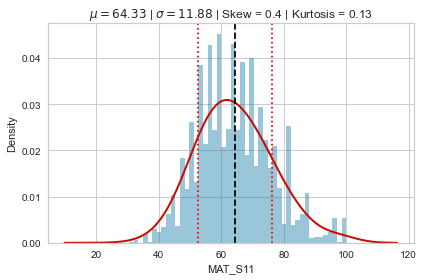

In [43]:
distribution(df.MAT_S11)

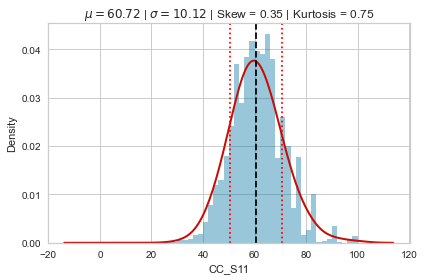

In [44]:
distribution(df.CC_S11)

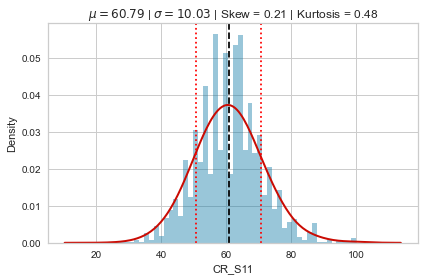

In [45]:
distribution(df.CR_S11)

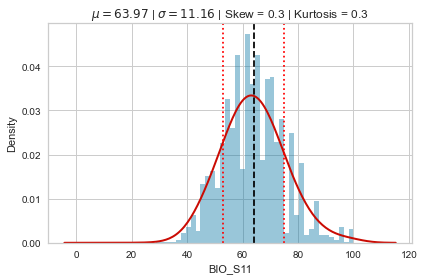

In [46]:
distribution(df.BIO_S11)

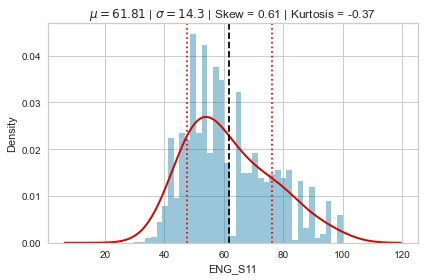

In [47]:
distribution(df.ENG_S11)

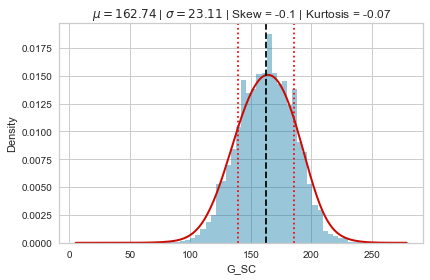

In [48]:
distribution(df.G_SC)

> All HS scores (except **ENG_S11**, which displays a light skewness to the left) follow close to a normal distribution, **G_PRO** exhibits a normal distribution as well. The **G_SC** variable will be used to set a target class variable: those students whose G_SC scores are below the mean score and those whose scores are equal to or above the mean score.

In [49]:
df_clean=df.copy()

## Splitting up the dataset into training subset and test subsets

> Splitting the cleaned df DataFrame before manipulating **G_SC** to create a final categorical target variable.

In [50]:
# Creating dependent and independent variables DataFrames out of df_clean
y = df_clean[['G_SC']].copy()
X = df_clean.drop(columns=['G_SC'], axis=1).copy()

In [51]:
# Split the data into a training and a test set
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=123)
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

(9284, 30) (9284, 1) (3095, 30) (3095, 1)


In [52]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9284 entries, 796 to 3582
Data columns (total 30 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   GENDER        9284 non-null   object
 1   EDU_FATHER    9284 non-null   object
 2   EDU_MOTHER    9284 non-null   object
 3   OCC_FATHER    9284 non-null   object
 4   OCC_MOTHER    9284 non-null   object
 5   STRATUM       9284 non-null   object
 6   SISBEN        9284 non-null   object
 7   PEOPLE_HOUSE  9284 non-null   int64 
 8   INTERNET      9284 non-null   object
 9   TV            9284 non-null   object
 10  COMPUTER      9284 non-null   object
 11  WASHING_MCH   9284 non-null   object
 12  MIC_OVEN      9284 non-null   object
 13  CAR           9284 non-null   object
 14  DVD           9284 non-null   object
 15  FRESH         9284 non-null   object
 16  PHONE         9284 non-null   object
 17  MOBILE        9284 non-null   object
 18  REVENUE       9284 non-null   object
 19  JOB 

In [53]:
y_train.head()

,G_SC
796,165
8185,134
6228,162
1116,185
7653,161


In [54]:
y_test.head()

,G_SC
7911,166
2473,141
5802,132
11893,158
715,157


## Creating a new categorical target variable **FAILING**.

In [55]:
G_SC_mean=y_train['G_SC'].mean()
print(G_SC_mean)

162.74224472210255


In [56]:
y_train_final, y_test_final = creating_failing(y_test,'G_SC')

In [57]:
y_train_final

,FAILING
796,0
8185,1
6228,1
1116,0
7653,1
...,...
5218,0
12252,0
1346,1
11646,1


In [58]:
pd.value_counts(y_train_final.FAILING)

0    4745
1    4539
Name: FAILING, dtype: int64

In [59]:
pd.value_counts(y_test_final.FAILING)

0    1562
1    1533
Name: FAILING, dtype: int64

> **The values are almost equally distributed between the classes**

# Model

## Checking training and test DataFrames

In [60]:
X_train.head()

,GENDER,EDU_FATHER,EDU_MOTHER,OCC_FATHER,OCC_MOTHER,STRATUM,SISBEN,PEOPLE_HOUSE,INTERNET,TV,...,SCHOOL_NAT,SCHOOL_TYPE,MAT_S11,CR_S11,CC_S11,BIO_S11,ENG_S11,SEL,SEL_IHE,PROG_UNIV
796,M,Unknown,Unknown,Unknown,Unknown,Stratum 2,It is not classified by the SISBEN,4,Yes,Yes,...,PUBLIC,TECHNICAL/ACADEMIC,70,64,68,72,52,2,2,MECHANICAL ENGINEERING_UNIVERSIDAD INDUSTRIAL ...
8185,M,Complete Secondary,Complete primary,Independent,Home,Stratum 2,It is not classified by the SISBEN,5,Yes,Yes,...,PUBLIC,TECHNICAL/ACADEMIC,63,53,60,58,52,2,2,Other
6228,M,Complete primary,Incomplete Secondary,Small entrepreneur,Small entrepreneur,Stratum 2,Level 2,4,No,Yes,...,PUBLIC,TECHNICAL/ACADEMIC,56,57,58,63,60,1,2,Other
1116,M,Incomplete Secondary,Incomplete Secondary,Operator,Home,Stratum 2,Level 1,5,No,Yes,...,PUBLIC,ACADEMIC,64,56,68,61,49,1,2,Other
7653,M,Complete professional education,Complete professional education,Other occupation,Independent professional,Stratum 3,Level 3,3,No,No,...,PRIVATE,ACADEMIC,63,64,55,64,67,4,4,Other


In [61]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9284 entries, 796 to 3582
Data columns (total 30 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   GENDER        9284 non-null   object
 1   EDU_FATHER    9284 non-null   object
 2   EDU_MOTHER    9284 non-null   object
 3   OCC_FATHER    9284 non-null   object
 4   OCC_MOTHER    9284 non-null   object
 5   STRATUM       9284 non-null   object
 6   SISBEN        9284 non-null   object
 7   PEOPLE_HOUSE  9284 non-null   int64 
 8   INTERNET      9284 non-null   object
 9   TV            9284 non-null   object
 10  COMPUTER      9284 non-null   object
 11  WASHING_MCH   9284 non-null   object
 12  MIC_OVEN      9284 non-null   object
 13  CAR           9284 non-null   object
 14  DVD           9284 non-null   object
 15  FRESH         9284 non-null   object
 16  PHONE         9284 non-null   object
 17  MOBILE        9284 non-null   object
 18  REVENUE       9284 non-null   object
 19  JOB 

In [62]:
X_test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3095 entries, 7911 to 8324
Data columns (total 30 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   GENDER        3095 non-null   object
 1   EDU_FATHER    3095 non-null   object
 2   EDU_MOTHER    3095 non-null   object
 3   OCC_FATHER    3095 non-null   object
 4   OCC_MOTHER    3095 non-null   object
 5   STRATUM       3095 non-null   object
 6   SISBEN        3095 non-null   object
 7   PEOPLE_HOUSE  3095 non-null   int64 
 8   INTERNET      3095 non-null   object
 9   TV            3095 non-null   object
 10  COMPUTER      3095 non-null   object
 11  WASHING_MCH   3095 non-null   object
 12  MIC_OVEN      3095 non-null   object
 13  CAR           3095 non-null   object
 14  DVD           3095 non-null   object
 15  FRESH         3095 non-null   object
 16  PHONE         3095 non-null   object
 17  MOBILE        3095 non-null   object
 18  REVENUE       3095 non-null   object
 19  JOB

 > The preprocessed independent variables training dataset has 9284 records with 30 columns, out of which 22 columns are categorical, and 8 columns are numerical. The test set has 3095 records.<br>

## Building Pipelines and ColumnTransformer and transforming the DateFrame

* Scale numerical columns <br>
* One-hot encode categorical columns

In [63]:
# Creating a list of numerical columns

numeric_cols=list(X_train.select_dtypes('int64').columns)
print(numeric_cols)

['PEOPLE_HOUSE', 'MAT_S11', 'CR_S11', 'CC_S11', 'BIO_S11', 'ENG_S11', 'SEL', 'SEL_IHE']


In [64]:
# Creating a list of categorical columns

categorical_cols=list(X_train.select_dtypes('object').columns) 
print(categorical_cols)

['GENDER', 'EDU_FATHER', 'EDU_MOTHER', 'OCC_FATHER', 'OCC_MOTHER', 'STRATUM', 'SISBEN', 'INTERNET', 'TV', 'COMPUTER', 'WASHING_MCH', 'MIC_OVEN', 'CAR', 'DVD', 'FRESH', 'PHONE', 'MOBILE', 'REVENUE', 'JOB', 'SCHOOL_NAT', 'SCHOOL_TYPE', 'PROG_UNIV']


In [65]:
# Creating a simple one step pipeline for numerical columns standardization

num_pipe = Pipeline([
    ('scaler', MinMaxScaler())])

num_pipe

Pipeline(steps=[('scaler', MinMaxScaler())])

In [66]:
# Creating a simple pipeline to impute the 'Unknown' values in all categorical columns
# with the most frequent value and encode all categorical columns using OneHotEncoder

cat_pipe = Pipeline([('imputer', SimpleImputer(strategy='most_frequent', missing_values='Unknown')),
                     ('encoder', OneHotEncoder(sparse=False, drop='first'))])
cat_pipe

Pipeline(steps=[('imputer',
                 SimpleImputer(missing_values='Unknown',
                               strategy='most_frequent')),
                ('encoder', OneHotEncoder(drop='first', sparse=False))])

In [67]:
# Creating preprocessing column transformer (for both numeric and categorical columns)

set_config(display='diagram')

preprocessor = ColumnTransformer([
    ('num',num_pipe,numeric_cols),
    ('cat',cat_pipe,categorical_cols)
])

preprocessor

ColumnTransformer(transformers=[('num',
                                 Pipeline(steps=[('scaler', MinMaxScaler())]),
                                 ['PEOPLE_HOUSE', 'MAT_S11', 'CR_S11', 'CC_S11',
                                  'BIO_S11', 'ENG_S11', 'SEL', 'SEL_IHE']),
                                ('cat',
                                 Pipeline(steps=[('imputer',
                                                  SimpleImputer(missing_values='Unknown',
                                                                strategy='most_frequent')),
                                                 ('encoder',
                                                  OneHotEncoder(drop='first',
                                                                sparse=False))]),
                                 ['GENDER', 'EDU_FATHER', 'EDU_MOTHER',
                                  'OCC_FATHER', 'OCC_MOTHER', 'STRATUM',
                                  'SISBEN', 'INTERNET', 'TV', 'COMPUTER',
                                  'WASHING_MCH', 'MIC_OVEN', 'CAR', 'DVD',
                                  'FRESH', 'PHONE', 'MOBILE', 'REVENUE', 'JOB',
                                  'SCHOOL_NAT', 'SCHOOL_TYPE', 'PROG_UNIV'])])

In [68]:
# Testing fitting the transformer and transforming the test dataset
X_train_tf = preprocessor.fit_transform(X_train)
X_test_tf = preprocessor.transform(X_test)
X_test_tf

array([[0.16666667, 0.41891892, 0.5       , ..., 0.        , 0.        ,
        1.        ],
       [0.25      , 0.43243243, 0.39473684, ..., 0.        , 0.        ,
        1.        ],
       [0.25      , 0.2972973 , 0.25      , ..., 0.        , 0.        ,
        1.        ],
       ...,
       [0.41666667, 0.59459459, 0.47368421, ..., 0.        , 0.        ,
        1.        ],
       [0.25      , 0.58108108, 0.47368421, ..., 0.        , 0.        ,
        0.        ],
       [0.41666667, 0.82432432, 0.67105263, ..., 0.        , 0.        ,
        1.        ]])

In [69]:
# Creating a list of encoded categorical columns names
cat_features = list(preprocessor.named_transformers_['cat'].named_steps['encoder']\
                            .get_feature_names(categorical_cols))
len(cat_features)

124

> **There are 124 categorical columns with binary values (0,1)**

In [70]:
# Creating a list of all columns
X_cols = numeric_cols+cat_features
len(X_cols)

132

In [71]:
# Creating 2 lists of columns, one containing SocioEconomic features and another one only university-program combination names

X_cols_UNVPRG=[c for c in X_cols if 'PROG_' in c]
X_cols_SE=list(set(X_cols)-set(X_cols_UNVPRG))

In [72]:
#Creating two dataframes out of the arrays generated by preprocessing. Columns are X_cols
X_train_df = pd.DataFrame(preprocessor.transform(X_train),
                           index=X_train.index, columns=X_cols)
X_test_df = pd.DataFrame(preprocessor.transform(X_test),
                           index=X_test.index, columns=X_cols)

In [73]:
# Spliting the above dataframes with all Features into two: SocioEconomic/HS scores and University/Program names

X_test_df_UNVPRG=X_test_df[X_cols_UNVPRG].copy()
X_test_df_SE=X_test_df[X_cols_SE].copy()


X_train_df_UNVPRG=X_train_df[X_cols_UNVPRG].copy()
X_train_df_SE=X_train_df[X_cols_SE].copy()

* X_train_df_UNVPRG and X_test_df_UNVPRG have **52 columns** each
* X_train_df_SE and X_test_df_SE have **80 columns** each

## Building and evaluating simple models

### Correlation map of SocioEconomic/HS scores features

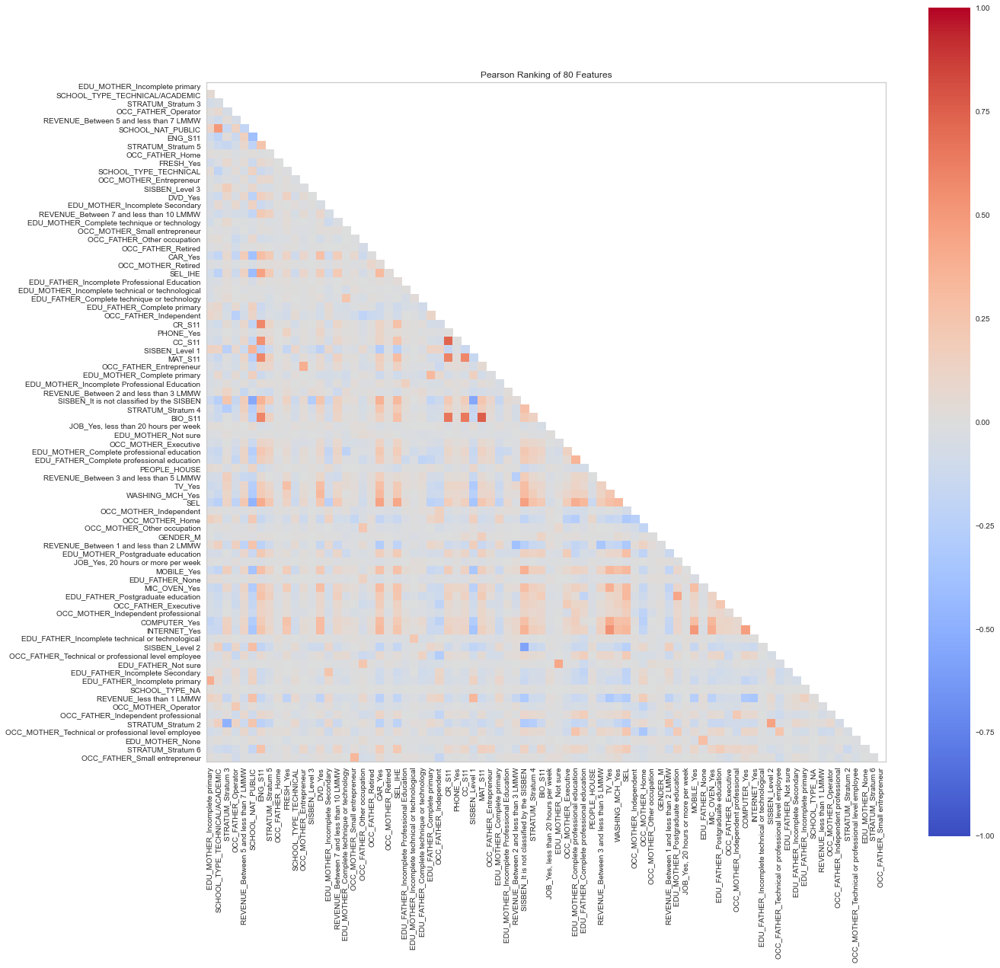

<AxesSubplot:title={'center':'Pearson Ranking of 80 Features'}>

In [74]:
# Instantiate the visualizer (Yellowbrick) with the Pearson ranking algorithm

fig,ax = plt.subplots(figsize=(20,20))
visualizer = Rank2D(algorithm='pearson', colormap='coolwarm', ax=ax, features=list(X_train_df_SE.columns))

# Fit the data to the visualizer
visualizer.fit(X_train_df_SE, y_train_final)

# Transform the data
visualizer.transform(X_train_df_SE)

visualizer.show()                                     

> There are not very many correlations in the set, though there are some between HS subject scores and socioeconomic indicators like owning a car and SEL value.

### Building and evaluating a DummyClassifier model

In [75]:
#Building a dummy model with DummyClassifier. I am using the whole dataset (no split between the features)

dummy_num_model_new=DummyClassifier(strategy='most_frequent')
dummy_num_model_new.fit(X_train, y_train_final)

DummyClassifier(strategy='most_frequent')

***************************************
DummyClassifier(strategy='most_frequent')
***************************************

Classification Report for training set
***************************************
              precision    recall  f1-score   support

           0       0.51      1.00      0.68      4745
           1       0.00      0.00      0.00      4539

    accuracy                           0.51      9284
   macro avg       0.26      0.50      0.34      9284
weighted avg       0.26      0.51      0.35      9284


Classification Report for test set
***************************************
              precision    recall  f1-score   support

           0       0.50      1.00      0.67      1562
           1       0.00      0.00      0.00      1533

    accuracy                           0.50      3095
   macro avg       0.25      0.50      0.34      3095
weighted avg       0.25      0.50      0.34      3095


***************************************
Differences in Accuracy sco

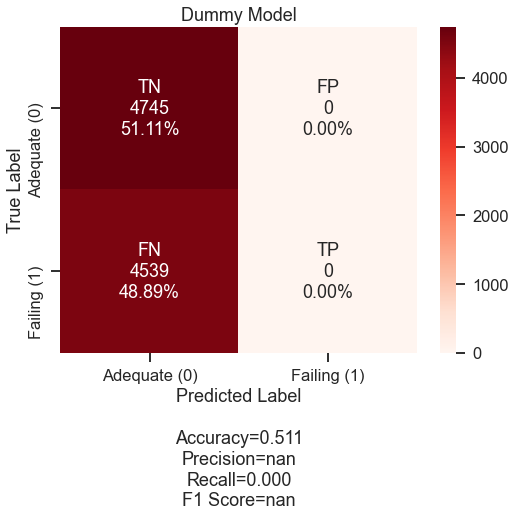

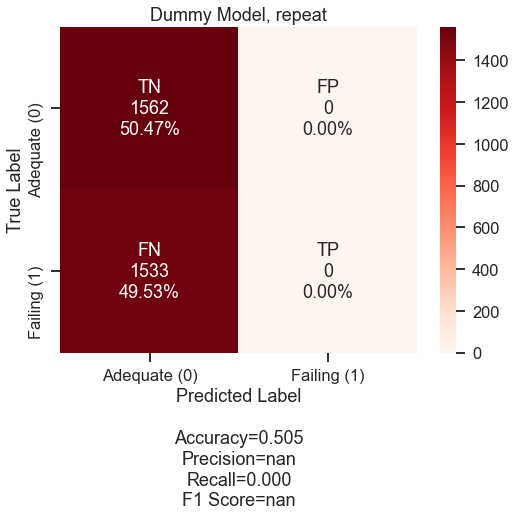

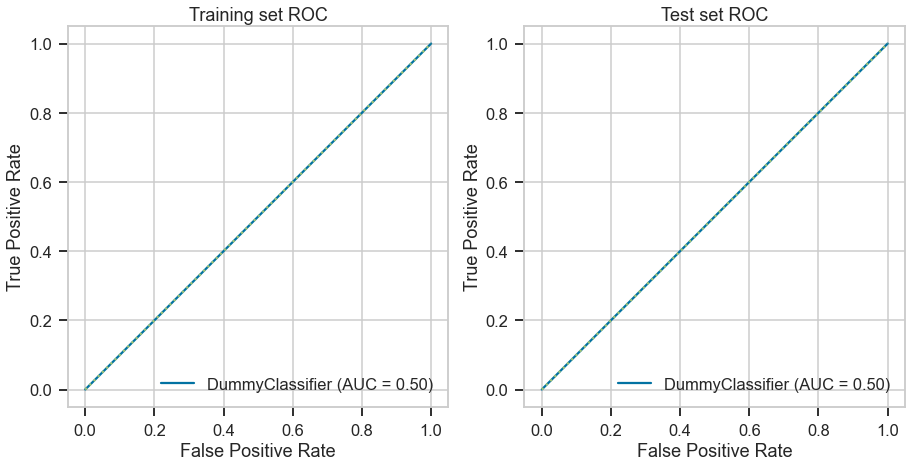

In [76]:
# Displaying the metrics and the confusion matrix for the model 

set_dummy=[X_train, X_test, y_train_final, y_test_final]
simple_model_validation(dummy_num_model_new, set_dummy,'Dummy Model', 'Dummy Model, repeat')

 > The model predicts the most frequent value (0), accuracy score is about 0.51. It is our Baseline model.

In [77]:
# Setting up empty dictionaries to accumulate model info for easier comparison

# For models with SocioEconomic/HS scores features
models_dict_se={'Classifier Name':[], 'Description':[],'Training or Test': [],
             'Accuracy':[],'Recall':[], 'FN':[], 'Total number of records':[], 'Saved model':[]}

# For models with University/Program features
models_dict_up={'Classifier Name':[], 'Description':[],'Training or Test': [],
             'Accuracy':[],'Recall':[], 'FN':[], 'Total number of records':[], 'Saved model':[]}

In [78]:
# Creating lists with training/test dataframe names to use with models evaluation functions

# SocioEconomic/HS scores features
SE_list=[X_train_df_SE, X_test_df_SE, y_train_final, y_test_final]

# University/Program features
UNVPRG_list=[X_train_df_UNVPRG, X_test_df_UNVPRG, y_train_final, y_test_final]

### Building Logistic Regression models with SocioEconomic/HS scores features

#### Building and evaluating a Logistic Regression model with default parameters

In [79]:
logreg_model1_new=LogisticRegression(random_state=123)
logreg_model1_new.fit(X_train_df_SE, y_train_final)

LogisticRegression(random_state=123)

***************************************
LogisticRegression(random_state=123)
***************************************

Classification Report for training set
***************************************
              precision    recall  f1-score   support

           0       0.82      0.81      0.82      4745
           1       0.81      0.82      0.81      4539

    accuracy                           0.81      9284
   macro avg       0.81      0.81      0.81      9284
weighted avg       0.81      0.81      0.81      9284


Classification Report for test set
***************************************
              precision    recall  f1-score   support

           0       0.81      0.81      0.81      1562
           1       0.80      0.80      0.80      1533

    accuracy                           0.80      3095
   macro avg       0.80      0.80      0.80      3095
weighted avg       0.80      0.80      0.80      3095


***************************************
Differences in Accuracy scores b

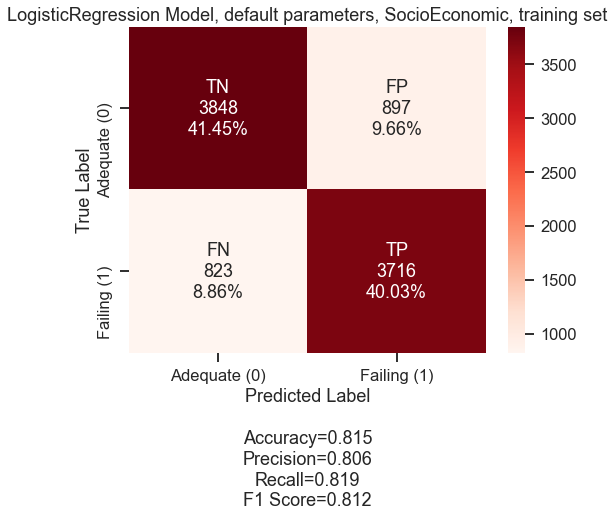

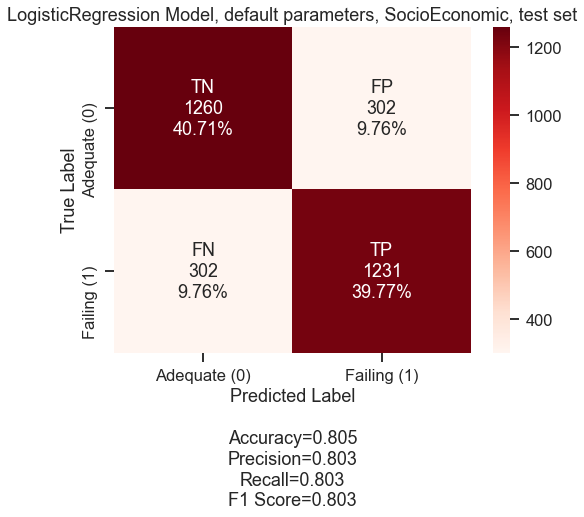

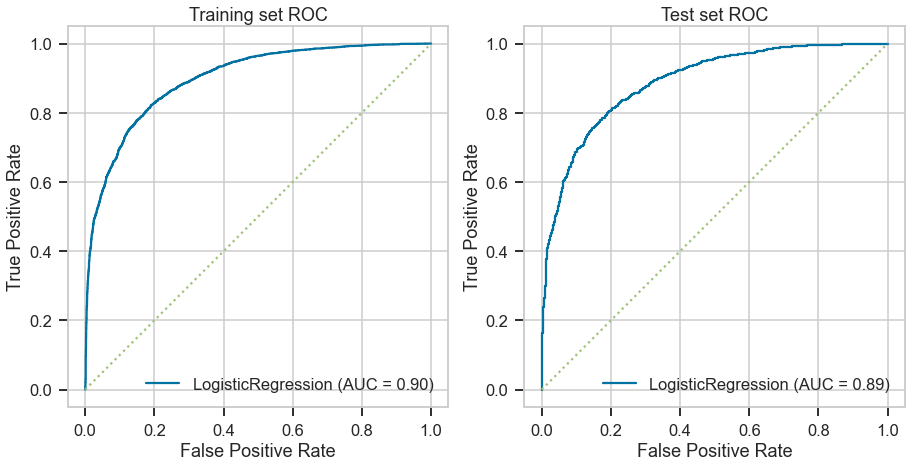

In [80]:
simple_model_validation(logreg_model1_new, SE_list,'LogisticRegression Model, default parameters, SocioEconomic, training set',
                       'LogisticRegression Model, default parameters, SocioEconomic, test set')

In [81]:
se_models_dict=adding_to_models_dict(models_dict_se,'LogisticRegressionClassifier, default params', 'logreg_model1_new',
                                     SE_list, logreg_model1_new, 'not saved')

In [82]:
SE_df_models=pd.DataFrame(se_models_dict)
SE_df_models

,Classifier Name,Description,Training or Test,Accuracy,Recall,FN,Total number of records,Saved model
0,logreg_model1_new,"LogisticRegressionClassifier, default params",training,0.815,0.819,823,9284,not saved
1,logreg_model1_new,"LogisticRegressionClassifier, default params",test,0.805,0.803,302,3095,not saved


> The validation metrics of the model are much better than the metrics of the Baseline model. The most important model validation metrics is Recall (Identification of students who are falling behind).<br>

* Training set recall is 0.819<br>
* Test set Recall is 0.803

#### GridSearch best parameters for a Logistic Regression model

In [83]:
# params = {'solver':['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
#          'penalty':['l1', 'l2', 'none'],
#           'class_weight': [None,'balanced'],
#          'C': [0.1, 1, 10, 100, 1000],
#          'max_iter':[25,100, 200, 300]}

# ## Instantiate & Fit GridSearchCV
# gridsearch = GridSearchCV(LogisticRegression(random_state=123), params, n_jobs=-1,
#                           cv=5, verbose=2, scoring = 'recall')
# gridsearch.fit(X_train_df_SE, y_train_final)


In [84]:
# gridsearch.best_score_

In [85]:
# gridsearch.best_estimator_

In [86]:
# joblib.dump(gridsearch.best_estimator_, 'models/se_progress/LR_best_se_new.joblib')

#### Building and evaluating  the best parameters Logistic Regression model

In [87]:
log_reg_model2_new=joblib.load('models/se_progress/LR_best_se_new.joblib')

In [88]:
log_reg_model2_new.fit(X_train_df_SE, y_train_final)

LogisticRegression(C=0.1, class_weight='balanced', max_iter=25, penalty='l1',
                   random_state=123, solver='saga')

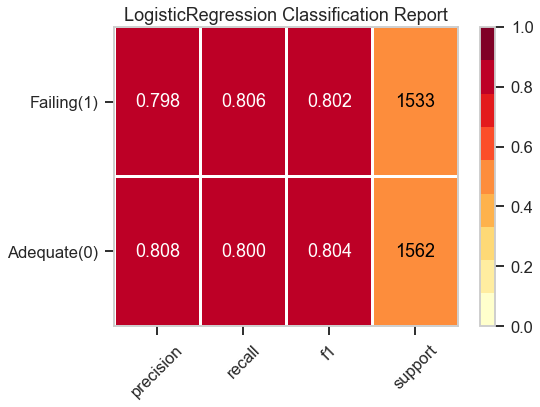

In [89]:
viz = ClassificationReport(log_reg_model2_new,
                           classes=['Adequate(0)', 'Failing(1)'],
                           support=True,
                           fig=plt.figure(figsize=(8,6)))

viz.fit(X_train_df_SE, y_train_final)

viz.score(X_test_df_SE, y_test_final)

viz.show();

***************************************
LogisticRegression(C=0.1, class_weight='balanced', max_iter=25, penalty='l1',
                   random_state=123, solver='saga')
***************************************

Classification Report for training set
***************************************
              precision    recall  f1-score   support

           0       0.83      0.80      0.81      4745
           1       0.80      0.83      0.81      4539

    accuracy                           0.81      9284
   macro avg       0.81      0.81      0.81      9284
weighted avg       0.81      0.81      0.81      9284


Classification Report for test set
***************************************
              precision    recall  f1-score   support

           0       0.81      0.80      0.80      1562
           1       0.80      0.81      0.80      1533

    accuracy                           0.80      3095
   macro avg       0.80      0.80      0.80      3095
weighted avg       0.80      0.80  

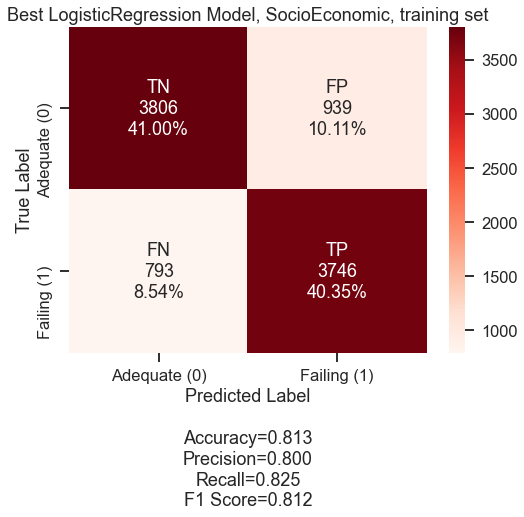

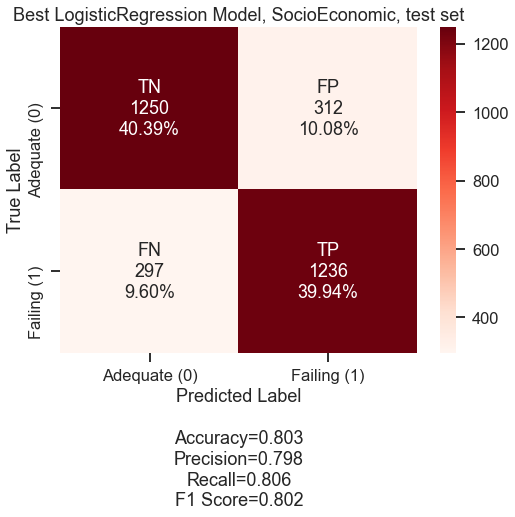

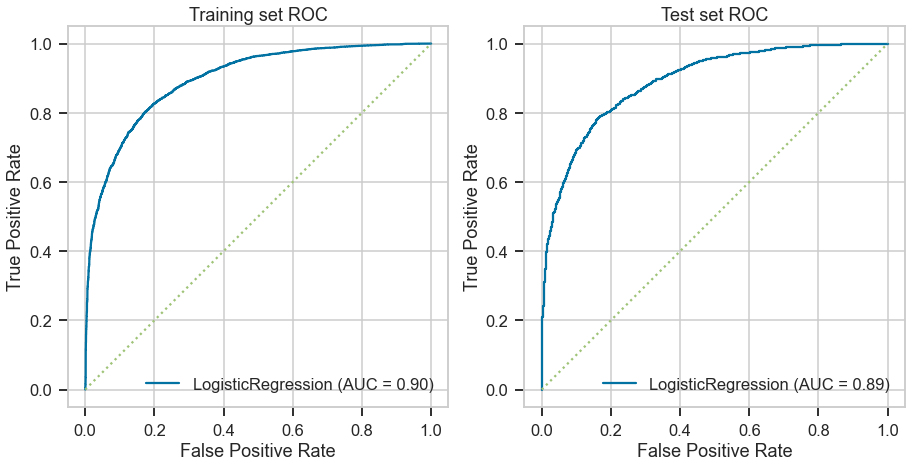

In [90]:
simple_model_validation(log_reg_model2_new, SE_list,
                        'Best LogisticRegression Model, SocioEconomic, training set',
                        'Best LogisticRegression Model, SocioEconomic, test set')

In [91]:
se_models_dict=adding_to_models_dict(models_dict_se,'LogisticRegressionClassifier, best params', 'log_reg_model2_new', 
                                      SE_list, log_reg_model2_new,'models/se_progress/LR_best_se_new.joblib')

> Best parameters LogisticRegression model shows some improvement over the model with default parameters. The improvement is superficial.

**Recall score increased**
* Training set: from 0.819 to 0.825<br>
* Test set: from 0.803 to 0.806

#### Gridsearch best parameters for a LogisticRegressionCV model

In [92]:
# params = {'solver':['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
#          'penalty':['l1', 'l2'],
#           'scoring':['recall','accuracy','f1'],
#          'class_weight': [None,'balanced'],
#          'max_iter':[25, 100, 200, 300]}

# ## Instantiate & Fit GridSearchCV
# gridsearch = GridSearchCV(LogisticRegressionCV(random_state=123), params, n_jobs=-1,
#                           cv=5, verbose=2, scoring='recall')
# gridsearch.fit(X_train_df_SE, y_train_final)


In [93]:
# gridsearch.best_score_

In [94]:
# gridsearch.best_estimator_

In [95]:
# joblib.dump(gridsearch.best_estimator_, 'models/se_progress/LR_best_se_CV_new.joblib')

#### Building and evaluating  the best parameter LogisticRegressionCV model

In [96]:
log_reg_model2_CV_new=joblib.load('models/se_progress/LR_best_se_CV_new.joblib')

In [97]:
log_reg_model2_CV_new.fit(X_train_df_SE, y_train_final)

LogisticRegressionCV(class_weight='balanced', max_iter=25, penalty='l1',
                     random_state=123, scoring='recall', solver='saga')

***************************************
LogisticRegressionCV(class_weight='balanced', max_iter=25, penalty='l1',
                     random_state=123, scoring='recall', solver='saga')
***************************************

Classification Report for training set
***************************************
              precision    recall  f1-score   support

           0       0.82      0.74      0.78      4745
           1       0.75      0.83      0.79      4539

    accuracy                           0.79      9284
   macro avg       0.79      0.79      0.79      9284
weighted avg       0.79      0.79      0.79      9284


Classification Report for test set
***************************************
              precision    recall  f1-score   support

           0       0.81      0.74      0.78      1562
           1       0.76      0.83      0.79      1533

    accuracy                           0.78      3095
   macro avg       0.79      0.78      0.78      3095
weighted avg       0

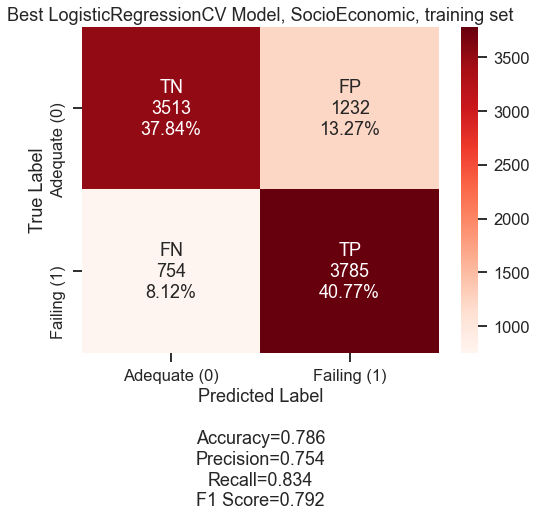

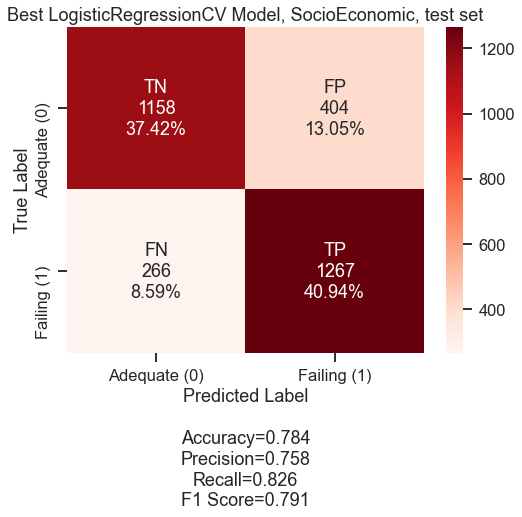

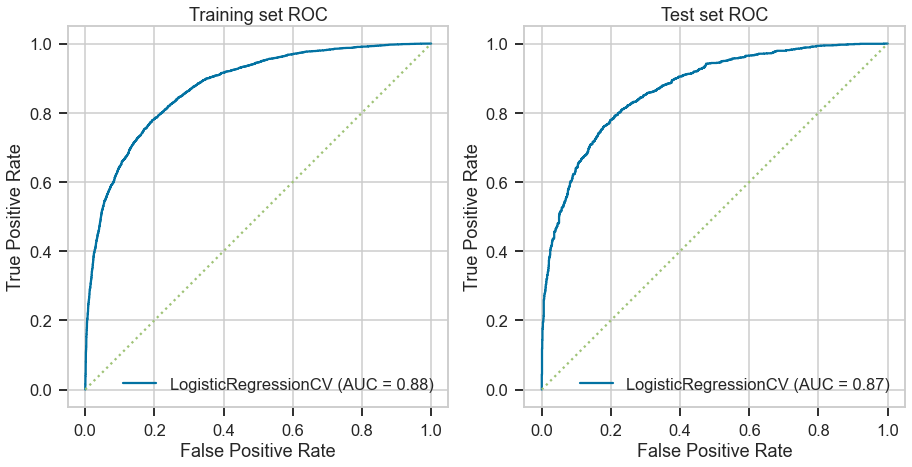

In [98]:
 simple_model_validation(log_reg_model2_CV_new, SE_list,
                        'Best LogisticRegressionCV Model, SocioEconomic, training set',
                        'Best LogisticRegressionCV Model, SocioEconomic, test set')

In [99]:
se_models_dict=adding_to_models_dict(models_dict_se, 'LogisticRegressionClassifierCV, best params', 'log_reg_model2_CV_new', 
                                      SE_list, log_reg_model2_CV_new,'models/se_progress/LR_best_se_CV_new.joblib')

In [100]:
SE_df_models=pd.DataFrame(se_models_dict)
SE_df_models

,Classifier Name,Description,Training or Test,Accuracy,Recall,FN,Total number of records,Saved model
0,logreg_model1_new,"LogisticRegressionClassifier, default params",training,0.815,0.819,823,9284,not saved
1,logreg_model1_new,"LogisticRegressionClassifier, default params",test,0.805,0.803,302,3095,not saved
2,log_reg_model2_new,"LogisticRegressionClassifier, best params",training,0.813,0.825,793,9284,models/se_progress/LR_best_se_new.joblib
3,log_reg_model2_new,"LogisticRegressionClassifier, best params",test,0.803,0.806,297,3095,models/se_progress/LR_best_se_new.joblib
4,log_reg_model2_CV_new,"LogisticRegressionClassifierCV, best params",training,0.786,0.834,754,9284,models/se_progress/LR_best_se_CV_new.joblib
5,log_reg_model2_CV_new,"LogisticRegressionClassifierCV, best params",test,0.784,0.826,266,3095,models/se_progress/LR_best_se_CV_new.joblib


> Best parameters LogisticRegressionCV model shows some improvement over the LogisticRegression model with best parameters.

**Recall score increased**
* Training set: from 0.825 to 0.834
* Test set: from 0.806 to 0.826

### Building Logistic Regression models with Program/University features

#### Building and evaluating  a Logistic Regression model with default parameters

In [101]:
logreg_model3_new=LogisticRegression(random_state=123)
logreg_model3_new.fit(X_train_df_UNVPRG, y_train_final)

LogisticRegression(random_state=123)

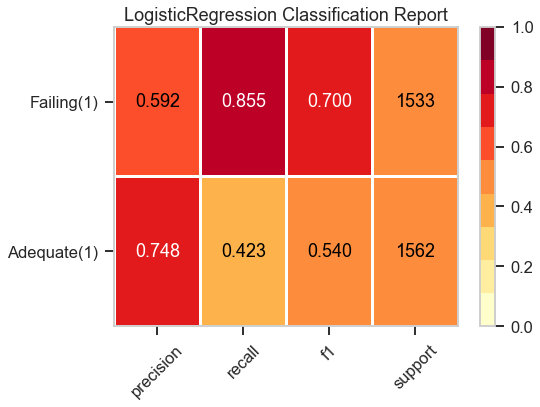

In [102]:
viz = ClassificationReport(logreg_model3_new,
                           classes=['Adequate(1)', 'Failing(1)'],
                           support=True,
                           fig=plt.figure(figsize=(8,6)))

viz.fit(X_train_df_UNVPRG, y_train_final)

viz.score(X_test_df_UNVPRG, y_test_final)

viz.show();

***************************************
LogisticRegression(random_state=123)
***************************************

Classification Report for training set
***************************************
              precision    recall  f1-score   support

           0       0.76      0.41      0.53      4745
           1       0.58      0.87      0.70      4539

    accuracy                           0.63      9284
   macro avg       0.67      0.64      0.62      9284
weighted avg       0.68      0.63      0.61      9284


Classification Report for test set
***************************************
              precision    recall  f1-score   support

           0       0.75      0.42      0.54      1562
           1       0.59      0.85      0.70      1533

    accuracy                           0.64      3095
   macro avg       0.67      0.64      0.62      3095
weighted avg       0.67      0.64      0.62      3095


***************************************
Differences in Accuracy scores b

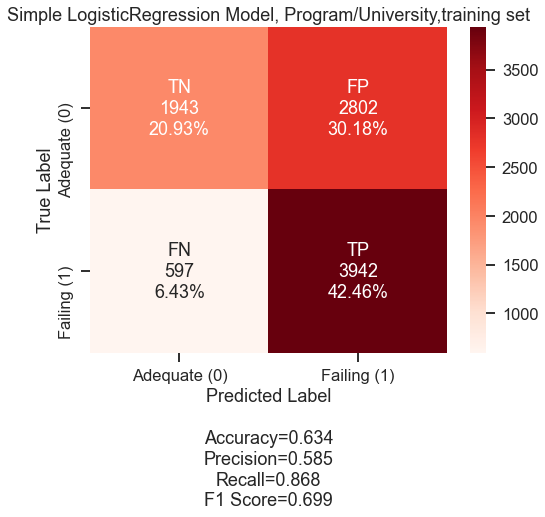

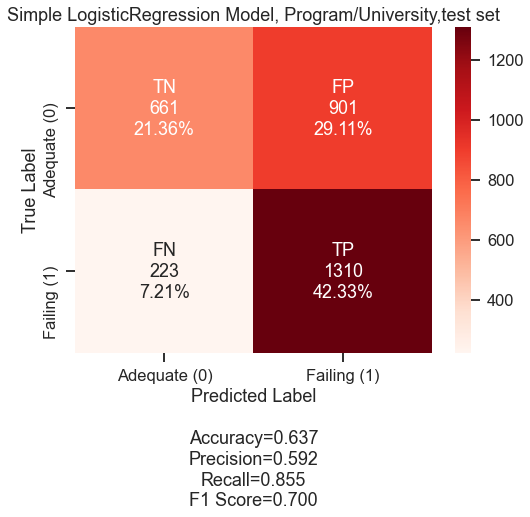

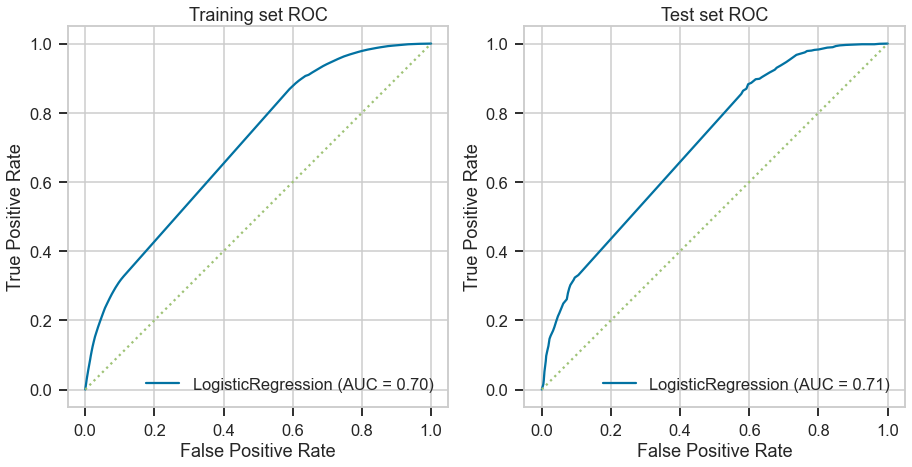

In [103]:
simple_model_validation(logreg_model3_new, UNVPRG_list,
                        'Simple LogisticRegression Model, Program/University,training set',
                        'Simple LogisticRegression Model, Program/University,test set')

In [104]:
unvprg_models_dict=adding_to_models_dict(models_dict_up,'LogisticRegressionClassifier, default params',
                                         'logreg_model3_new', UNVPRG_list, logreg_model3_new, 'not saved')

In [105]:
UNVPRG_df_models=pd.DataFrame(unvprg_models_dict)
UNVPRG_df_models

,Classifier Name,Description,Training or Test,Accuracy,Recall,FN,Total number of records,Saved model
0,logreg_model3_new,"LogisticRegressionClassifier, default params",training,0.634,0.868,597,9284,not saved
1,logreg_model3_new,"LogisticRegressionClassifier, default params",test,0.637,0.855,223,3095,not saved


#### GridSearch best parameters for a Logistic Regression model

In [106]:
# params = {'solver':['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
#          'penalty':['l1', 'l2', 'none'],
#           'class_weight': [None,'balanced'],
#          'C': [0.1, 1, 10, 100, 1000],
#          'max_iter':[25, 100, 200, 300]}

# ## Instantiate & Fit GridSearchCV
# gridsearch = GridSearchCV(LogisticRegression(random_state=123), params, n_jobs=-1,
#                           cv=5, verbose=2, scoring = 'accuracy')
# gridsearch.fit(X_train_df_UNVPRG, y_train_final)


In [107]:
# gridsearch.best_score_

In [108]:
# gridsearch.best_estimator_

In [109]:
# joblib.dump(gridsearch.best_estimator_, 'models/up_progress/LR_best_up_new.joblib')

#### Building the best parameters Logistic Regression model

In [110]:
log_reg_model4_new=joblib.load('models/up_progress/LR_best_up_new.joblib')

In [111]:
log_reg_model4_new.fit(X_train_df_UNVPRG, y_train_final)

LogisticRegression(C=0.1, max_iter=25, penalty='none', random_state=123,
                   solver='newton-cg')

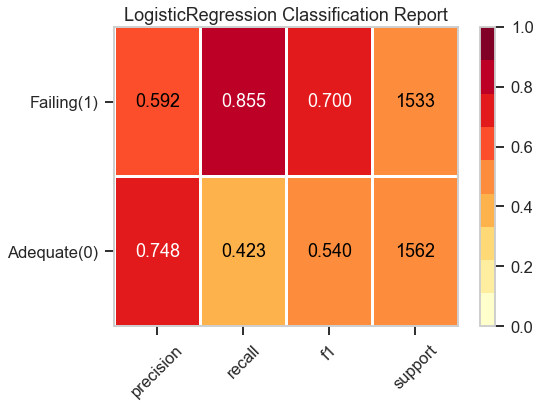

In [112]:
viz = ClassificationReport(log_reg_model4_new,
                           classes=['Adequate(0)', 'Failing(1)'],
                           support=True,
                           fig=plt.figure(figsize=(8,6)))

viz.fit(X_train_df_UNVPRG, y_train_final)

viz.score(X_test_df_UNVPRG, y_test_final)

viz.show();

***************************************
LogisticRegression(C=0.1, max_iter=25, penalty='none', random_state=123,
                   solver='newton-cg')
***************************************

Classification Report for training set
***************************************
              precision    recall  f1-score   support

           0       0.76      0.41      0.53      4745
           1       0.58      0.87      0.70      4539

    accuracy                           0.63      9284
   macro avg       0.67      0.64      0.62      9284
weighted avg       0.68      0.63      0.61      9284


Classification Report for test set
***************************************
              precision    recall  f1-score   support

           0       0.75      0.42      0.54      1562
           1       0.59      0.85      0.70      1533

    accuracy                           0.64      3095
   macro avg       0.67      0.64      0.62      3095
weighted avg       0.67      0.64      0.62      3095

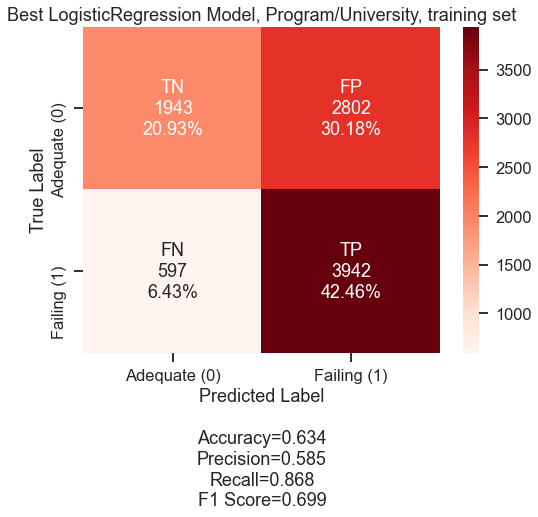

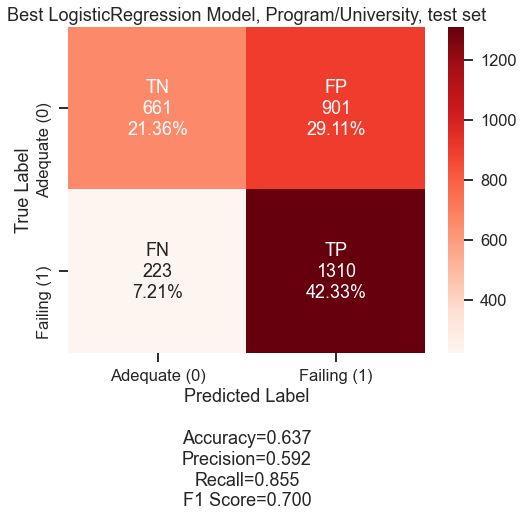

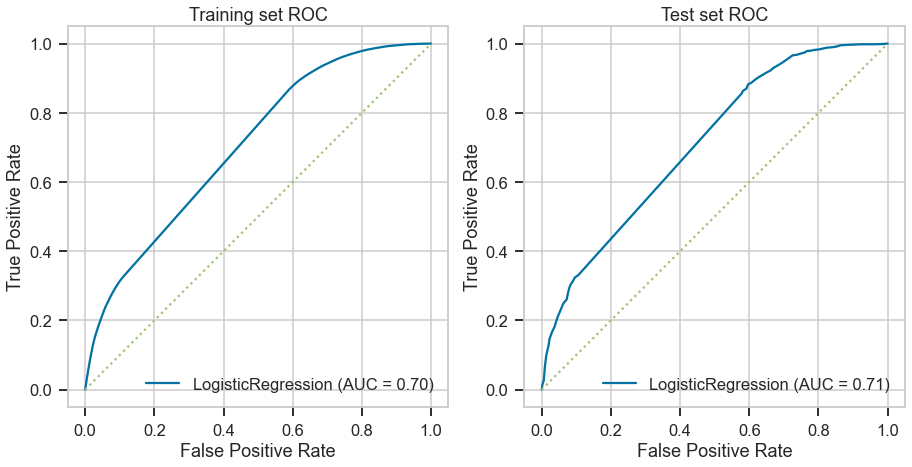

In [113]:
simple_model_validation(log_reg_model4_new, UNVPRG_list,
                        'Best LogisticRegression Model, Program/University, training set',
                        'Best LogisticRegression Model, Program/University, test set')

In [114]:
unvprg_models_dict=adding_to_models_dict(models_dict_up,'LogisticRegressionClassifier, best params', 'log_reg_model4_new',
                                          UNVPRG_list, log_reg_model4_new, 'models/up_progress/LR_best_up_new.joblib')

> The optimization of the model did not change the scores. Possibly due to the nature of the task, there is no ambiguity which universities provide better education.

### Building DecisionTree models with SocioEconomic/HS scores features

#### Building and evaluating  a DecisionTree model with default parameters

In [115]:
DT_classifier1_new = DecisionTreeClassifier(random_state=123)  
DT_classifier1_new.fit(X_train_df_SE, y_train_final)

DecisionTreeClassifier(random_state=123)

***************************************
DecisionTreeClassifier(random_state=123)
***************************************

Classification Report for training set
***************************************
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      4745
           1       1.00      1.00      1.00      4539

    accuracy                           1.00      9284
   macro avg       1.00      1.00      1.00      9284
weighted avg       1.00      1.00      1.00      9284


Classification Report for test set
***************************************
              precision    recall  f1-score   support

           0       0.72      0.72      0.72      1562
           1       0.71      0.71      0.71      1533

    accuracy                           0.72      3095
   macro avg       0.72      0.72      0.72      3095
weighted avg       0.72      0.72      0.72      3095


***************************************
Differences in Accuracy scor

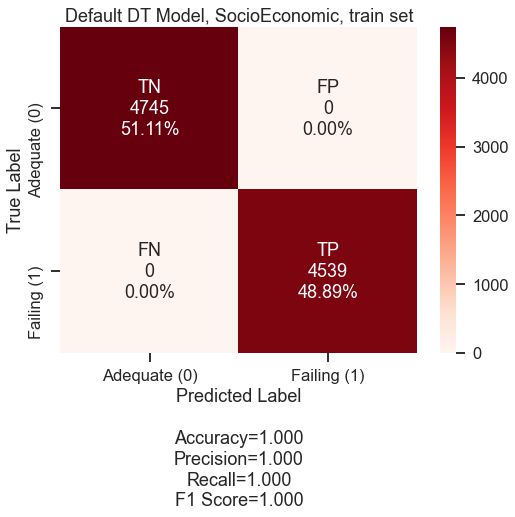

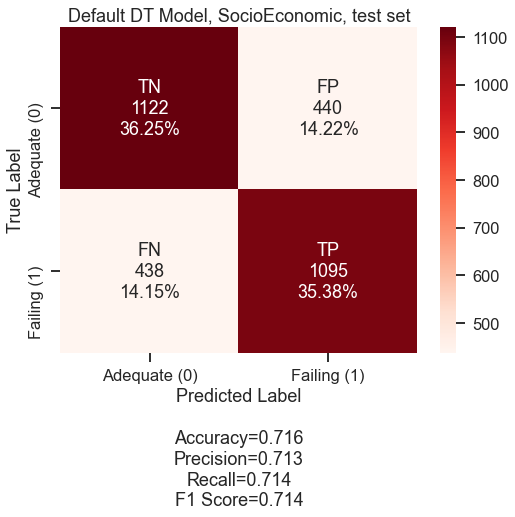

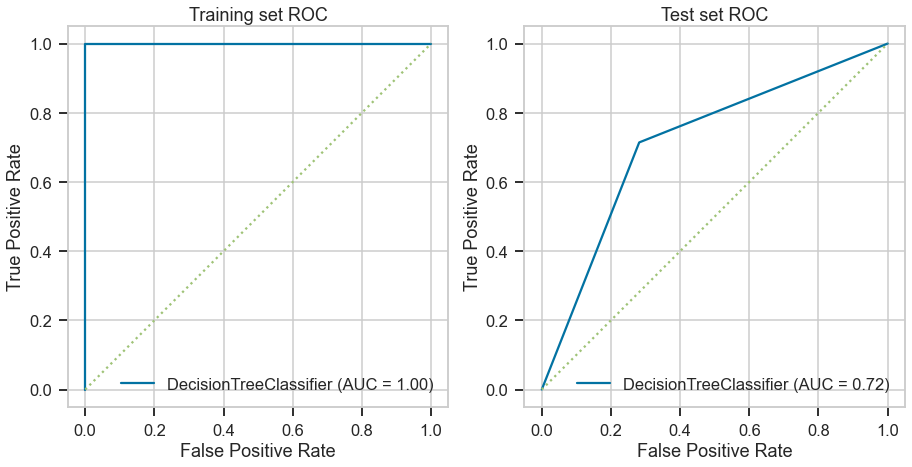

In [116]:
simple_model_validation(DT_classifier1_new, SE_list,
                        'Default DT Model, SocioEconomic, train set',
                        'Default DT Model, SocioEconomic, test set')

In [117]:
se_models_dict=adding_to_models_dict(models_dict_se,'DecisionTreeClassifier, default params',
                                     'DT_classifier1_new', SE_list, DT_classifier1_new, 'not saved')

> The over-fitting of the model is very pronounced.

#### GridSearch  best parameters for a DecisionTree model

In [118]:
# params = {'criterion':['gini', 'entropy'],
#          'splitter':['best', 'random'],
#          'max_depth': [4, 5, 6, 10],
#          'min_samples_leaf': [2,3,5, 10],
#          'class_weight':[None, 'balanced'],
#          'max_features':['auto',10,30,70, None]}

# ## Instantiate & Fit GridSearchCV
# gridsearch = GridSearchCV(DecisionTreeClassifier(random_state=123), params, n_jobs=-1,
#                           cv=5, verbose=2, scoring = 'recall')
# gridsearch.fit(X_train_df_SE, y_train_final)


In [119]:
# gridsearch.best_estimator_

In [120]:
# gridsearch.best_score_

In [121]:
# joblib.dump(gridsearch.best_estimator_, 'models/se_progress/DT_best_se_new.joblib')

#### Building and evaluating  the best parameters DecisionTreen mode

In [122]:
DT_classifier2_new = joblib.load('models/se_progress/DT_best_se_new.joblib')

In [123]:
DT_classifier2_new.fit(X_train_df_SE, y_train_final)

DecisionTreeClassifier(class_weight='balanced', max_depth=5, max_features=10,
                       min_samples_leaf=2, random_state=123, splitter='random')

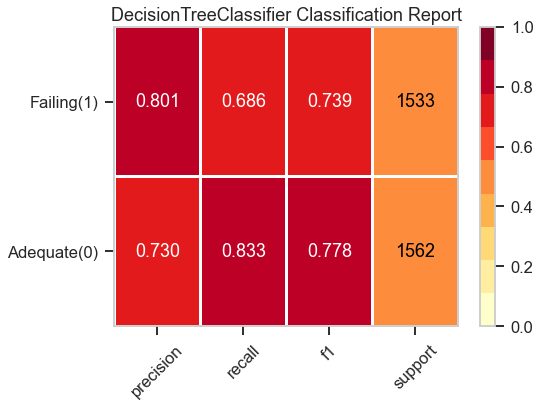

In [124]:
viz = ClassificationReport(DT_classifier2_new,
                           classes=['Adequate(0)', 'Failing(1)'],
                           support=True,
                           fig=plt.figure(figsize=(8,6)))

viz.fit(X_train_df_SE, y_train_final)

viz.score(X_test_df_SE, y_test_final)

viz.show();

***************************************
DecisionTreeClassifier(class_weight='balanced', max_depth=5, max_features=10,
                       min_samples_leaf=2, random_state=123, splitter='random')
***************************************

Classification Report for training set
***************************************
              precision    recall  f1-score   support

           0       0.74      0.84      0.79      4745
           1       0.81      0.68      0.74      4539

    accuracy                           0.76      9284
   macro avg       0.77      0.76      0.76      9284
weighted avg       0.77      0.76      0.76      9284


Classification Report for test set
***************************************
              precision    recall  f1-score   support

           0       0.73      0.83      0.78      1562
           1       0.80      0.69      0.74      1533

    accuracy                           0.76      3095
   macro avg       0.77      0.76      0.76      3095
weighte

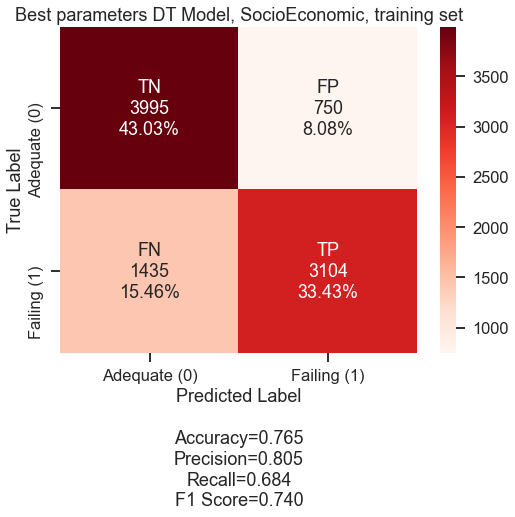

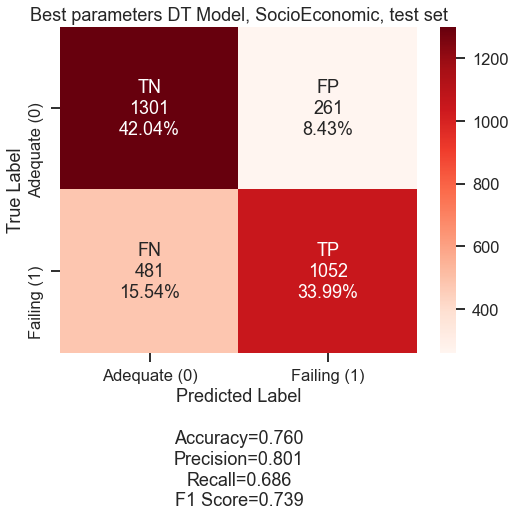

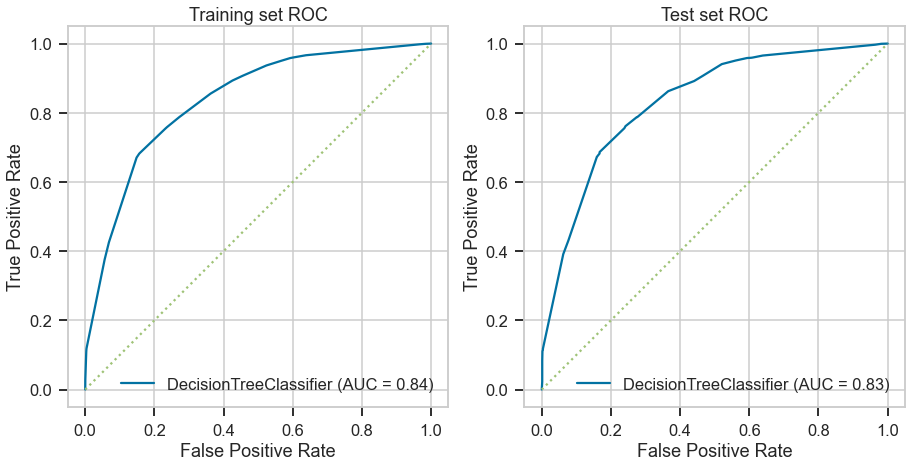

In [125]:
simple_model_validation(DT_classifier2_new, SE_list,
                        'Best parameters DT Model, SocioEconomic, training set',
                        'Best parameters DT Model, SocioEconomic, test set')

In [126]:
se_models_dict=adding_to_models_dict(models_dict_se,'DecisionTreeClassifier, best params','DT_classifier2_new', 
                                     SE_list, DT_classifier2_new, 'models/se_progress/DT_best_se_new.joblib')

> The performance of the DecisionTreeClassifier with best parameters is the best in terms of the Recall score but only slightly

#### Tree visualization

In [127]:
dot_data = tree.export_graphviz(DT_classifier2_new, out_file='DT_classifier2_new.dot',
                feature_names=X_train_df_SE.columns, 
                class_names=True,
                filled = True)

path = 'DT_classifier2_new.dot'
source_ = Source.from_file(path)
source_.render('DT_classifier2_new', format='jpg', view=True)

#Draw graph
#graph = graphviz.Source(dot_data, format="png") 

#graph 

'DT_classifier2_new.jpg'

<p float="left">
    <img src="DT_classifier2_new.jpg" style="width:10000px;float: left;">  
</p>


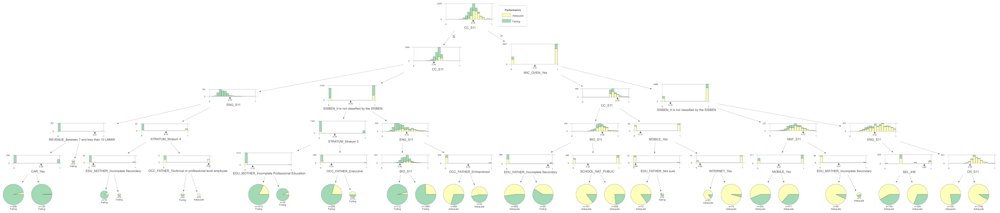

In [128]:
viz = dtreeviz(DT_classifier2_new, 
               X_train_df_SE,
               y_train_final.FAILING,
               target_name='Performance',
               feature_names=X_train_df_SE.columns,
               class_names={1:'Failing',0:'Adequate'},
               show_node_labels = False, scale=0.7)
viz

### Building DecisionTree models with Program/University features

#### Building and evaluating  a simple DecisionTree model

In [129]:
DT_classifier3_new = DecisionTreeClassifier(random_state=123) 
DT_classifier3_new

DecisionTreeClassifier(random_state=123)

In [130]:
DT_classifier3_new.fit(X_train_df_UNVPRG, y_train_final)

DecisionTreeClassifier(random_state=123)

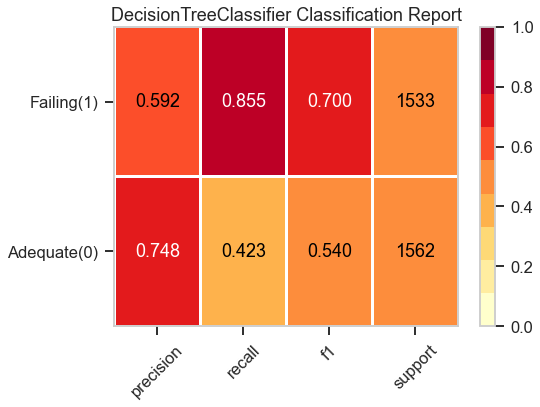

In [131]:
viz = ClassificationReport(DT_classifier3_new,
                           classes=['Adequate(0)', 'Failing(1)'],
                           support=True,
                           fig=plt.figure(figsize=(8,6)))

viz.fit(X_train_df_UNVPRG, y_train_final)

viz.score(X_test_df_UNVPRG, y_test_final)

viz.show();

***************************************
DecisionTreeClassifier(random_state=123)
***************************************

Classification Report for training set
***************************************
              precision    recall  f1-score   support

           0       0.76      0.41      0.53      4745
           1       0.58      0.87      0.70      4539

    accuracy                           0.63      9284
   macro avg       0.67      0.64      0.62      9284
weighted avg       0.68      0.63      0.61      9284


Classification Report for test set
***************************************
              precision    recall  f1-score   support

           0       0.75      0.42      0.54      1562
           1       0.59      0.85      0.70      1533

    accuracy                           0.64      3095
   macro avg       0.67      0.64      0.62      3095
weighted avg       0.67      0.64      0.62      3095


***************************************
Differences in Accuracy scor

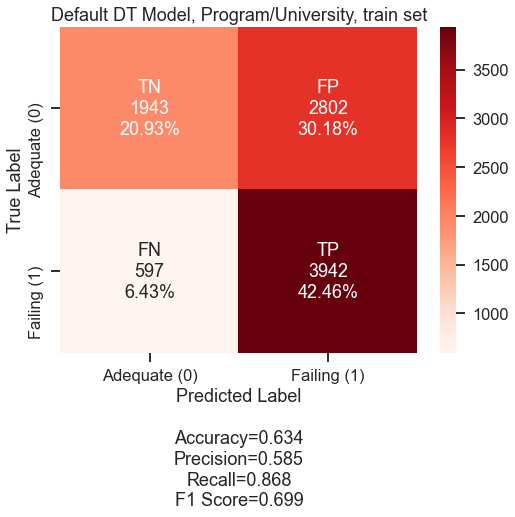

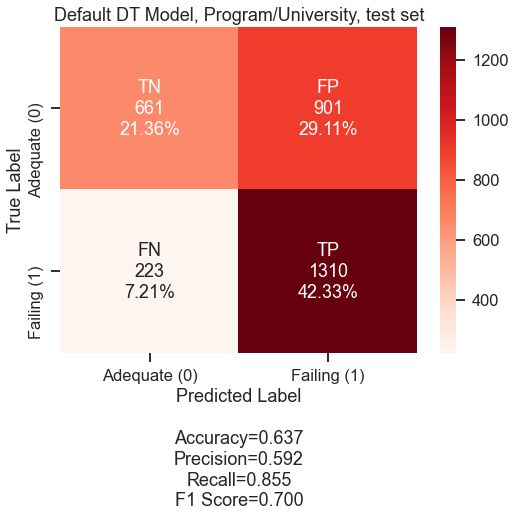

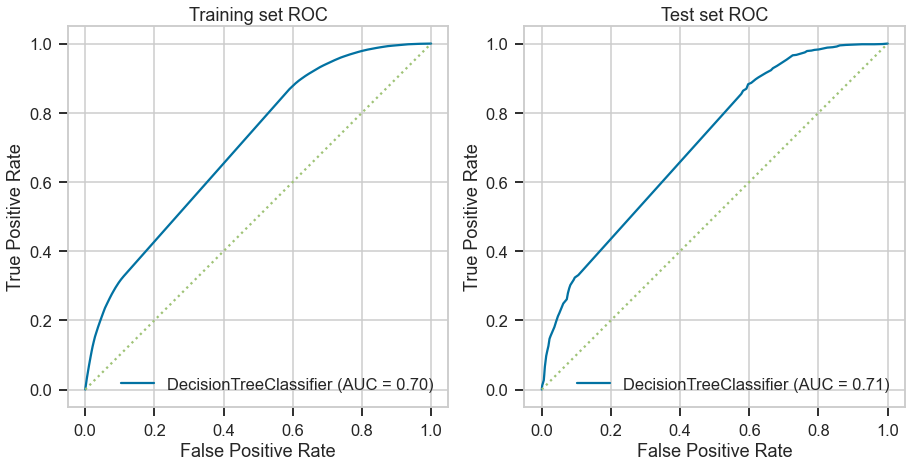

In [132]:
simple_model_validation(DT_classifier3_new, UNVPRG_list,
                        'Default DT Model, Program/University, train set',
                        'Default DT Model, Program/University, test set')

> DecisionTreeClassifier models with University/Program features are still displaying the same metrics. Not sure of the reason.

#### GridSearch  best parameters search for a DecisionTree model

In [133]:
# params = {'criterion':['gini', 'entropy'],
#          'splitter':['best', 'random'],
#          'max_depth': [4, 5, 6, 10],
#          'min_samples_leaf': [2,3,5, 10],
#          'class_weight':[None, 'balanced'],
#          'max_features':['auto',10,30,70, None]}


# ## Instantiate & Fit GridSearchCV
# gridsearch = GridSearchCV(DecisionTreeClassifier(random_state=123),params, cv=5, n_jobs=-1, verbose=2, scoring='f1')
# gridsearch.fit(X_train_df_UNVPRG, y_train_final)

In [134]:
# gridsearch.best_estimator_

In [135]:
# gridsearch.best_score_

In [136]:
# joblib.dump(gridsearch.best_estimator_, 'models/up_progress/DT_best_up_new.joblib')

#### Building and evaluating the best parameters Decision Tree model

In [137]:
DT_classifier4_new = joblib.load('models/up_progress/DT_best_up_new.joblib')

In [138]:
DT_classifier4_new.fit(X_train_df_UNVPRG, y_train_final)

DecisionTreeClassifier(max_depth=10, min_samples_leaf=2, random_state=123)

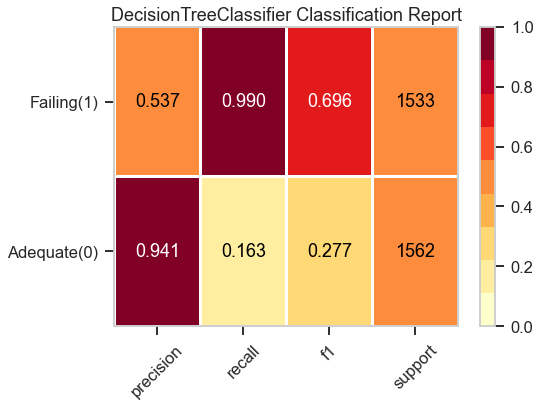

In [139]:
viz = ClassificationReport(DT_classifier4_new,
                           classes=['Adequate(0)', 'Failing(1)'],
                           support=True,
                           fig=plt.figure(figsize=(8,6)))

viz.fit(X_train_df_UNVPRG, y_train_final)

viz.score(X_test_df_UNVPRG, y_test_final)

viz.show();

***************************************
DecisionTreeClassifier(max_depth=10, min_samples_leaf=2, random_state=123)
***************************************

Classification Report for training set
***************************************
              precision    recall  f1-score   support

           0       0.93      0.15      0.26      4745
           1       0.53      0.99      0.69      4539

    accuracy                           0.56      9284
   macro avg       0.73      0.57      0.47      9284
weighted avg       0.73      0.56      0.47      9284


Classification Report for test set
***************************************
              precision    recall  f1-score   support

           0       0.94      0.16      0.28      1562
           1       0.54      0.99      0.70      1533

    accuracy                           0.57      3095
   macro avg       0.74      0.58      0.49      3095
weighted avg       0.74      0.57      0.48      3095


**********************************

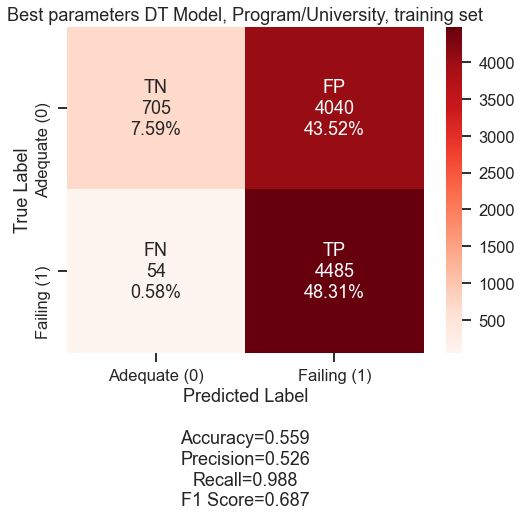

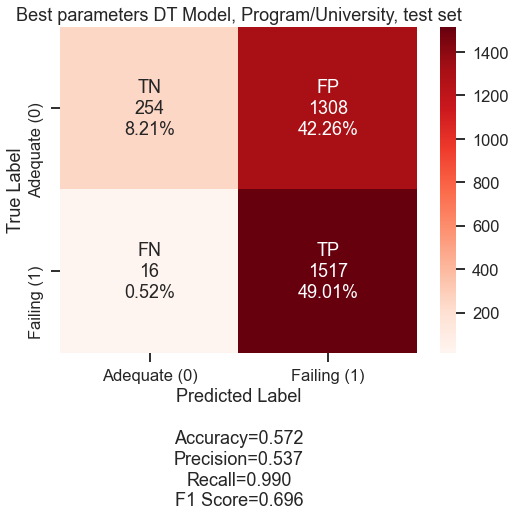

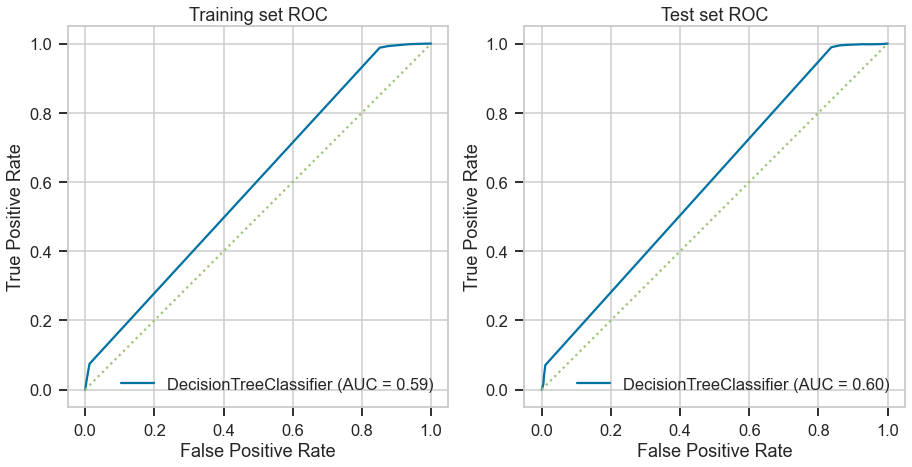

In [140]:
simple_model_validation(DT_classifier4_new, UNVPRG_list,
                        'Best parameters DT Model, Program/University, training set',
                        'Best parameters DT Model, Program/University, test set')

In [141]:
unvprg_models_dict=adding_to_models_dict(models_dict_up,'DecisionTreeClassifier, best params', 'DT_classifier4_new',
                                          UNVPRG_list, DT_classifier4_new, 'models/up_progress/DT_best_up_new.joblib')

> The model shows pretty good recall metrics. However, University/Program models' most important metrics is accuracy or f1, which are not high. 

#### Feature selection via VarianceThreshhold

In [142]:
# Testing if Feature selection might help with either the performance of the model or make the model more interpretable

selector = VarianceThreshold(threshold=0.0)
selector.fit(X_train_df_UNVPRG)

VarianceThreshold()

In [143]:
keep_features = selector.get_support()
print(keep_features.sum())
keep_features.sum()==len(X_train_df_UNVPRG.columns)

52


True

In [144]:
selector = VarianceThreshold(threshold=0.01)
selector.fit(X_train_df_UNVPRG)

VarianceThreshold(threshold=0.01)

In [145]:
keep_features = selector.get_support()
print(keep_features.sum())
keep_features.sum()==len(X_train_df_UNVPRG.columns)

16


False

> The number of the university/program features decreased dramatically

In [146]:
X_train_VT = X_train_df_UNVPRG.loc[:,keep_features]
X_test_VT = X_test_df_UNVPRG.loc[:,keep_features]
X_train_VT

,PROG_UNIV_CHEMICAL ENGINEERING_FUNDACION UNIVERSIDAD DE AMERICA-BOGOTÁ D.C.,"PROG_UNIV_CHEMICAL ENGINEERING_FUNDACION UNIVERSIDAD DE BOGOTA""JORGE TADEO LOZANO""-BOGOTÁ D.C.","PROG_UNIV_CIVIL ENGINEERING_CORPORACION UNIVERSIDAD DE LA COSTA, CUC-BARRANQUILLA","PROG_UNIV_CIVIL ENGINEERING_ESCUELA COLOMBIANA DE INGENIERIA""JULIO GARAVITO""-BOGOTÁ D.C.",PROG_UNIV_CIVIL ENGINEERING_UNIVERSIDAD COOPERATIVA DE COLOMBIA-BOGOTÁ D.C.,PROG_UNIV_CIVIL ENGINEERING_UNIVERSIDAD DE LOS ANDES-BOGOTÁ D.C.,PROG_UNIV_CIVIL ENGINEERING_UNIVERSIDAD FRANCISCO DE PAULA SANTANDER-CUCUTA,"PROG_UNIV_CIVIL ENGINEERING_UNIVERSIDAD MILITAR""NUEVA GRANADA""-BOGOTÁ D.C.",PROG_UNIV_CIVIL ENGINEERING_UNIVERSIDAD PONTIFICIA BOLIVARIANA-BUCARAMANGA,PROG_UNIV_CIVIL ENGINEERING_UNIVERSIDAD SANTO TOMAS-BOGOTÁ D.C.,PROG_UNIV_INDUSTRIAL ENGINEERING_FUNDACION UNIVERSITARIA TECNOLOGICO COMFENALCO - CARTAGENA -CARTAGENA,PROG_UNIV_INDUSTRIAL ENGINEERING_PONTIFICIA UNIVERSIDAD JAVERIANA-BOGOTÁ D.C.,PROG_UNIV_INDUSTRIAL ENGINEERING_UNIVERSIDAD DE LOS ANDES-BOGOTÁ D.C.,PROG_UNIV_INDUSTRIAL ENGINEERING_UNIVERSIDAD DE PAMPLONA-PAMPLONA,PROG_UNIV_INDUSTRIAL ENGINEERING_UNIVERSIDAD DEL NORTE-BARRANQUILLA,PROG_UNIV_Other
796,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8185,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
6228,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1116,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
7653,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5218,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
12252,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1346,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
11646,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


***************************************
DecisionTreeClassifier(max_depth=10, min_samples_leaf=2, random_state=123)
***************************************

Classification Report for training set
***************************************
              precision    recall  f1-score   support

           0       0.53      0.98      0.69      4745
           1       0.81      0.11      0.19      4539

    accuracy                           0.55      9284
   macro avg       0.67      0.54      0.44      9284
weighted avg       0.67      0.55      0.44      9284


Classification Report for test set
***************************************
              precision    recall  f1-score   support

           0       0.53      0.98      0.68      1562
           1       0.83      0.10      0.18      1533

    accuracy                           0.54      3095
   macro avg       0.68      0.54      0.43      3095
weighted avg       0.68      0.54      0.44      3095


**********************************

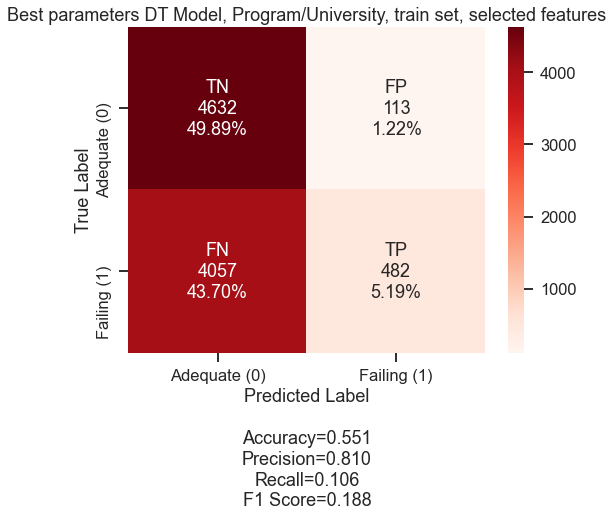

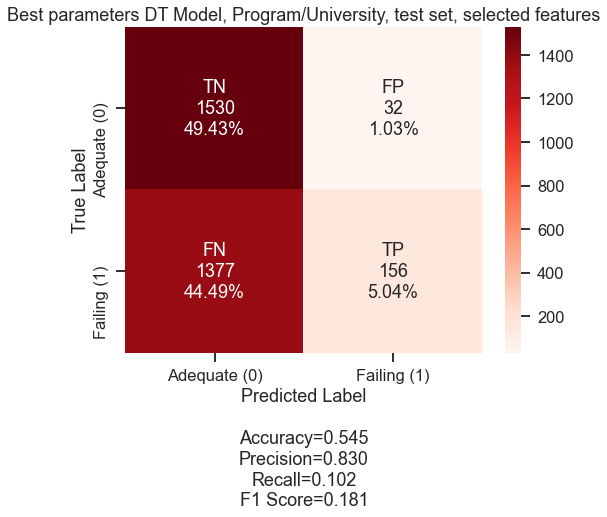

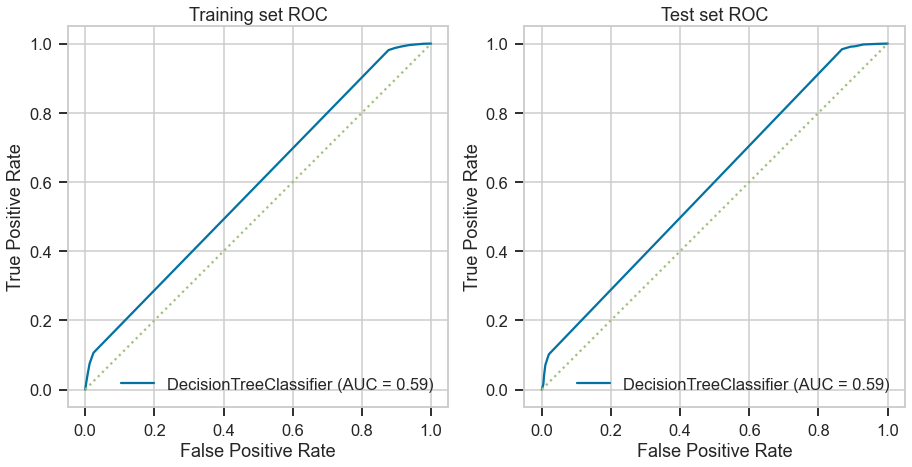

In [147]:
DT_classifier5_new = joblib.load('models/up_progress/DT_best_up_new.joblib')
DT_classifier5_new.fit(X_train_VT, y_train_final)

UNVPRG_VT_list=[X_train_VT,  X_test_VT, y_train_final, y_test_final]
simple_model_validation(DT_classifier5_new, UNVPRG_VT_list,
                        'Best parameters DT Model, Program/University, train set, selected features',
                        'Best parameters DT Model, Program/University, test set, selected features')

PROG_UNIV_CHEMICAL ENGINEERING_FUNDACION UNIVERSIDAD DE AMERICA-BOGOTÁ D.C.                                    0.000000
PROG_UNIV_CHEMICAL ENGINEERING_FUNDACION UNIVERSIDAD DE BOGOTA"JORGE TADEO LOZANO"-BOGOTÁ D.C.                 0.000000
PROG_UNIV_CIVIL ENGINEERING_CORPORACION UNIVERSIDAD DE LA COSTA, CUC-BARRANQUILLA                              0.035514
PROG_UNIV_CIVIL ENGINEERING_ESCUELA COLOMBIANA DE INGENIERIA"JULIO GARAVITO"-BOGOTÁ D.C.                       0.047016
PROG_UNIV_CIVIL ENGINEERING_UNIVERSIDAD COOPERATIVA DE COLOMBIA-BOGOTÁ D.C.                                    0.115337
PROG_UNIV_CIVIL ENGINEERING_UNIVERSIDAD DE LOS ANDES-BOGOTÁ D.C.                                               0.151516
PROG_UNIV_CIVIL ENGINEERING_UNIVERSIDAD FRANCISCO DE PAULA SANTANDER-CUCUTA                                    0.032894
PROG_UNIV_CIVIL ENGINEERING_UNIVERSIDAD MILITAR"NUEVA GRANADA"-BOGOTÁ D.C.                                     0.000000
PROG_UNIV_CIVIL ENGINEERING_UNIVERSIDAD 

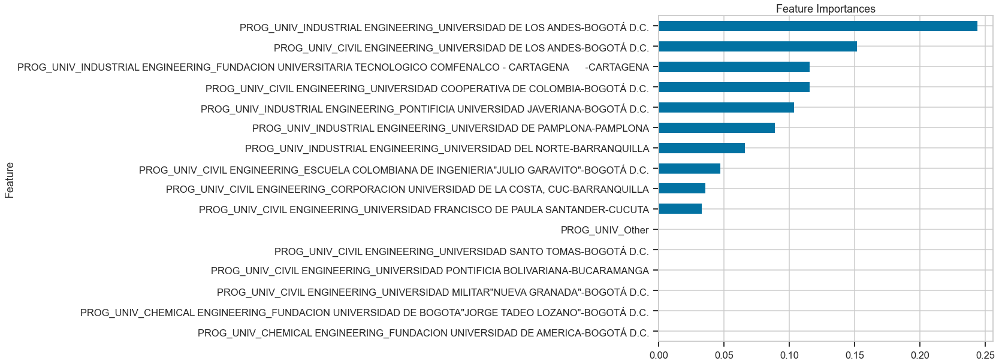

In [148]:
get_importance_tree(DT_classifier5_new, X_train_VT)

In [149]:
unvprg_models_dict=adding_to_models_dict(models_dict_up,'DecisionTreeClassifier, best params, select features',
                                         'DT_classifier5_new', UNVPRG_VT_list, DT_classifier5_new, 'not saved')

In [150]:
UNVPRG_df_models=pd.DataFrame(unvprg_models_dict)
UNVPRG_df_models

,Classifier Name,Description,Training or Test,Accuracy,Recall,FN,Total number of records,Saved model
0,logreg_model3_new,"LogisticRegressionClassifier, default params",training,0.634,0.868,597,9284,not saved
1,logreg_model3_new,"LogisticRegressionClassifier, default params",test,0.637,0.855,223,3095,not saved
2,log_reg_model4_new,"LogisticRegressionClassifier, best params",training,0.634,0.868,597,9284,models/up_progress/LR_best_up_new.joblib
3,log_reg_model4_new,"LogisticRegressionClassifier, best params",test,0.637,0.855,223,3095,models/up_progress/LR_best_up_new.joblib
4,DT_classifier4_new,"DecisionTreeClassifier, best params",training,0.559,0.988,54,9284,models/up_progress/DT_best_up_new.joblib
5,DT_classifier4_new,"DecisionTreeClassifier, best params",test,0.572,0.990,16,3095,models/up_progress/DT_best_up_new.joblib
6,DT_classifier5_new,"DecisionTreeClassifier, best params, select fe...",training,0.551,0.106,4057,9284,not saved
7,DT_classifier5_new,"DecisionTreeClassifier, best params, select fe...",test,0.545,0.102,1377,3095,not saved


> Feature selection did not improve the accuracy of the previous models. The performance of the model is the worst among all the previous ones.

## Building and Evaluating  Ensemble Models

### RandomForestClassifier with SocioEconomic/HS scores Features

#### Building and evaluating  a RandonForestClassifier model with default parameters

In [151]:
rfc1_new = RandomForestClassifier(random_state=123)

***************************************
RandomForestClassifier(random_state=123)
***************************************

Classification Report for training set
***************************************
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      4745
           1       1.00      1.00      1.00      4539

    accuracy                           1.00      9284
   macro avg       1.00      1.00      1.00      9284
weighted avg       1.00      1.00      1.00      9284


Classification Report for test set
***************************************
              precision    recall  f1-score   support

           0       0.79      0.82      0.80      1562
           1       0.81      0.78      0.79      1533

    accuracy                           0.80      3095
   macro avg       0.80      0.80      0.80      3095
weighted avg       0.80      0.80      0.80      3095


***************************************
Differences in Accuracy scor

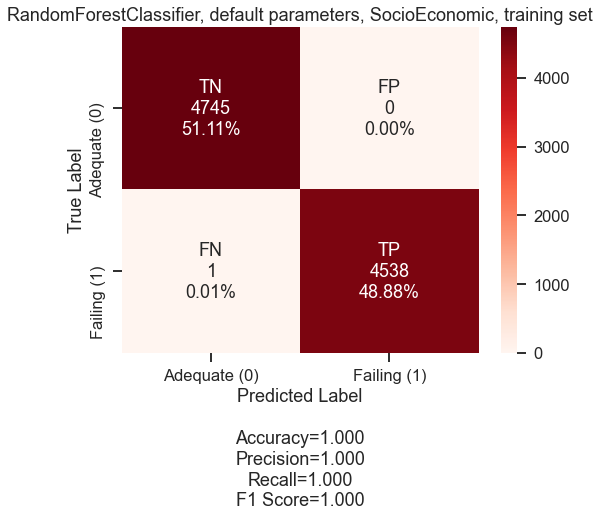

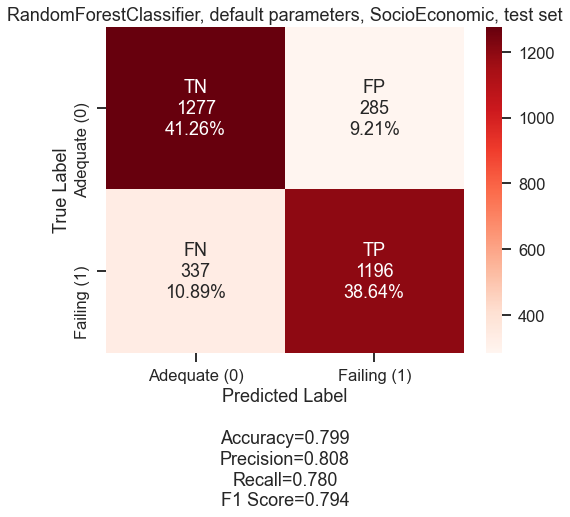

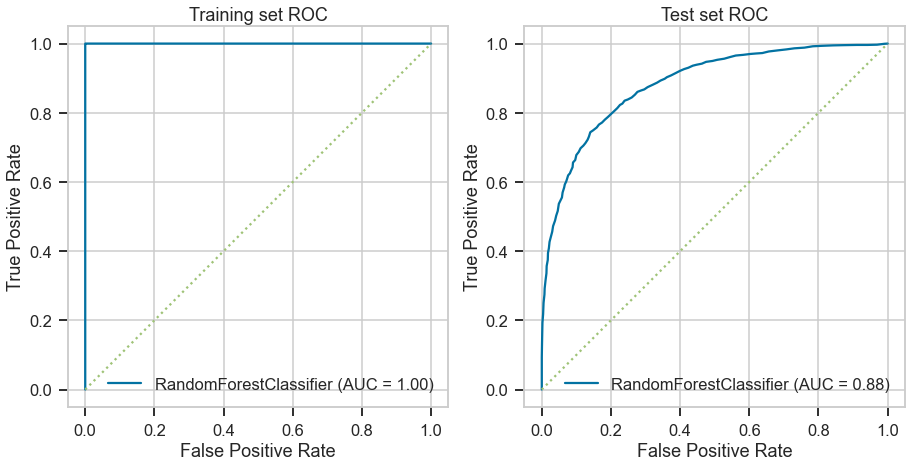

In [152]:
rfc1_new.fit(X_train_df_SE, y_train_final)
simple_model_validation(rfc1_new, SE_list,
                        'RandomForestClassifier, default parameters, SocioEconomic, training set',
                        'RandomForestClassifier, default parameters, SocioEconomic, test set')

In [153]:
se_models_dict=adding_to_models_dict(models_dict_se,'RFClassifier, default parameters','rfc1_new', 
                                     SE_list, rfc1_new, 'not saved')

> RandomForestClassifier with default parameters model is overfitted.

#### GridSearch  best parameters search for a RandomForestClassifier model

In [154]:
RandomForestClassifier().get_params().keys()

dict_keys(['bootstrap', 'ccp_alpha', 'class_weight', 'criterion', 'max_depth', 'max_features', 'max_leaf_nodes', 'max_samples', 'min_impurity_decrease', 'min_impurity_split', 'min_samples_leaf', 'min_samples_split', 'min_weight_fraction_leaf', 'n_estimators', 'n_jobs', 'oob_score', 'random_state', 'verbose', 'warm_start'])

In [155]:
# params= {'criterion':['gini', 'entropy'],
#           'n_estimators': [50, 100, 150, 250],
#           'max_depth': [3, 5, 8, 10],
#           'min_samples_leaf': [2, 5, 10],
#           'class_weight':['balanced_subsample', 'balanced'],
#           'max_features':['auto','sqrt','log2', 25, 50]}

# gridsearch = GridSearchCV(RandomForestClassifier(random_state=123), params, n_jobs=-1,
#                           cv=5, verbose=2, scoring = 'recall')
# gridsearch.fit(X_train_df_SE, y_train_final)

In [156]:
# gridsearch.best_score_

In [157]:
# gridsearch.best_estimator_

In [158]:
# joblib.dump(gridsearch.best_estimator_, 'models/se_progress/rfc_best_se_new.joblib')

#### Building and evaluating the best parameters RandomForestClassifier model

In [159]:
rfc2_new = joblib.load('models/se_progress/rfc_best_se_new.joblib')

In [160]:
rfc2_new.fit(X_train_df_SE, y_train_final)

RandomForestClassifier(class_weight='balanced_subsample', max_depth=5,
                       max_features=50, min_samples_leaf=2, n_estimators=50,
                       random_state=123)

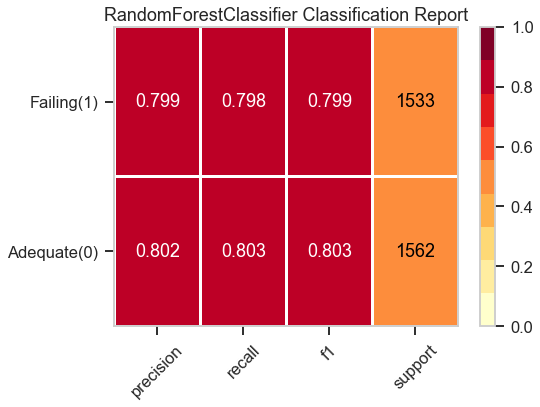

In [161]:
viz = ClassificationReport(rfc2_new,
                           classes=['Adequate(0)', 'Failing(1)'],
                           support=True,
                           fig=plt.figure(figsize=(8,6)))

viz.fit(X_train_df_SE, y_train_final)

viz.score(X_test_df_SE, y_test_final)

viz.show();

***************************************
RandomForestClassifier(class_weight='balanced_subsample', max_depth=5,
                       max_features=50, min_samples_leaf=2, n_estimators=50,
                       random_state=123)
***************************************

Classification Report for training set
***************************************
              precision    recall  f1-score   support

           0       0.82      0.82      0.82      4745
           1       0.81      0.82      0.82      4539

    accuracy                           0.82      9284
   macro avg       0.82      0.82      0.82      9284
weighted avg       0.82      0.82      0.82      9284


Classification Report for test set
***************************************
              precision    recall  f1-score   support

           0       0.80      0.80      0.80      1562
           1       0.80      0.80      0.80      1533

    accuracy                           0.80      3095
   macro avg       0.80      0

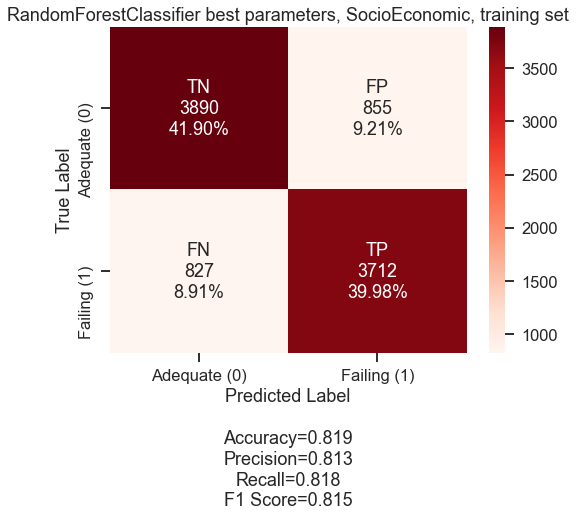

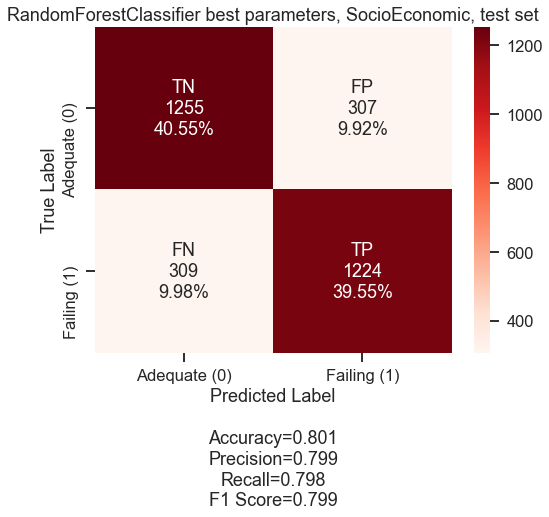

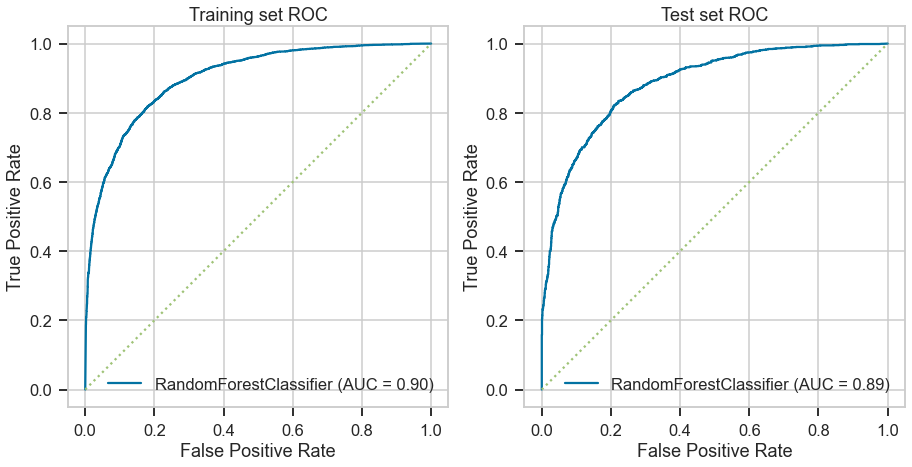

In [162]:
simple_model_validation(rfc2_new, SE_list,
                        'RandomForestClassifier best parameters, SocioEconomic, training set',
                        'RandomForestClassifier best parameters, SocioEconomic, test set')

In [163]:
se_models_dict=adding_to_models_dict(models_dict_se,'RFClassifier, best parameters','rfc2_new', 
                                     SE_list, rfc2_new, 'models/se_progress/rfc_best_se_new.joblib')

> While the RandomForestClassifier best parameters model performance is good, it is not superior to LogisticRegressionClassifierCV best parameters model.

### XGBoostClassifier with SocioEconomic/HS scores features

#### Building and evaluating a XGBoostClassifier model with default parameters

In [164]:
xgb1_new = XGBClassifier(random_state=123)

In [165]:
xgb1_new.fit(X_train_df_SE, y_train_final)

[23:16:30] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=16, num_parallel_tree=1,
              random_state=123, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
              subsample=1, tree_method='exact', validate_parameters=1,
              verbosity=None)

***************************************
XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=16, num_parallel_tree=1,
              random_state=123, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
              subsample=1, tree_method='exact', validate_parameters=1,
              verbosity=None)
***************************************

Classification Report for training set
***************************************
              precision    recall  f1-score   support

           0       0.95      0.96      0.96      4745
           1       0.96      0.95      0.95      4539

    accuracy                           0.95      9284
   macro avg       0.95

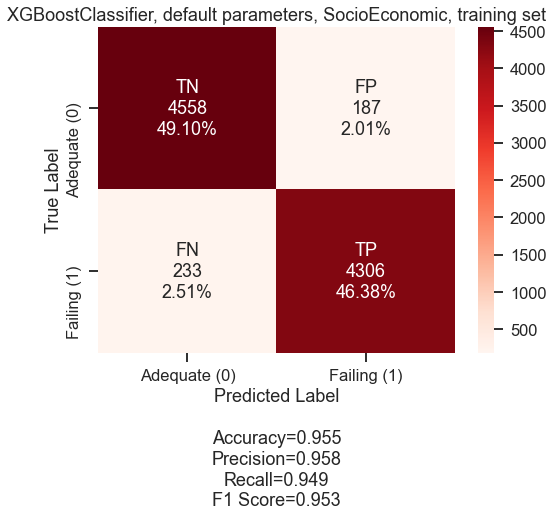

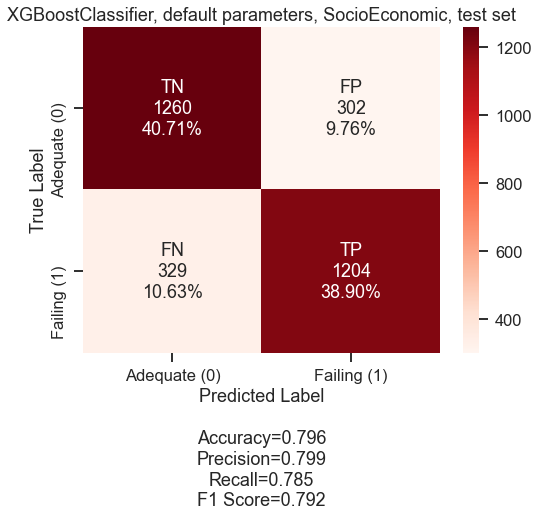

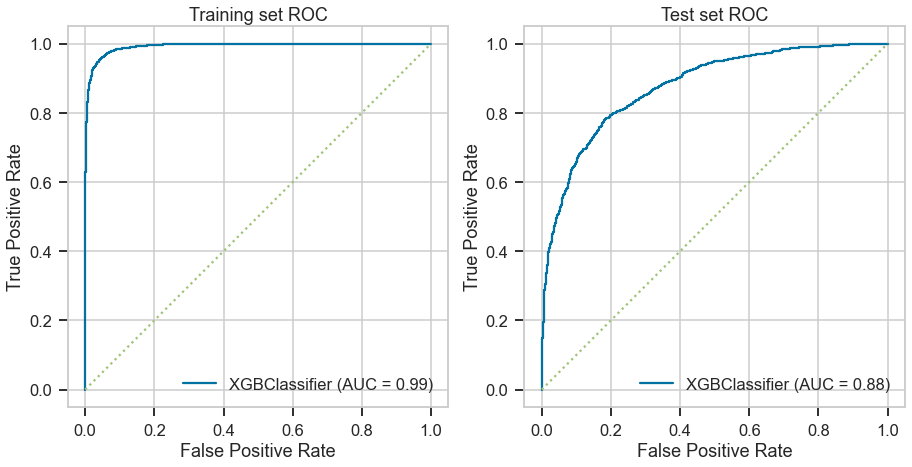

In [166]:
simple_model_validation(xgb1_new, SE_list,
                        'XGBoostClassifier, default parameters, SocioEconomic, training set',
                        'XGBoostClassifier, default parameters, SocioEconomic, test set')

In [167]:
se_models_dict=adding_to_models_dict(models_dict_se,'XGBClassifier, default parameters','xgb1_new', 
                                     SE_list, xgb1_new, 'not saved')

> The XGBClassifier model with default parameters is overfitted. We will continue with GridSearch.

#### GridSearch  best parameters search for XGBClassifier model

In [168]:
XGBClassifier().get_params().keys()

dict_keys(['objective', 'use_label_encoder', 'base_score', 'booster', 'colsample_bylevel', 'colsample_bynode', 'colsample_bytree', 'gamma', 'gpu_id', 'importance_type', 'interaction_constraints', 'learning_rate', 'max_delta_step', 'max_depth', 'min_child_weight', 'missing', 'monotone_constraints', 'n_estimators', 'n_jobs', 'num_parallel_tree', 'random_state', 'reg_alpha', 'reg_lambda', 'scale_pos_weight', 'subsample', 'tree_method', 'validate_parameters', 'verbosity'])

In [169]:
# params = {'n_estimators': [50, 100, 150],
#           'max_depth': [3, 5, 8],
#           'learning_rate': [0.05, 0.1, 0.5],
#           'booster':['dart','gblinear'],
#           'tree_method':['auto', 'approx', 'hist', 'gpu_hist'],
#           'gamma':[0,5,10]}


# gridsearch = GridSearchCV(XGBClassifier(random_state=123), params, n_jobs=-1,
#                           cv=5, verbose=2, scoring = 'recall')
# gridsearch.fit(X_train_df_SE, y_train_final)

In [170]:
# gridsearch.best_score_

In [171]:
# gridsearch.best_estimator_

In [172]:
# joblib.dump(gridsearch.best_estimator_, 'models/se_progress/xgb_best_se_new.joblib')

#### Building and evaluating the best parameters XGBClassifier model

In [173]:
xgb2_new= joblib.load('models/se_progress/xgb_best_se_new.joblib')

In [174]:
xgb2_new.fit(X_train_df_SE, y_train_final)

[23:16:31] WARNING: ..\src\learner.cc:573: 
Parameters: { "gamma", "max_depth", "tree_method" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[23:16:31] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gblinear', colsample_bylevel=None,
              colsample_bynode=None, colsample_bytree=None, gamma=10, gpu_id=-1,
              importance_type='gain', interaction_constraints=None,
              learning_rate=0.5, max_delta_step=None, max_depth=3,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=16, num_parallel_tree=None,
              random_state=123, reg_alpha=0, reg_lambda=0, scale_pos_weight=1,
              subsample=None, tree_method='hist', validate_parameters=1,
              verbosity=None)

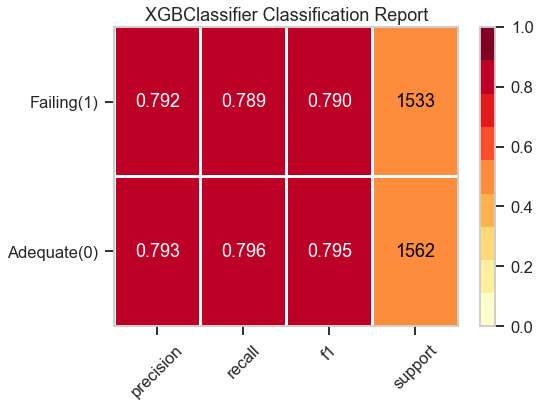

In [175]:
viz = ClassificationReport(xgb2_new,
                           classes=['Adequate(0)', 'Failing(1)'],
                           support=True,
                           fig=plt.figure(figsize=(8,6)))

viz.fit(X_train_df_SE, y_train_final)

viz.score(X_test_df_SE, y_test_final)

viz.show();

***************************************
XGBClassifier(base_score=0.5, booster='gblinear', colsample_bylevel=None,
              colsample_bynode=None, colsample_bytree=None, gamma=10, gpu_id=-1,
              importance_type='gain', interaction_constraints=None,
              learning_rate=0.5, max_delta_step=None, max_depth=3,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=16, num_parallel_tree=None,
              random_state=123, reg_alpha=0, reg_lambda=0, scale_pos_weight=1,
              subsample=None, tree_method='hist', validate_parameters=1,
              verbosity=None)
***************************************

Classification Report for training set
***************************************
              precision    recall  f1-score   support

           0       0.81      0.81      0.81      4745
           1       0.80      0.80      0.80      4539

    accuracy                           0.80      9284
   mac

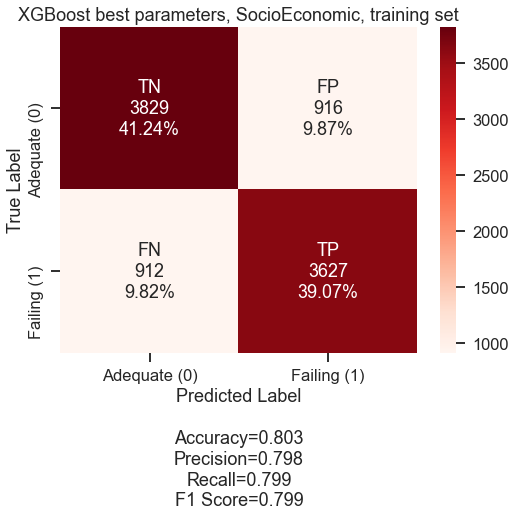

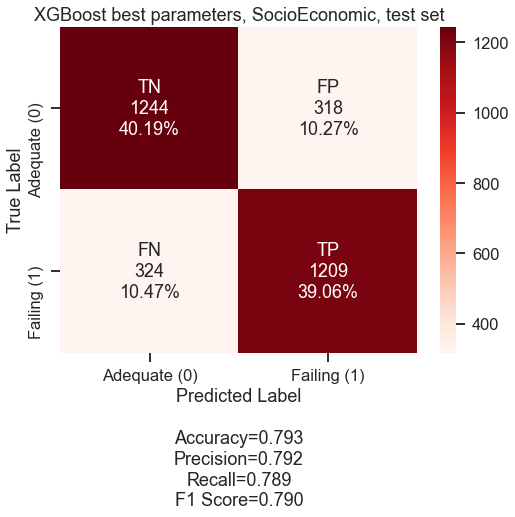

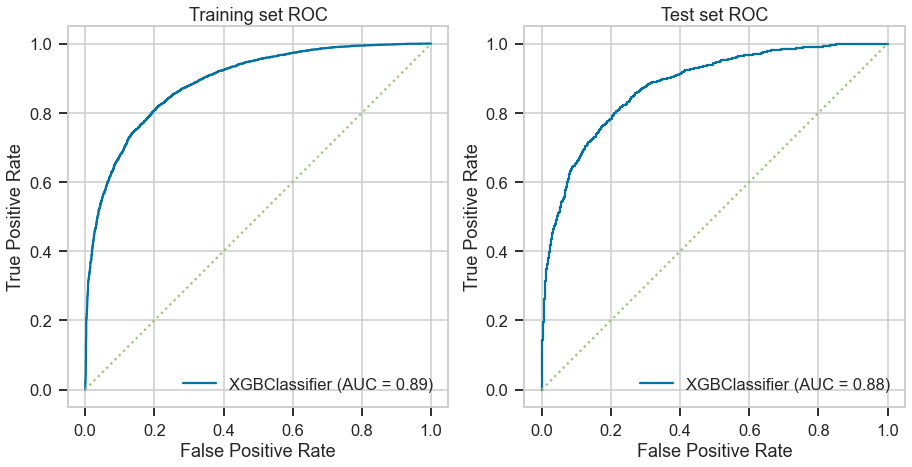

In [176]:
simple_model_validation(xgb2_new, SE_list,
                        'XGBoost best parameters, SocioEconomic, training set',
                        'XGBoost best parameters, SocioEconomic, test set')

In [177]:
se_models_dict=adding_to_models_dict(models_dict_se,'XGBClassifier, best params', 'xgb2_new', 
                                     SE_list, xgb2_new, 'models/se_progress/xgb_best_se_new.joblib')

### XGBoostClassifier with Program/University features

#### Building and evaluating  a XGBoostClassifier model with default parameters

In [178]:
xgb3_new = XGBClassifier(random_state=123)

In [179]:
xgb3_new.fit(X_train_df_UNVPRG, y_train_final)

[23:16:32] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=16, num_parallel_tree=1,
              random_state=123, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
              subsample=1, tree_method='exact', validate_parameters=1,
              verbosity=None)

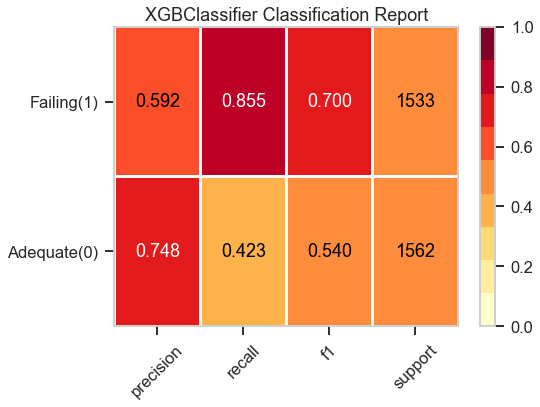

In [180]:
viz = ClassificationReport(xgb3_new,
                           classes=['Adequate(0)', 'Failing(1)'],
                           support=True,
                           fig=plt.figure(figsize=(8,6)))

viz.fit(X_train_df_UNVPRG, y_train_final)

viz.score(X_test_df_UNVPRG, y_test_final)

viz.show();

***************************************
XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=16, num_parallel_tree=1,
              random_state=123, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
              subsample=1, tree_method='exact', validate_parameters=1,
              verbosity=None)
***************************************

Classification Report for training set
***************************************
              precision    recall  f1-score   support

           0       0.76      0.41      0.53      4745
           1       0.58      0.87      0.70      4539

    accuracy                           0.63      9284
   macro avg       0.67

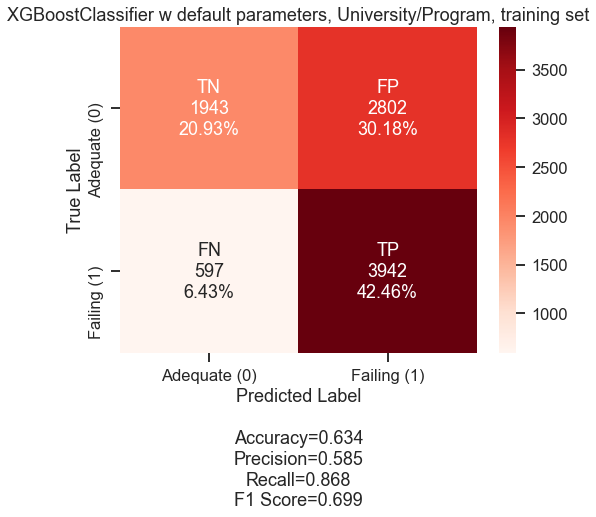

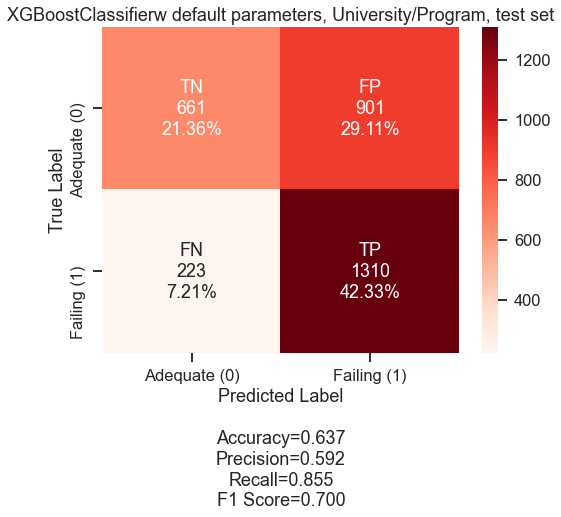

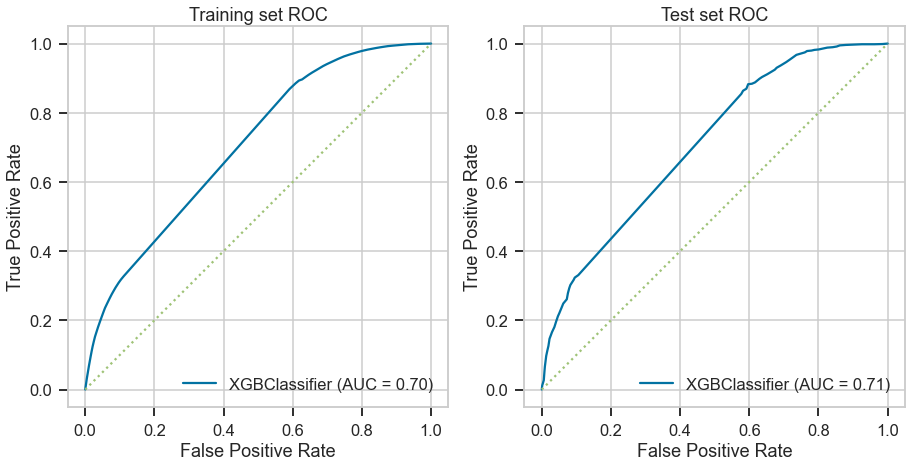

In [181]:
simple_model_validation(xgb3_new, UNVPRG_list,
                        'XGBoostClassifier w default parameters, University/Program, training set',
                        'XGBoostClassifierw default parameters, University/Program, test set')

> The model displays the same strange behavior as the previous models with University/Program features.

#### GridSearch  best parameters search for XGBClassifier model

In [182]:
# params = {'n_estimators': [50, 100, 150],
#           'max_depth': [3, 5, 8],
#           'learning_rate': [0.1, 0.3],
#           'booster':['gblinear','dart'],
#           'tree_method':['auto', 'approx', 'hist', 'gpu_hist']}

# gridsearch = GridSearchCV(XGBClassifier(random_state=123), params, n_jobs=-1,
#                           cv=5, verbose=2, scoring = 'accuracy')

# gridsearch.fit(X_train_df_UNVPRG, y_train_final)

In [183]:
# gridsearch.best_score_

In [184]:
# gridsearch.best_estimator_

In [185]:
# joblib.dump(gridsearch.best_estimator_, 'models/up_progress/xgb_best_up_new.joblib')

#### Building and evaluating the best parameters XGBClassifier model

In [186]:
xgb3_new=joblib.load('models/up_progress/xgb_best_up_new.joblib')

In [187]:
xgb3_new.fit(X_train_df_UNVPRG, y_train_final)

[23:16:33] WARNING: ..\src\learner.cc:573: 
Parameters: { "max_depth", "tree_method" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[23:16:33] WARNING: ..\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gblinear', colsample_bylevel=None,
              colsample_bynode=None, colsample_bytree=None, gamma=None,
              gpu_id=-1, importance_type='gain', interaction_constraints=None,
              learning_rate=0.1, max_delta_step=None, max_depth=3,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=50, n_jobs=16, num_parallel_tree=None,
              random_state=123, reg_alpha=0, reg_lambda=0, scale_pos_weight=1,
              subsample=None, tree_method='auto', validate_parameters=1,
              verbosity=None)

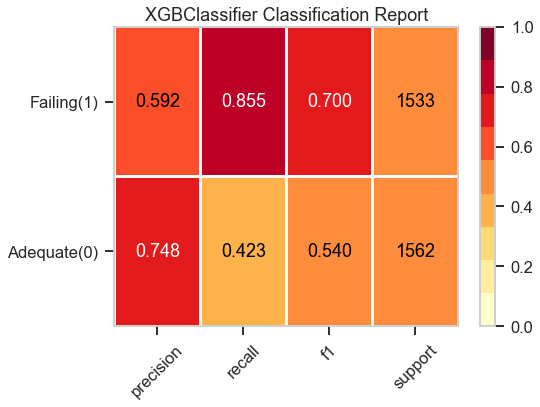

In [188]:
viz = ClassificationReport(xgb3_new,
                           classes=['Adequate(0)', 'Failing(1)'],
                           support=True,
                           fig=plt.figure(figsize=(8,6)))

viz.fit(X_train_df_UNVPRG, y_train_final)

viz.score(X_test_df_UNVPRG, y_test_final)

viz.show();

***************************************
XGBClassifier(base_score=0.5, booster='gblinear', colsample_bylevel=None,
              colsample_bynode=None, colsample_bytree=None, gamma=None,
              gpu_id=-1, importance_type='gain', interaction_constraints=None,
              learning_rate=0.1, max_delta_step=None, max_depth=3,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=50, n_jobs=16, num_parallel_tree=None,
              random_state=123, reg_alpha=0, reg_lambda=0, scale_pos_weight=1,
              subsample=None, tree_method='auto', validate_parameters=1,
              verbosity=None)
***************************************

Classification Report for training set
***************************************
              precision    recall  f1-score   support

           0       0.76      0.41      0.53      4745
           1       0.58      0.87      0.70      4539

    accuracy                           0.63      9284
   ma

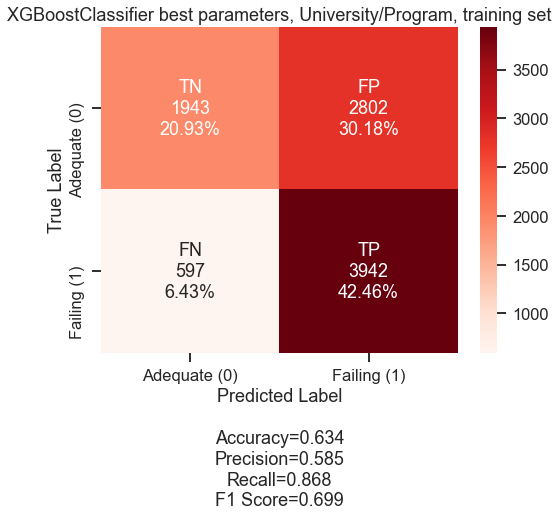

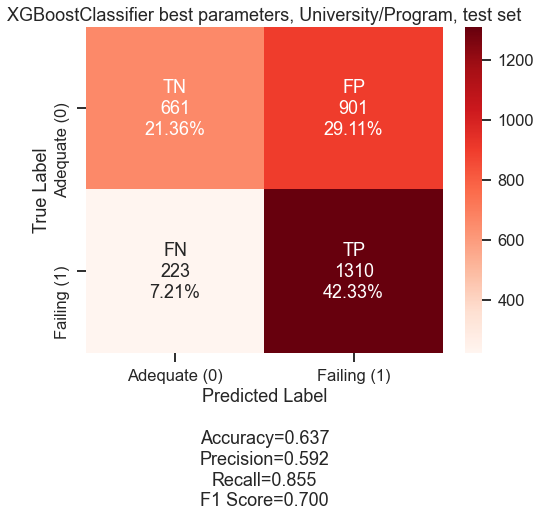

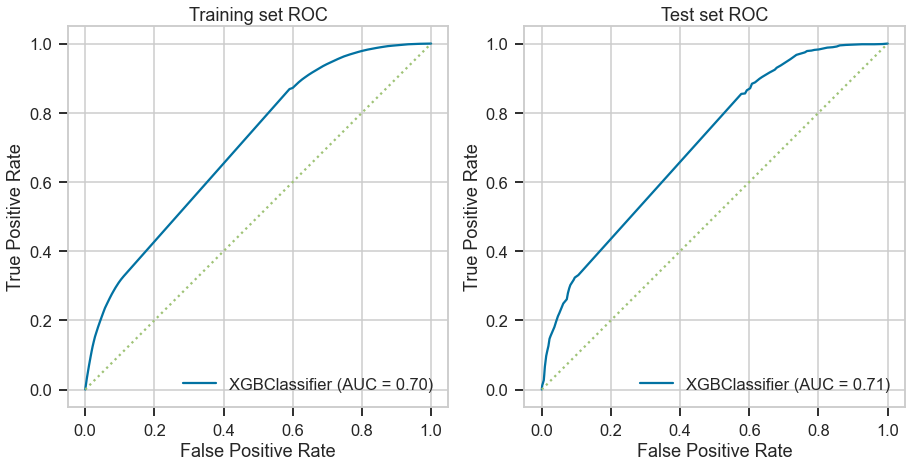

In [189]:
simple_model_validation(xgb3_new, UNVPRG_list,
                        'XGBoostClassifier best parameters, University/Program, training set',
                        'XGBoostClassifier best parameters, University/Program, test set')

In [190]:
unvprg_models_dict=adding_to_models_dict(models_dict_up,'XGBoostClassifier, best params', 'xgb3_new',
                                          UNVPRG_list, xgb3_new, 'models/up_progress/xgb_best_up_new.joblib')

## Comparing models

### Comparing models with SocioEconomic Features

In [191]:
SE_df_models=pd.DataFrame(se_models_dict)
SE_df_models

,Classifier Name,Description,Training or Test,Accuracy,Recall,FN,Total number of records,Saved model
0,logreg_model1_new,"LogisticRegressionClassifier, default params",training,0.815,0.819,823,9284,not saved
1,logreg_model1_new,"LogisticRegressionClassifier, default params",test,0.805,0.803,302,3095,not saved
2,log_reg_model2_new,"LogisticRegressionClassifier, best params",training,0.813,0.825,793,9284,models/se_progress/LR_best_se_new.joblib
3,log_reg_model2_new,"LogisticRegressionClassifier, best params",test,0.803,0.806,297,3095,models/se_progress/LR_best_se_new.joblib
4,log_reg_model2_CV_new,"LogisticRegressionClassifierCV, best params",training,0.786,0.834,754,9284,models/se_progress/LR_best_se_CV_new.joblib
5,log_reg_model2_CV_new,"LogisticRegressionClassifierCV, best params",test,0.784,0.826,266,3095,models/se_progress/LR_best_se_CV_new.joblib
6,DT_classifier1_new,"DecisionTreeClassifier, default params",training,1.000,1.000,0,9284,not saved
7,DT_classifier1_new,"DecisionTreeClassifier, default params",test,0.716,0.714,438,3095,not saved
8,DT_classifier2_new,"DecisionTreeClassifier, best params",training,0.765,0.684,1435,9284,models/se_progress/DT_best_se_new.joblib
9,DT_classifier2_new,"DecisionTreeClassifier, best params",test,0.760,0.686,481,3095,models/se_progress/DT_best_se_new.joblib


### Comparing models with Program/University Features

In [192]:
UNVPRG_df_models=pd.DataFrame(unvprg_models_dict)
UNVPRG_df_models

,Classifier Name,Description,Training or Test,Accuracy,Recall,FN,Total number of records,Saved model
0,logreg_model3_new,"LogisticRegressionClassifier, default params",training,0.634,0.868,597,9284,not saved
1,logreg_model3_new,"LogisticRegressionClassifier, default params",test,0.637,0.855,223,3095,not saved
2,log_reg_model4_new,"LogisticRegressionClassifier, best params",training,0.634,0.868,597,9284,models/up_progress/LR_best_up_new.joblib
3,log_reg_model4_new,"LogisticRegressionClassifier, best params",test,0.637,0.855,223,3095,models/up_progress/LR_best_up_new.joblib
4,DT_classifier4_new,"DecisionTreeClassifier, best params",training,0.559,0.988,54,9284,models/up_progress/DT_best_up_new.joblib
5,DT_classifier4_new,"DecisionTreeClassifier, best params",test,0.572,0.990,16,3095,models/up_progress/DT_best_up_new.joblib
6,DT_classifier5_new,"DecisionTreeClassifier, best params, select fe...",training,0.551,0.106,4057,9284,not saved
7,DT_classifier5_new,"DecisionTreeClassifier, best params, select fe...",test,0.545,0.102,1377,3095,not saved
8,xgb3_new,"XGBoostClassifier, best params",training,0.634,0.868,597,9284,models/up_progress/xgb_best_up_new.joblib
9,xgb3_new,"XGBoostClassifier, best params",test,0.637,0.855,223,3095,models/up_progress/xgb_best_up_new.joblib


## The Best Models

### SocioEconomic/HS scores models

In [193]:
best_df_se=SE_df_models[(SE_df_models['FN'] < 325) & (SE_df_models['Training or Test'] != 'training')]
best_df_se

,Classifier Name,Description,Training or Test,Accuracy,Recall,FN,Total number of records,Saved model
1,logreg_model1_new,"LogisticRegressionClassifier, default params",test,0.805,0.803,302,3095,not saved
3,log_reg_model2_new,"LogisticRegressionClassifier, best params",test,0.803,0.806,297,3095,models/se_progress/LR_best_se_new.joblib
5,log_reg_model2_CV_new,"LogisticRegressionClassifierCV, best params",test,0.784,0.826,266,3095,models/se_progress/LR_best_se_CV_new.joblib
13,rfc2_new,"RFClassifier, best parameters",test,0.801,0.798,309,3095,models/se_progress/rfc_best_se_new.joblib
17,xgb2_new,"XGBClassifier, best params",test,0.793,0.789,324,3095,models/se_progress/xgb_best_se_new.joblib


In [194]:
best_df_se_final=SE_df_models[SE_df_models['Classifier Name'].isin(['log_reg_model2_CV_new','rfc2_new'])]
best_df_se_final                         

,Classifier Name,Description,Training or Test,Accuracy,Recall,FN,Total number of records,Saved model
4,log_reg_model2_CV_new,"LogisticRegressionClassifierCV, best params",training,0.786,0.834,754,9284,models/se_progress/LR_best_se_CV_new.joblib
5,log_reg_model2_CV_new,"LogisticRegressionClassifierCV, best params",test,0.784,0.826,266,3095,models/se_progress/LR_best_se_CV_new.joblib
12,rfc2_new,"RFClassifier, best parameters",training,0.819,0.818,827,9284,models/se_progress/rfc_best_se_new.joblib
13,rfc2_new,"RFClassifier, best parameters",test,0.801,0.798,309,3095,models/se_progress/rfc_best_se_new.joblib


In [195]:
log_reg_model2_CV_new

LogisticRegressionCV(class_weight='balanced', max_iter=25, penalty='l1',
                     random_state=123, scoring='recall', solver='saga')

In [196]:
rfc2_new

RandomForestClassifier(class_weight='balanced_subsample', max_depth=5,
                       max_features=50, min_samples_leaf=2, n_estimators=50,
                       random_state=123)

> **Based on the evaluation of the model metrics, the two best models are progressing to the interpretation stage**
* LogisticRegressionCV Classifier with Lasso regularization and 'saga' solver
* RandomForestClassifier with maximum depth=5 and balanced subsample

> The reasoning behind the choice is that while the LogisticRegressionCV model has the best Recall metrics, the RandomForestClassifier has a better balance between the accuracy and the Recall scores. Another reason is that they might provide complementary insight into the solution because of the different nature of these models.

### University/Program ranking models

> **4 out of 6 best models with University/Program features have the same model metrics:**
* LogisticRegressionClassifier with default parameters
* LogisticRegressionClassifier with best parameters
* XGBoostClassifier, gbtree booster with best parameters
* XGBoostClassifier, gblinea booster with best parameters
 
> **The remaining 2 models, both DecisionTree Classifiers have poor accuracy scores. For the goal of correctly ranking Universities/Programs, they are not a good fit:**
* DecisionTreeClassifier with best parameters and a reduced feature set
* DecisionTreeClassifier with best parameters

> **Due to the equal model metrics scores, the choice criteria for the best models is arbitrary. It would be helpful to see if two models from the first list display any differences in feature importance. The choice is**
* LogisticRegressionClassifier with best parameters
* LogisticRegressionClassifier with default parameters

In [197]:
best_df_up_final=UNVPRG_df_models[UNVPRG_df_models['Classifier Name'].isin(['log_reg_model4_new','logreg_model3_new'])]
best_df_up_final

,Classifier Name,Description,Training or Test,Accuracy,Recall,FN,Total number of records,Saved model
0,logreg_model3_new,"LogisticRegressionClassifier, default params",training,0.634,0.868,597,9284,not saved
1,logreg_model3_new,"LogisticRegressionClassifier, default params",test,0.637,0.855,223,3095,not saved
2,log_reg_model4_new,"LogisticRegressionClassifier, best params",training,0.634,0.868,597,9284,models/up_progress/LR_best_up_new.joblib
3,log_reg_model4_new,"LogisticRegressionClassifier, best params",test,0.637,0.855,223,3095,models/up_progress/LR_best_up_new.joblib


In [198]:
log_reg_model4_new

LogisticRegression(C=0.1, max_iter=25, penalty='none', random_state=123,
                   solver='newton-cg')

In [199]:
logreg_model3_new

LogisticRegression(random_state=123)

# iNterpret

## Feature Importance

### Feature importance in LogisticRegressionCV  best parameters model with SocioEconomic/HS scores features

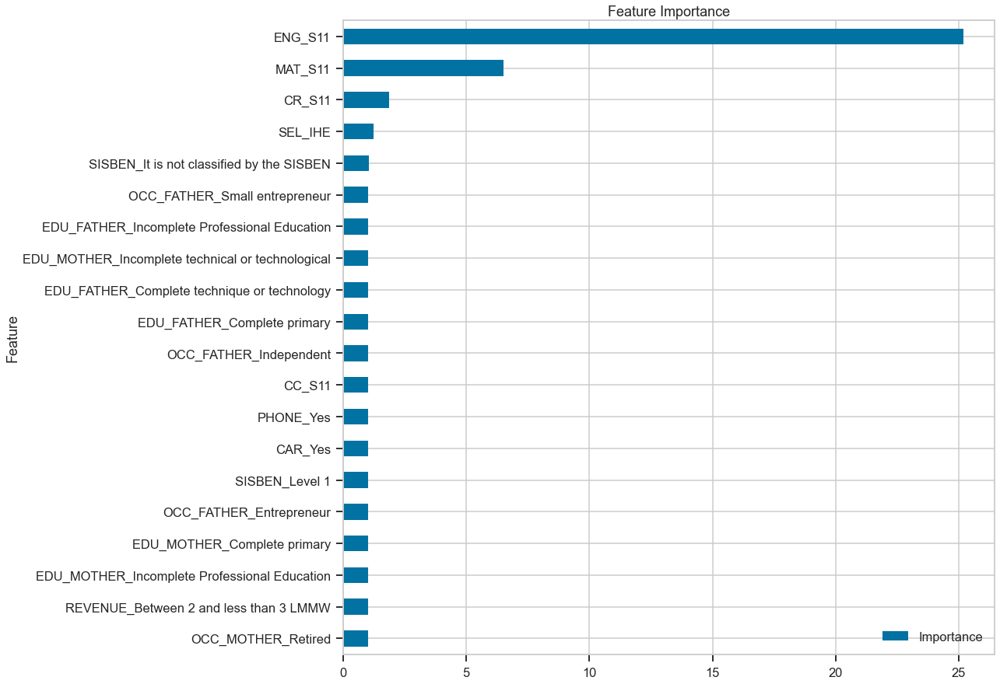

,Feature,Importance,Coefficient
21,OCC_MOTHER_Retired,1.000000,0.000000
36,REVENUE_Between 2 and less than 3 LMMW,1.000000,0.000000
35,EDU_MOTHER_Incomplete Professional Education,1.000000,0.000000
34,EDU_MOTHER_Complete primary,1.000000,0.000000
33,OCC_FATHER_Entrepreneur,1.000000,0.000000
31,SISBEN_Level 1,1.000000,0.000000
20,CAR_Yes,1.000000,0.000000
29,PHONE_Yes,1.000000,0.000000
30,CC_S11,1.000000,0.000000
27,OCC_FATHER_Independent,1.000000,0.000000


In [200]:
get_importance_logreg(log_reg_model2_CV_new, X_train_df_SE,top_n=20)

> The feature importance and the coefficients show that 3 HS test scores and 2 SocioEconomic characteristics are the most important predictors of a student's success. They all have negative coefficients: the higher their values, the less chance for a student to fail in the professional school.
The five most important ones are listed below in the order of their importance.

* **ENG_S11**
* **MAT_S11**
* **CR_S11**
* **SEL_IHE**
* **SISBEN_It is not classified by the SISBEN**

### Feature importance in RFClassifier best parameters model with SocioEconomic/HS scores features

EDU_MOTHER_Incomplete primary                          0.000152
SCHOOL_TYPE_TECHNICAL/ACADEMIC                         0.000103
STRATUM_Stratum 3                                      0.000066
OCC_FATHER_Operator                                    0.000000
REVENUE_Between 5 and less than 7 LMMW                 0.000101
                                                         ...   
STRATUM_Stratum 2                                      0.000091
OCC_MOTHER_Technical or professional level employee    0.000034
EDU_MOTHER_None                                        0.000000
STRATUM_Stratum 6                                      0.000130
OCC_FATHER_Small entrepreneur                          0.000080
Length: 80, dtype: float64

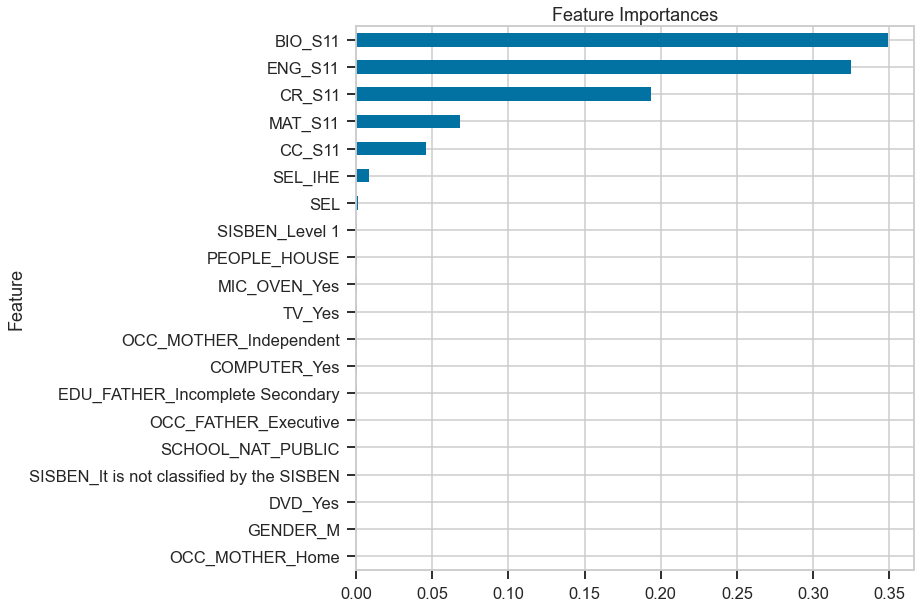

In [201]:
get_importance_tree(rfc2_new, X_train_df_SE, top_n=20)

> The RandomForestClassifier importance feature analysis also has student's HS test scores as important predictive features as well as several SocioEconomic features. Seven of them are listed in the order of their importance below:

* **ENG_S11**
* **BIO_S11**
* **CR_S11**
* **CC_S11**
* **MAT_S11**
* **SEL_IHE**

***
>There is apparent overlapping between the most important features of these models. 
The overlapping features are<br>

* **ENG_S11**
* **MAT_S11**
* **CR_S11**
* **SEL_IHE**<br><br>

>Out of which, the first 3 are indicative of a student's proficiency in mathematics, technology, and critical reasoning. At the same time, the last one is a measure of a  socio-economic level.

In [202]:
# A dataframe with the most important features from both models combined:
list_corr_=['ENG_S11','BIO_S11','CR_S11','CC_S11','MAT_S11','SEL_IHE']
X_train_df_corr=X_train_df_SE[list_corr_].copy()
X_train_df_corr.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9284 entries, 796 to 3582
Data columns (total 6 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   ENG_S11  9284 non-null   float64
 1   BIO_S11  9284 non-null   float64
 2   CR_S11   9284 non-null   float64
 3   CC_S11   9284 non-null   float64
 4   MAT_S11  9284 non-null   float64
 5   SEL_IHE  9284 non-null   float64
dtypes: float64(6)
memory usage: 507.7 KB


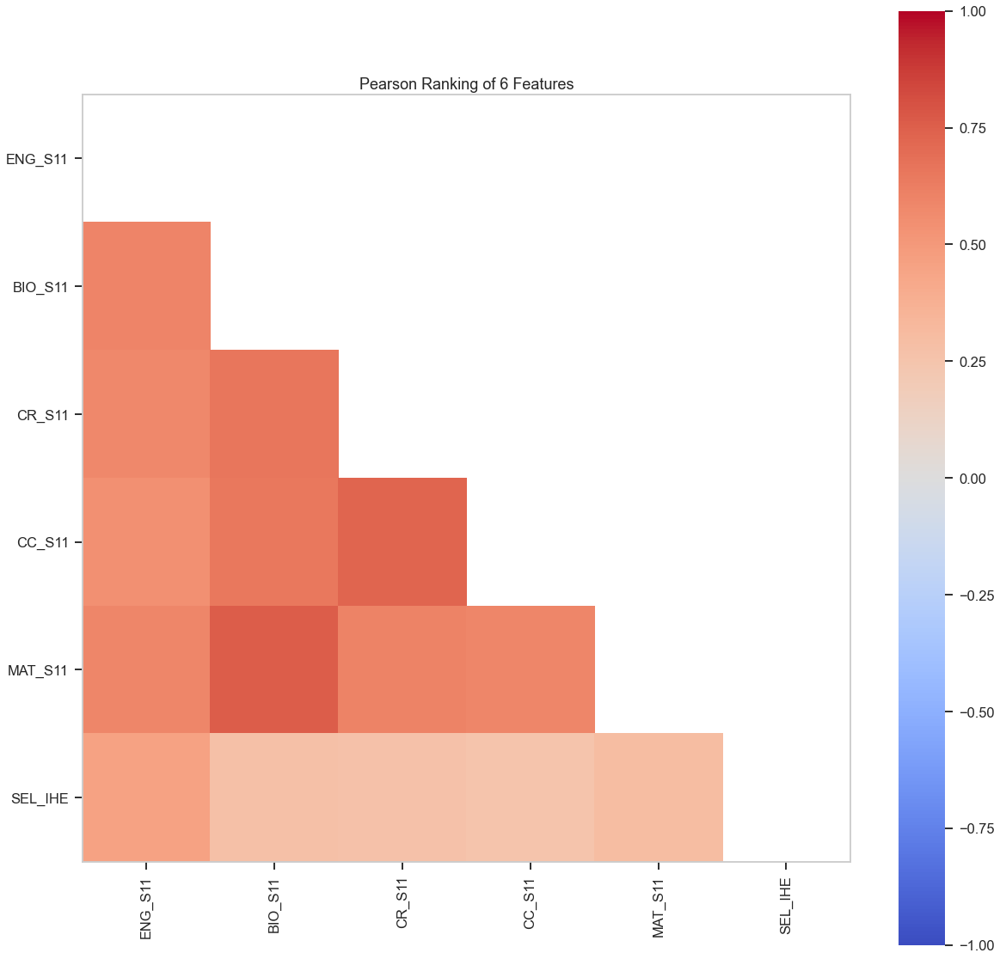

<AxesSubplot:title={'center':'Pearson Ranking of 6 Features'}>

In [203]:
fig,ax = plt.subplots(figsize=(20,20))
visualizer = Rank2D(algorithm='pearson', colormap='coolwarm', ax=ax, features=list(X_train_df_corr.columns))

# Fit the data to the visualizer
visualizer.fit(X_train_df_corr, y_train_final)

# Transform the data
visualizer.transform(X_train_df_corr)

visualizer.show()  

> It is obvious the correlation is there, but not much can be done about it.

### Feature importance in LogisticRegression best parameters model with Program/University features

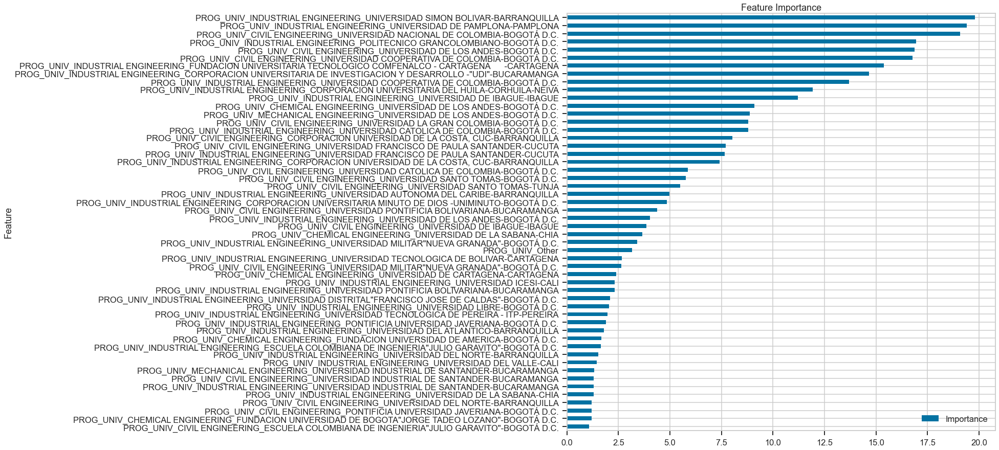

In [204]:
df_ranking_LR4=get_importance_logreg(log_reg_model4_new, X_test_df_UNVPRG, top_n=52)

In [205]:
a=df_ranking_LR4.sort_values(by='Coefficient').to_html()

text_file = open('rank_lr4.html', 'w')
text_file.write(a)
text_file.close()

In [206]:
HTML(filename='rank_lr4.html')

,Feature,Importance,Coefficient
17,PROG_UNIV_CIVIL ENGINEERING_UNIVERSIDAD NACIONAL DE COLOMBIA-BOGOTÁ D.C.,19.090912,-2.949212
11,PROG_UNIV_CIVIL ENGINEERING_UNIVERSIDAD DE LOS ANDES-BOGOTÁ D.C.,16.875082,-2.825838
4,PROG_UNIV_CHEMICAL ENGINEERING_UNIVERSIDAD DE LOS ANDES-BOGOTÁ D.C.,9.090962,-2.207281
49,PROG_UNIV_MECHANICAL ENGINEERING_UNIVERSIDAD DE LOS ANDES-BOGOTÁ D.C.,8.863693,-2.181963
34,PROG_UNIV_INDUSTRIAL ENGINEERING_UNIVERSIDAD DE LOS ANDES-BOGOTÁ D.C.,4.030777,-1.393959
3,PROG_UNIV_CHEMICAL ENGINEERING_UNIVERSIDAD DE LA SABANA-CHIA,3.652625,-1.295446
2,PROG_UNIV_CHEMICAL ENGINEERING_UNIVERSIDAD DE CARTAGENA-CARTAGENA,2.386380,-0.869778
41,PROG_UNIV_INDUSTRIAL ENGINEERING_UNIVERSIDAD ICESI-CALI,2.310623,-0.837517
39,"PROG_UNIV_INDUSTRIAL ENGINEERING_UNIVERSIDAD DISTRITAL""FRANCISCO JOSE DE CALDAS""-BOGOTÁ D.C.",2.083348,-0.733976
28,PROG_UNIV_INDUSTRIAL ENGINEERING_PONTIFICIA UNIVERSIDAD JAVERIANA-BOGOTÁ D.C.,1.883130,-0.632935


### Feature importance in LogisticRegression default parameters model with Program/University features

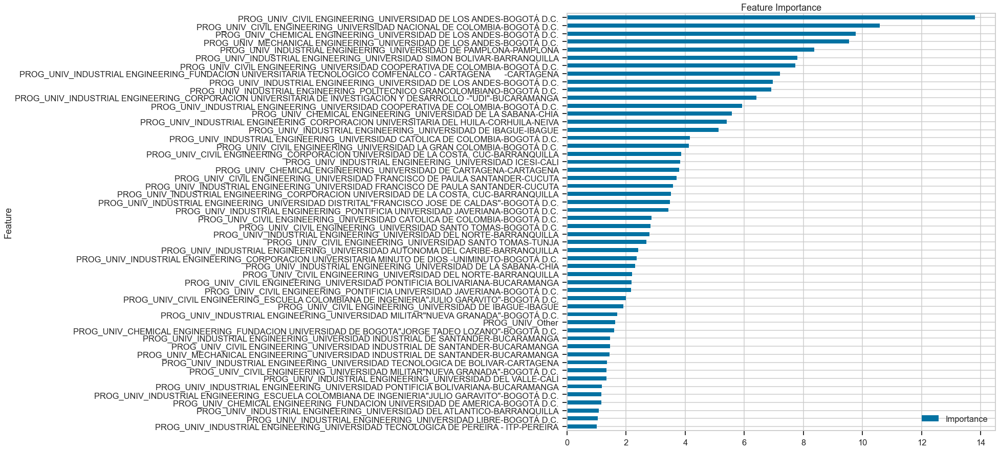

In [207]:
df_ranking_LR3=get_importance_logreg(logreg_model3_new, X_train_df_UNVPRG, top_n=52)

In [208]:
b=df_ranking_LR3.sort_values(by='Coefficient').to_html()

text_file = open('rank_lr3.html', 'w')
text_file.write(b)
text_file.close()

In [209]:
HTML(filename='rank_lr3.html')

,Feature,Importance,Coefficient
11,PROG_UNIV_CIVIL ENGINEERING_UNIVERSIDAD DE LOS ANDES-BOGOTÁ D.C.,13.802187,-2.624827
17,PROG_UNIV_CIVIL ENGINEERING_UNIVERSIDAD NACIONAL DE COLOMBIA-BOGOTÁ D.C.,10.578137,-2.358789
4,PROG_UNIV_CHEMICAL ENGINEERING_UNIVERSIDAD DE LOS ANDES-BOGOTÁ D.C.,9.762890,-2.278588
49,PROG_UNIV_MECHANICAL ENGINEERING_UNIVERSIDAD DE LOS ANDES-BOGOTÁ D.C.,9.551090,-2.256655
34,PROG_UNIV_INDUSTRIAL ENGINEERING_UNIVERSIDAD DE LOS ANDES-BOGOTÁ D.C.,6.967045,-1.941191
3,PROG_UNIV_CHEMICAL ENGINEERING_UNIVERSIDAD DE LA SABANA-CHIA,5.579093,-1.719026
41,PROG_UNIV_INDUSTRIAL ENGINEERING_UNIVERSIDAD ICESI-CALI,3.824514,-1.341431
2,PROG_UNIV_CHEMICAL ENGINEERING_UNIVERSIDAD DE CARTAGENA-CARTAGENA,3.801533,-1.335404
39,"PROG_UNIV_INDUSTRIAL ENGINEERING_UNIVERSIDAD DISTRITAL""FRANCISCO JOSE DE CALDAS""-BOGOTÁ D.C.",3.479286,-1.246827
28,PROG_UNIV_INDUSTRIAL ENGINEERING_PONTIFICIA UNIVERSIDAD JAVERIANA-BOGOTÁ D.C.,3.423682,-1.230716


***
Both models have equal Accuracy scores, while the model parameters are slightly different. The ranking of programs is absolutely the same. It is also essential to explore what direction each feature pulls the probability of a predicted value. SHAP technique will be beneficial in that.

## Permutation importance

### Permutation importance in LogisticRegressionCV best parameters model with SocioEconomic/HS scores features

In [210]:
permutation_of_features_logreg(log_reg_model2_new,X_train_df_SE, X_test_df_SE, y_test_final)

,Feature Importance,Coefficient,Permutation Importance
CR_S11,66.460521,-4.196608,0.012798
ENG_S11,51.313388,-3.937952,0.058787
BIO_S11,34.241189,-3.533429,0.006510
CC_S11,24.418425,-3.195338,0.004997
MAT_S11,14.268481,-2.658053,0.005988
SEL_IHE,2.071732,-0.728385,0.003901
OCC_FATHER_Entrepreneur,1.214932,0.194688,-0.001213
CAR_Yes,1.168274,0.155528,-0.003014
REVENUE_Between 2 and less than 3 LMMW,1.157135,-0.145948,-0.001696
REVENUE_Between 3 and less than 5 LMMW,1.113986,-0.107945,-0.001174


### Permutation importance in RFClassifier best parameters model  with SocioEconomic/HS scores features

In [211]:
permutation_of_features_tree(rfc2_new, X_train_df_SE, X_test_df_SE, y_test_final)

Feature Importanve vs Permutation importance for RandomForestClassifier(class_weight='balanced_subsample', max_depth=5,
                       max_features=50, min_samples_leaf=2, n_estimators=50,
                       random_state=123) model


,Feature_Importance,Permutation Importance
BIO_S11,0.348795,-0.000209
ENG_S11,0.325101,0.056660
CR_S11,0.193624,0.002779
MAT_S11,0.068199,-0.003666
CC_S11,0.045739,0.009237
SEL_IHE,0.008534,0.000183
SEL,0.001098,-0.000404
SISBEN_Level 1,0.000657,0.000535
PEOPLE_HOUSE,0.000604,-0.000261
MIC_OVEN_Yes,0.000526,-0.000509


> Feature permutation importance ranking of both models is congruent with Feature importance analysis results. Each important factor is also ranked high in the predictive value of a feature for these models.

### Permutation importance LogisticRegression best parameters model  with Program/University features

In [212]:
permutation_of_features_logreg(log_reg_model4_new, X_train_df_UNVPRG, X_test_df_UNVPRG, y_test_final)

,Feature Importance,Coefficient,Permutation Importance
PROG_UNIV_INDUSTRIAL ENGINEERING_UNIVERSIDAD SIMON BOLIVAR-BARRANQUILLA,19.799856,2.985675,0.010855
PROG_UNIV_INDUSTRIAL ENGINEERING_UNIVERSIDAD DE PAMPLONA-PAMPLONA,19.404994,2.965530,0.013555
PROG_UNIV_CIVIL ENGINEERING_UNIVERSIDAD NACIONAL DE COLOMBIA-BOGOTÁ D.C.,19.090912,-2.949212,0.006941
PROG_UNIV_INDUSTRIAL ENGINEERING_POLITECNICO GRANCOLOMBIANO-BOGOTÁ D.C.,16.948023,2.830151,0.013725
PROG_UNIV_CIVIL ENGINEERING_UNIVERSIDAD DE LOS ANDES-BOGOTÁ D.C.,16.875082,-2.825838,0.010802
PROG_UNIV_CIVIL ENGINEERING_UNIVERSIDAD COOPERATIVA DE COLOMBIA-BOGOTÁ D.C.,16.761787,2.819102,0.022518
PROG_UNIV_INDUSTRIAL ENGINEERING_FUNDACION UNIVERSITARIA TECNOLOGICO COMFENALCO - CARTAGENA -CARTAGENA,15.370559,2.732454,0.027723
"PROG_UNIV_INDUSTRIAL ENGINEERING_CORPORACION UNIVERSITARIA DE INVESTIGACION Y DESARROLLO -""UDI""-BUCARAMANGA",14.666567,2.685571,0.013568
PROG_UNIV_INDUSTRIAL ENGINEERING_UNIVERSIDAD COOPERATIVA DE COLOMBIA-BOGOTÁ D.C.,13.688790,2.616577,0.012303
PROG_UNIV_INDUSTRIAL ENGINEERING_CORPORACION UNIVERSITARIA DEL HUILA-CORHUILA-NEIVA,11.916582,2.477931,0.018761


### Permutation importance in LogisticRegression default parameters model with Program/University features

In [213]:
permutation_of_features_logreg(logreg_model3_new, X_train_df_UNVPRG, X_test_df_UNVPRG, y_test_final)

,Feature Importance,Coefficient,Permutation Importance
PROG_UNIV_CIVIL ENGINEERING_UNIVERSIDAD DE LOS ANDES-BOGOTÁ D.C.,13.802187,-2.624827,0.010802
PROG_UNIV_CIVIL ENGINEERING_UNIVERSIDAD NACIONAL DE COLOMBIA-BOGOTÁ D.C.,10.578137,-2.358789,0.006941
PROG_UNIV_CHEMICAL ENGINEERING_UNIVERSIDAD DE LOS ANDES-BOGOTÁ D.C.,9.762890,-2.278588,0.006445
PROG_UNIV_MECHANICAL ENGINEERING_UNIVERSIDAD DE LOS ANDES-BOGOTÁ D.C.,9.551090,-2.256655,0.009393
PROG_UNIV_INDUSTRIAL ENGINEERING_UNIVERSIDAD DE PAMPLONA-PAMPLONA,8.365988,2.124174,0.013594
PROG_UNIV_INDUSTRIAL ENGINEERING_UNIVERSIDAD SIMON BOLIVAR-BARRANQUILLA,7.798274,2.053902,0.010868
PROG_UNIV_CIVIL ENGINEERING_UNIVERSIDAD COOPERATIVA DE COLOMBIA-BOGOTÁ D.C.,7.719001,2.043685,0.022531
PROG_UNIV_INDUSTRIAL ENGINEERING_FUNDACION UNIVERSITARIA TECNOLOGICO COMFENALCO - CARTAGENA -CARTAGENA,7.213714,1.975984,0.027763
PROG_UNIV_INDUSTRIAL ENGINEERING_UNIVERSIDAD DE LOS ANDES-BOGOTÁ D.C.,6.967045,-1.941191,0.021096
PROG_UNIV_INDUSTRIAL ENGINEERING_POLITECNICO GRANCOLOMBIANO-BOGOTÁ D.C.,6.907896,1.932665,0.013751


> The permutation importance analysis does not provide any additional information.

## SHAP and Shapley Values for Model Interpretation

### RFClassifier best parameters model with SocioEconomic/HS scores features interpretation with SHAP

In [214]:
shap.initjs()

In [215]:
shap_values_rfc2 = shap.TreeExplainer(rfc2_new).shap_values(X_train_df_SE)

Shapley values plotting indicates a very 

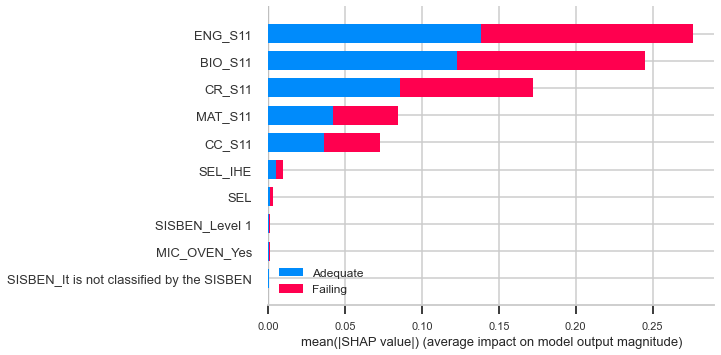

In [216]:
shap.summary_plot(shap_values_rfc2, X_train_df_SE, plot_type="bar", class_names=['Failing','Adequate'], max_display=10 )

> SHAP summary plots of decision tree-based algorithms are slightly different from other models. The plot above shows a split between target classes and is indicative of the balanced distribution of feature values between the classes. Such a plot would be more helpful in problem analysis of a multi=class problem.

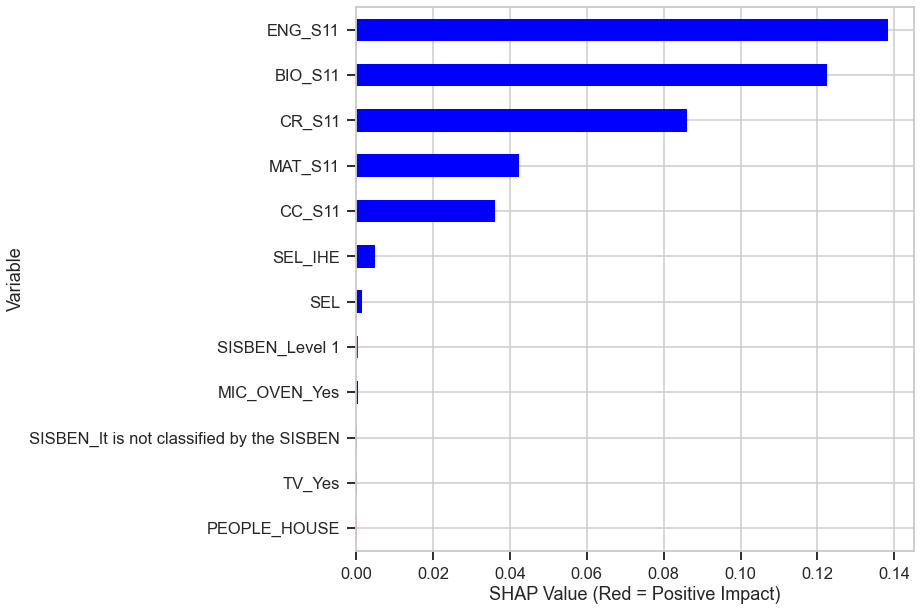

In [217]:
ABS_SHAP(shap_values_rfc2[1], X_train_df_SE, n=12, figure=(10,10))

> ABS_SHAP plot (see function's description) is showing that all important model's features pull a predicted outcome "away" from "Failing." The plot displays mean shapley values for each feature in the model; red features affect the outcome positively, while the blue ones do the opposite. 

### LogisticRegression CV best parametrs model with SocioEconomic/HS scores features interpretation with SHAP

In [218]:
shap_values_lrcv = shap.LinearExplainer(log_reg_model2_new, X_train_df_SE, feature_dependence="independent").shap_values(X_train_df_SE)

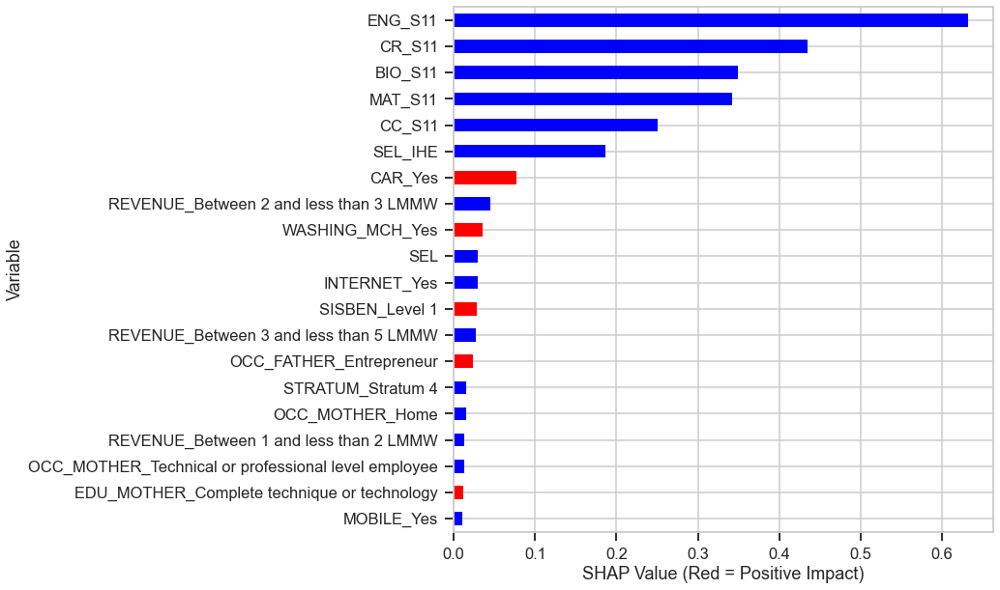

In [219]:
ABS_SHAP(shap_values_lrcv, X_train_df_SE, n=20, figure=(10,10))

> While the results of ABS_SHAP function are somewhat similar to the previous model results, the plot does display some peculiarities. Thus the model has CAR_yes variable in red, which means possession of a car is a factor that might affect the outcome in a positive direction. IT means that a student is slightly more prone to Fail (target=1) if the household has a car. A logical way of looking at that situation is to conclude that possession of a vehicle is a factor that would help students NOT fail. After all, in Colombia, a car is a measure of socio-economic level.

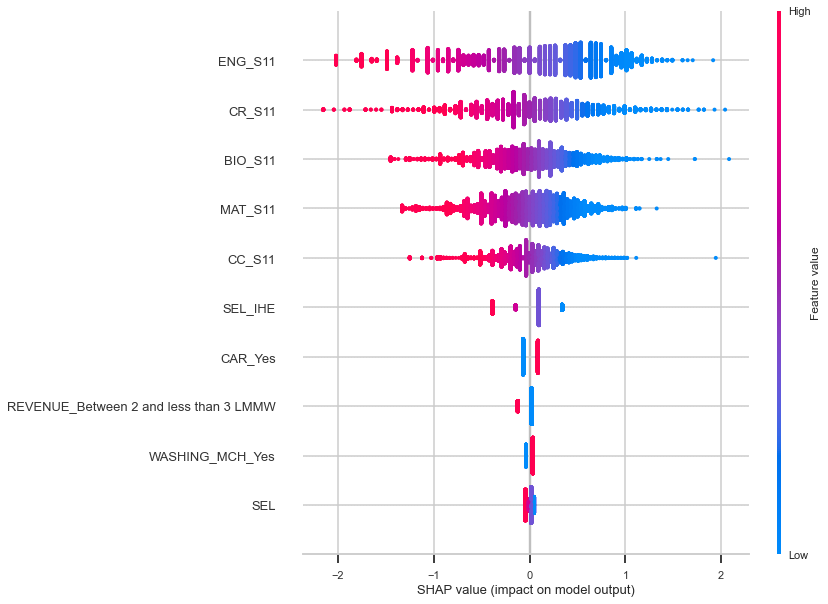

In [220]:
shap.summary_plot(shap_values_lrcv, X_train_df_SE, plot_size=(10.,10.), max_display=10)

* Vertical location shows what features it is depicting
* Color shows whether that feature was high or low for that row of the dataset
* Horizontal location shows whether the effect of that value caused a higher or lower prediction.

### LogisticRegression best parametrs model with University/Program features interpretation with SHAP

In [221]:
shap_values_lr4 = shap.LinearExplainer(log_reg_model4_new, X_train_df_UNVPRG,
                                       feature_dependence="independent").shap_values(X_train_df_UNVPRG)

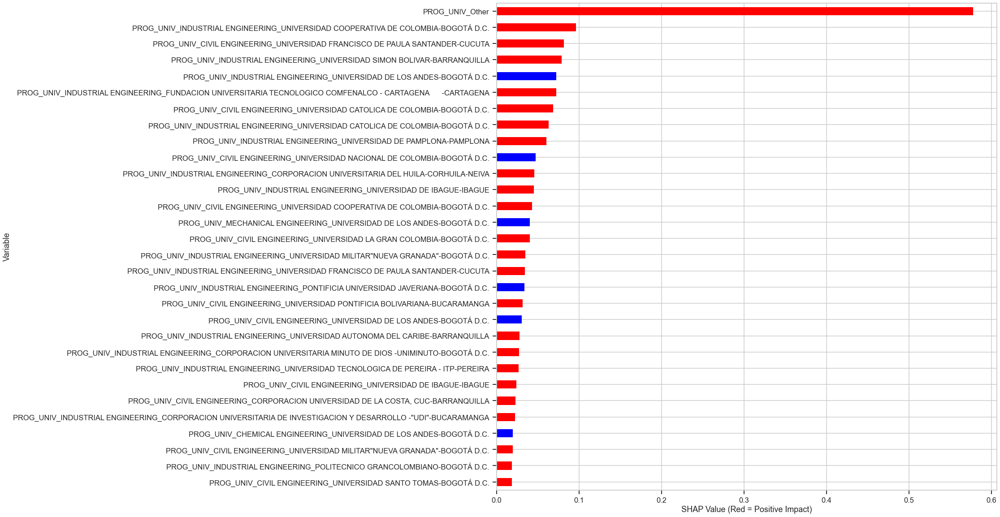

In [222]:
ABS_SHAP(shap_values_lr4, X_train_df_UNVPRG, n=30, figure=(20,20))

### LogisticRegression default parameters model with University/Program features interpretation with SHAP

In [223]:
shap_values_lr3 = shap.LinearExplainer(logreg_model3_new, X_train_df_UNVPRG, feature_dependence="independent").shap_values(X_train_df_UNVPRG)

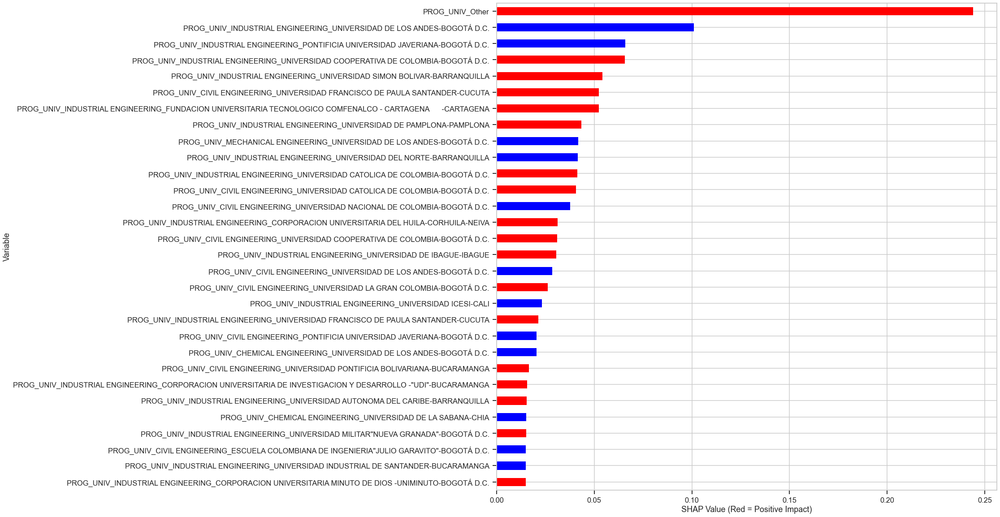

In [224]:
ABS_SHAP(shap_values_lr3, X_train_df_UNVPRG, n=30, figure=(20,20)) 

> The result of the shapley values plotted is a bit unusual. While the models displayed very similar results in ranking the programs, their shapley values are quite different.

### Using LIME to randomly test prediction from models

#### Comparing predictions from  LogisticRegression and RFClassifier models based on SocioEconomic/HS scores features

* A random observation from the test dataset shows how each model pulls out its' prediction.

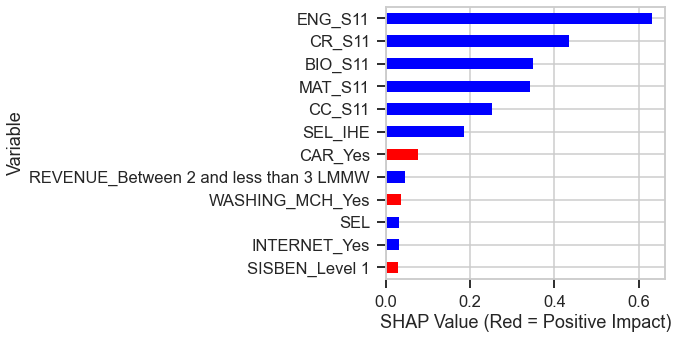

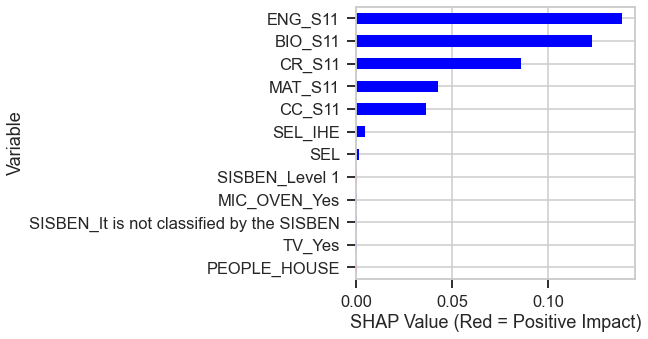

In [225]:
ABS_SHAP(shap_values_lrcv, X_train_df_SE, n=12, figure=(5,5))
ABS_SHAP(shap_values_rfc2[1], X_train_df_SE, n=12, figure=(5,5))

In [226]:
#Initalizing a tree explainer
explainer = lime_tabular.LimeTabularExplainer(X_train_df_SE.values, mode="classification", 
                                              class_names=['Adequate','Failing'],
                                              feature_names=X_test_df_SE.columns )

Prediction from the first model : Adequate
Prediction from the second model : Adequate
Actual :   Adequate 


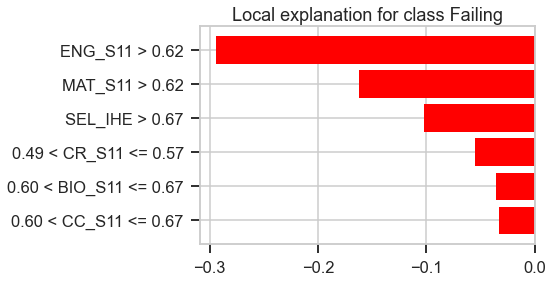

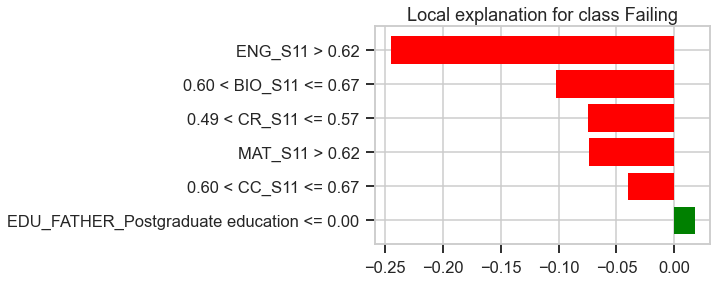

In [227]:
# An example of a single observation outcome and its' model prediction 
show_random_observation(log_reg_model2_new, rfc2_new, X_test_df_SE, y_test_final, explainer)

* To understand how models predict an outcome of each student's class performance we will review several use cases randomly chosen from a test dataset

<p float="left">
    <img src="images/model1_vs_model2_SE_adequate1.png" style="width:450px;float: left;">
     <img src="images/model1_vs_model2_SE_failed.png" style="width:450px;float: right;">
</p>


**Example 1:**<br>
* The first example is a student with outstanding HS test results in an Engineering program at a university with a wealthy student population. The student's performance in the professional program is far from failing. Even from a common-sense point of view, this student has all the factors playing in ze/zir favor.
* The prediction as such makes sense in both models though they sometimes disagree. This use case is not a ground for such disagreement. The predicted probability of such a student failing in a professional program is very low.
*  If we look at how the models have come to predicting the probability of the outcome, we can see that the most important factor is the student's HS scores in English and Biology tests. One model gives more importance to biology test results than another; the score was high enough to make it the second decisive factor in both models.  

**Example 2:**<br>
* The second example we have is a student with an opposite situation. The scores in all subject tests are much lower, and the socio-economic level of the students in the Institution of Higher Education is lower too. It means that the student is very likely to fail in the professional tests 
* In this case, common sense makes us conclude that such a student will have trouble catching up with the peers across all the programs in the dataset. Especially given the fact that ze/zir school is not the most affluent one. 

<p float="left">
    <img src="images/model1_vs_model2_SE_adequate2.png" style="width:450px;float: right;">
    <img src="images/model1_vs_model2_SE_failed2.png" style="width:450px;float: left;">
  </p>

The following two use cases are not that straightforward. Students have some of their HS scores in the lower range while others are in the higher range. 

**Example 3:**<br>
* The first use case is a student with poor HS test results in subjects others than Civics score. Both models were successful in predicting the actual outcome in this case. 
* The influence of the Civics score feature was not powerful enough to compensate for the poor performance in other tests.
*  Both models were successful in predicting the actual outcome in this case. 

**Example 4:**<br>
* The second use case is a relatively simple case of a student with strong HS scores and at not so affluent university program.
* This case indicates that the socio-economic factors (SEL_IHE and SISBEN are related categories) while being among the most important features, affect professional test scores less than the student's high-school test scores.
* The student succeeded, and both models correctly predicted the outcome. 

<p float="left">
    <img src="images/model1_vs_model2_SE_diff2.png" style="width:450px;float: left;">
     <img src="images/model1_vs_model2_SE_diff1.png" style="width:450px;float: right;">
</p>

The subsequent two use cases are the most interesting ones; the models, at least one of them, failed to predict the student's performance correctly. 

**Example 5:**<br>
* In the first use case HS test scores are a mixed bag; also, a student is from a relatively low-income family. The first model predicted his performance correctly, the second one was wrong. 
* The importance of the Mathematics HS score in the first model is higher than its importance in the second model (meaning relative importance), especially compared to the English score. At the same time, the second model puts too much emphasis on an English score. Most probably, the prediction of the second model is the result of a combination of both factors.
* More investigation into these factors is needed.
* A combination of both models might be beneficial for the accuracy of prediction.

**Example 6:**<br>
* The last use case is one of those situations when both models failed to predict the outcome correctly. It is a case all the factors favored the student succeeding, but Ze/zir failed anyway. The HS test scores were high. It is not very clear what ze/zir socio-economic level was. There might have been some factors of personal nature that are impossible to predict. The student possibly had a rough patch in ze/zir life or mental breakdown when taking the professional tests. Anything is possible. There always will be some outliers that are impossible to predict. 
* It is essential to understand that no model is perfect. Sometimes they fail to predict the target correctly. But those cases are extremely rare. It took me a while to find an example in the test dataset using the combination of predictions and the actual value as described.


# Conclusions and Recommendation

**Recommendations to university officials looking for a method to identify incoming students at risk of falling behind early:**

* Implement a system based on the suggested Machine Learning model that helps in identifying freshmen students that have a higher probability of failing in their professional studies.
* Provide additional help to these students to raise their base knowledge of English, Biology, Critical Reading, and Mathematics. Possibly as tutoring or extra classes.
* While it is not an easily controlled factor, SHE_IHE influence on the outcome suggests that it might be beneficial to find out how this factor affects an engineering educational process.
* Is it correlated with high school scores of students' population? As the higher is overall income-the higher is the overall quality of the schools. Or is it that schools with higher SEL_IHE can pay more to their faculty and staff (tuition is more elevated and less money is spent on providing financial assistance to low-income students)? It is a question to be answered before making any recommendations

**Recommendations to potential students:**
* Consider Programs/Universities with a higher ranking in the field; it will pay off in your professional results
* Our model list of ranked Programs/Universities might be a starting point.
* Most highly ranked Programs/Universities are located in the capital. Consider moving away from home to have better prospects in your professional life.
<br>

<p>
    <img src="images/ranking_universities_models.png" style="width:800px">
</p><br>
<br>

**Limitations of the model:**
* The original dataset does not include other essential factors, and therefore the models are biased
* The overall performance of any of the final models is not perfect. 
* Some variables in the dataset are correlated with each other, affecting the predictive power of the models.

**Suggestion for future improvements**:
* Built a regression model instead of a classification one.  Classification models are too indiscrete in their predictions.
* Add variables to the original dataset that better describe socio-economic level of a student.
* Consider global score for HS tests to avoid scores correlation
* Update the dataset with more current data.